This notebook serves as a comprehensive description of temperature prediction conducted by a neural network over a specific area of interest. The prediction model combines localized sensor data with global climate information obtained from the ERA5 database and ARPA stations.

The primary objective is to train the neural network to predict temperatures at specific locations within the study area. These locations are equipped with Bluetooth sensors that record the local temperature. The neural network utilizes climate data as inputs, which are derived from the ERA5 database and ARPA stations. These data are computed based on the sensor locations and include the following variables:

- Shortwave radiation
- Longwave radiation
- Wind speed
- Reference temperature
- Reference relative humidity (uniform across sensor locations)
- Precipitation (uniform across sensor locations)
- Pressure (uniform across sensor locations)
- Cloud cover (uniform across sensor locations)
- Specific humidity (uniform across sensor locations)

The data mentioned above are computed for the sensor locations using a physical model that incorporates global climate data and terrain features to downscale the climate variables within the study area.

The notebook is organized into three main sections:

1. The first section provides a detailed example of how the input data are handled, how the model is constructed, and how to evaluate the model's characteristics.

2. The second section loads the data related to the terrain properties of the study area.

3. The third section establishes the models for all relevant time periods using data acquired from both the ERA5 dataset and the integration of ERA5 database with data collected by the ARPA station.

4. The fourth section shows the evolution of the MAE differences between the ERA5 database and the ARPA station

5. The last section shows how to predict the temperature over the whole study area for a period of interest

The following python packages are imported:

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import sys
import os
import copy
import pickle
import random

import matplotlib as mpl
mpl.rcParams["font.family"] = "Times New Roman"

from scipy.stats import linregress

import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, Input, Flatten

from sklearn.linear_model import LinearRegression

# Check for TensorFlow GPU access
print(f"TensorFlow has access to the following devices:\n{tf.config.list_physical_devices()}")
# Check TensorFlow version
print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tf.keras.__version__}")
gpu = len(tf.config.list_physical_devices('GPU')) > 0
print('GPU is available:',gpu)

DATETIME = datetime.now().strftime("%d-%m-%Y_%H-%M-%S") 

USER_PATH = '/Users/marcozanchi/Work/Grade/'
DATA_PATH = USER_PATH + 'microclima/data/'
RESULTS_PATH = USER_PATH + 'microclima/notebooks/results/'
LIB_PATH = USER_PATH + 'microclima/lib/'

TensorFlow has access to the following devices:
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
TensorFlow version: 2.9.0
Keras version: 2.9.0
GPU is available: True


In [2]:
sys.path.append(LIB_PATH + 'machine_learning')
from machine_learning_ffnn import MachineLearningFFNN

# Example

In this section, an example is presented to showcase the steps involved in preparing the data for the neural network, training it, and analyzing its results. These steps will later be encapsulated within a class for application in the subsequent sections. The example utilizes data collected from sensors and the ERA5 database, covering the period from November 12, 2022, to January 15, 2023.

## Load and split data

The data is extracted from the output dataframes of the 'notebook_physical_model' and stored in a pandas dataframe. This dataframe includes the climate data and sensor recordings for each hour, day, month, and year within the specified period of interest. The sensor data is randomly divided into three sets (according to the sensor nickname): the training set, validation set, and test set.

The training set consists of data from 14 sensors and is used to train the neural network. The validation set, also comprising data from 1 sensor, is employed to validate the training process. The final weights of the neural network are determined by minimizing the loss function over the validation set. The test set, again containing data from 5 sensors, is utilized to assess the accuracy of the neural network.

To ensure reproducibility of the random division, a seed parameter has been defined.

In [3]:
sys.path.append(LIB_PATH + 'machine_learning')
from elaborate_data_utility import load_split_data

In [4]:
df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p'
df_train, df_test, df_validation = load_split_data(df_filename, seed = 18, test_train_proportion = 0.3, val_test_proportion = 0.3)


## Prepare input and output

Two arrays have been created from each dataset. The first array contains the input climate data, while the second array contains the target variable, which represents the temperature measured by the sensors.

To normalize the input variables, the average and standard deviation have been computed for each input variable for the training set. These statistical measures have been used to transform the input variables, ensuring they are adjusted to a standardized scale, as following:

\begin{equation}
 Input_{normalized} = \frac{Input - m}{std}
\end{equation}

In [5]:
sys.path.append(LIB_PATH + 'machine_learning')
from elaborate_data_utility import get_data_from_df

In [6]:
input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']

X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'T_target')
X_validation, y_validation = get_data_from_df(df_validation, input_variables = input_variables, target_variable = 'T_target')
X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'T_target')

In [7]:
#normalization
_m = np.mean(X_train, axis=0)
_s = np.std(X_train, axis=0)

X_train = ((X_train - _m) / _s)
X_validation = ((X_validation - _m) / _s)
X_test =  ((X_test - _m) / _s)

train_data_rescale_params = {
    "mean": _m,
    "std": _s
}

## Create the model

The feed forward neural network is implemented using the powerful Keras and TensorFlow libraries, renowned for their extensive capabilities in deep learning. In the present research, a feed forward neural network with four hidden layers is employed. These layers consist of 1024, 512, 256, and 128 neurons, respectively. By incorporating multiple hidden layers, the network can effectively capture intricate patterns and relationships within the input data, enabling more complex computations and higher-level feature extraction. 

To introduce non-linearity and enhance the network's expressive power, a sigmoidal activation function is chosen for the hidden layers. The sigmoid function effectively maps the neuron outputs into a range between 0 and 1, allowing for the representation of non-linear relationships and ensuring efficient gradient propagation during the training process. The sigmoid function is defined as:
\begin{equation}
 \sigma(x) = \frac{1}{1+e^{-x}}
\end{equation}

When evaluating the neural network's performance, the primary loss function used is the Log-Cosh loss, which is particularly suitable for regression problems. It provides a smooth and robust measure of the discrepancy between predicted and target values, accommodating the potential presence of outliers or extreme values in the dataset. It is defined as:
\begin{equation}
 L(y, y^p) = \sum_{i=1}^N log(cosh(y_i^p-y_i))
\end{equation}

Furthermore, the mean squared error (MSE) and mean absolute error (MAE) are also calculated as additional evaluation metrics. While they do not directly influence the selection of the best weights during validation, they provide valuable insights into the overall performance and precision of the neural network. MSE measures the average squared difference between predicted and actual values, emphasizing larger errors, while MAE computes the average absolute difference, providing a more intuitive understanding of the average prediction error. They have been defined as following:
\begin{equation}
 MSE(y, y^p) = \frac{\sum_{i=1}^N (y_i^p-y_i)^2}{N}
\end{equation}
\begin{equation}
 MAE(y, y^p) = \frac{\sum_{i=1}^N |y_i^p-y_i|}{N}
\end{equation}

The Adam optimizer, an advanced gradient descent optimization algorithm, is utilized to minimize the loss function. Adam stands for "Adaptive Moment Estimation" and is widely recognized for its effectiveness in optimizing neural networks.
With Adam, the optimization process is performed by adjusting the network's weights iteratively, leveraging both the first and second moments of the gradients to adaptively update the learning rate for each weight parameter.

In [8]:
sys.path.append(LIB_PATH + 'machine_learning')
from model_utility import create_model

In [9]:
MAX_N_NEURONS = 1024
MIN_N_NEURONS = 128
N_LAYERS = 4
SEED = 18

LEARNING_RATE=0.001

ACTIVATION = 'sigmoid'
LOSS = 'log_cosh'
METRICS = ['mean_squared_error','mean_absolute_error']

In [10]:
model = create_model(max_n_neurons = MAX_N_NEURONS, min_n_neurons = MIN_N_NEURONS, n_layers = N_LAYERS, 
                     learning_rate = LEARNING_RATE, activation = ACTIVATION,
                     loss = LOSS, metrics = METRICS, input_shape = X_train[0].shape)
model.summary()

Metal device set to: Apple M1
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense (Dense)               (None, 1024)              10240     
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dense_3 (Dense)             (None, 128)               32896     
                                                                 
 dense_4 (Dense)             (None, 1)                 129       
                                                                 
Total params: 699,393
Trainable

2023-06-21 15:21:35.204013: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-21 15:21:35.204269: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


## Training

The feed forward neural network undergoes training, where the model's weights are iteratively adjusted to minimize the loss function. At the conclusion of the training phase, the set of weights that yields the lowest validation loss is selected and utilized for subsequent predictions and evaluations.

In [11]:
sys.path.append(LIB_PATH + 'machine_learning')
from model_utility import train_model

sys.path.append(LIB_PATH + 'plotting_methods')
from machine_learning_plots import plot_history

In [12]:
EPOCHS = 5
PATIENCE = 5

In [13]:
model, history_df = train_model(model = model, X_train = X_train, y_train = y_train,
                                X_validation = X_validation, y_validation = y_validation,
                                epochs = EPOCHS, patience = PATIENCE,
                                metric_to_monitor = 'val_loss',restore_best_weights = True,
                                verbose = 1)

Epoch 1/5


2023-06-21 15:21:40.293919: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-06-21 15:21:40.457731: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


683/683 [==============================] - ETA: 0s - loss: 1.3493 - mean_squared_error: 6.2595 - mean_absolute_error: 1.9019

2023-06-21 15:21:46.084316: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


683/683 [==============================] - 6s 8ms/step - loss: 1.3493 - mean_squared_error: 6.2595 - mean_absolute_error: 1.9019 - val_loss: 1.0740 - val_mean_squared_error: 4.1587 - val_mean_absolute_error: 1.6151
Epoch 2/5
683/683 [==============================] - 6s 8ms/step - loss: 1.0002 - mean_squared_error: 3.8400 - mean_absolute_error: 1.5297 - val_loss: 1.0073 - val_mean_squared_error: 3.7669 - val_mean_absolute_error: 1.5448
Epoch 3/5
683/683 [==============================] - 6s 8ms/step - loss: 0.9776 - mean_squared_error: 3.7237 - mean_absolute_error: 1.5051 - val_loss: 0.9614 - val_mean_squared_error: 3.5510 - val_mean_absolute_error: 1.4914
Epoch 4/5
683/683 [==============================] - 5s 8ms/step - loss: 0.9432 - mean_squared_error: 3.5655 - mean_absolute_error: 1.4658 - val_loss: 0.9366 - val_mean_squared_error: 3.4870 - val_mean_absolute_error: 1.4532
Epoch 5/5
683/683 [==============================] - 5s 8ms/step - loss: 0.8858 - mean_squared_error: 3.3009 -

The trend of the loss function for both the training and validation sets is depicted below:

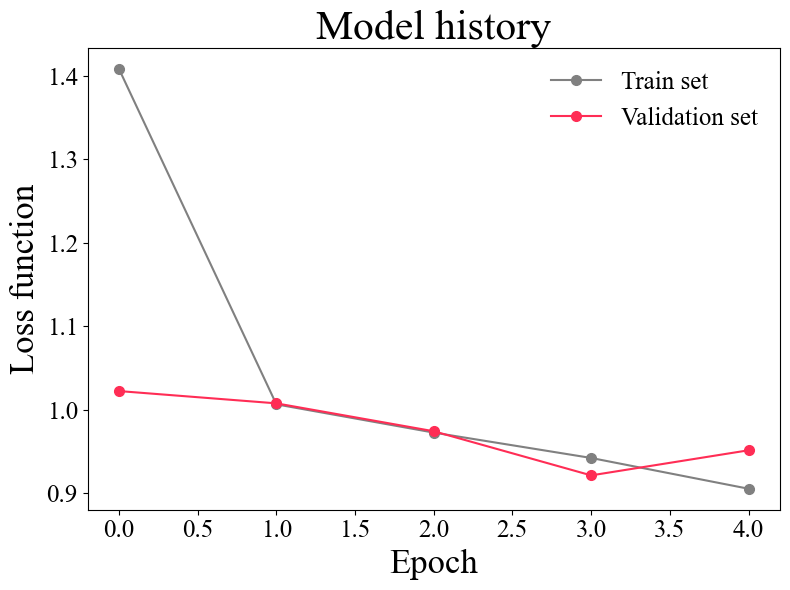

In [14]:
fig, ax = plot_history(history_df, title = 'Model history',
                                   color_train = "0.5",
                                   color_val =  "#ff2d55", 
                                   )

## Model evaluation

The model's accuracy is assessed by evaluating its performance on the test set, using metrics such as mean absolute error and the determination coefficient $R^2$ parameter. To ensure the neural network does not merely replicate the reference temperature input, a benchmark error is calculated by treating the reference temperature as the "predicted value".

In [15]:
sys.path.append(LIB_PATH + 'plotting_methods')
from machine_learning_plots import plot_results_test_R2, plot_distribution_test_mae

In [16]:
y_test_pred = model.predict(X_test, verbose=0)
y_test_pred = y_test_pred.reshape(len(y_test))
y_bench = df_test.T_ref.values
print('Benchmark vs prediction mae:',np.mean(np.abs(y_test-y_bench)),' ', np.mean(np.abs(y_test-y_test_pred)))
print('Benchmark vs prediction r2:', linregress(y_test, y_bench).rvalue ** 2,' ', linregress(y_test, y_test_pred).rvalue ** 2)

2023-06-19 11:59:16.187887: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 4.24807096226535   1.4311986884888719
Benchmark vs prediction r2: 0.4760257459292029   0.6511276068538817


The figure presented below showcases a scatterplot that illustrates the differences between the true temperature values and the corresponding predicted values for each point in the test set. The scatterplots are further divided to distinguish between the daylight (red) and nighttime (lightblue) periods.

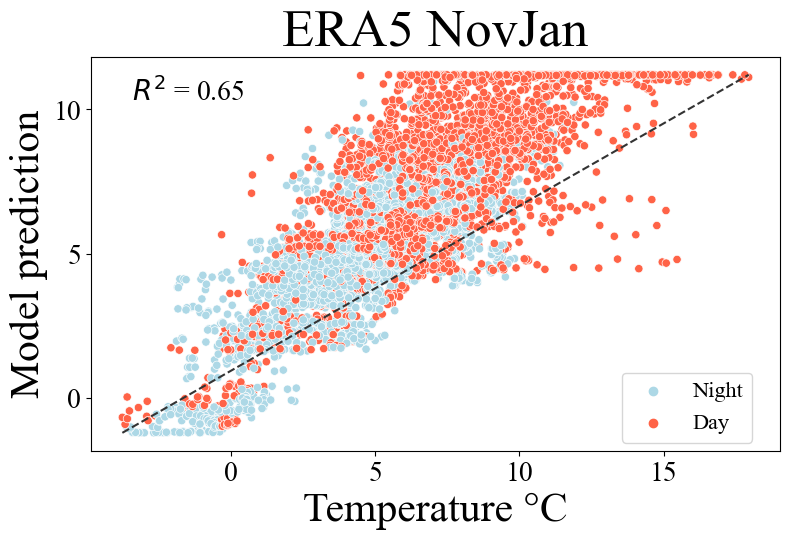

In [17]:
fig,ax = plot_results_test_R2(y_test, y_test_pred, df_test.Hour.values, title='ERA5 NovJan', xlabel = 'Temperature °C')

The figure below illustrates the distribution of mean absolute errors within the test set, categorized by the daylight (red) and nighttime (lightblue) periods. The histograms have been normalized to ensure that the area under each histogram is equal to 1. The $R^2$ value computed across the entire test set is represented in the upper left corner.

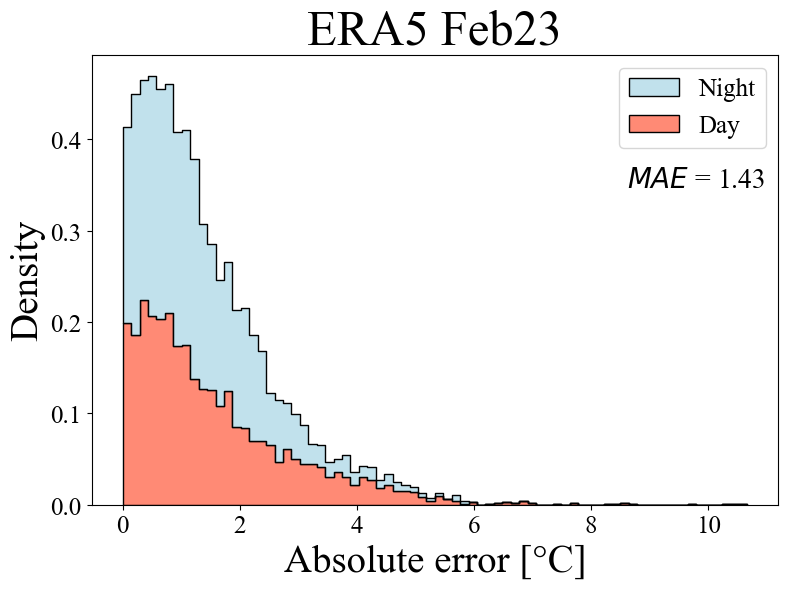

In [18]:
fig,ax = plot_distribution_test_mae(y_test, y_test_pred, df_test.Hour.values,
                               title='ERA5 Feb23', xlabel = "Absolute error [°C]",
                               thr=-1,stat='density')


## Model interpretation

In order to address the inherent black-box nature of neural networks, a method is proposed to interpret the significance of input variables on the output. This approach involves systematically replacing each input variable, one at a time, with random values within its minimum and maximum range while keeping the remaining inputs unchanged. 

The neural network is then evaluated using this randomized test set, and both the $R^2$  (coefficient of determination) and MAE (mean absolute error) are computed. These values are then compared to the corresponding values obtained from the original non-randomized test set (as obtained in the previous section).

To account for statistical variations, this randomization process is repeated multiple times. The mean and standard deviation of the differences in $R^2$  and MAE between the randomized and original scenarios are computed to obtain the final values. If a variable exhibits substantial deviations in both $R^2$  and MAE from the original values, it indicates that it plays a crucial role in the prediction process.

In summary, by analyzing the variations in $R^2$  and MAE resulting from input randomization, the importance of each variable in the neural network's prediction can be determined.

The plot below showcases the average variations in $R^2$ and MAE for each input variable, accompanied by error bars representing the standard deviation. These variations are computed by comparing the original values with the values obtained from the randomized inputs.

In [14]:
sys.path.append(LIB_PATH + 'plotting_methods')
from machine_learning_plots import plot_inputs_importance

2023-06-21 15:22:08.442492: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


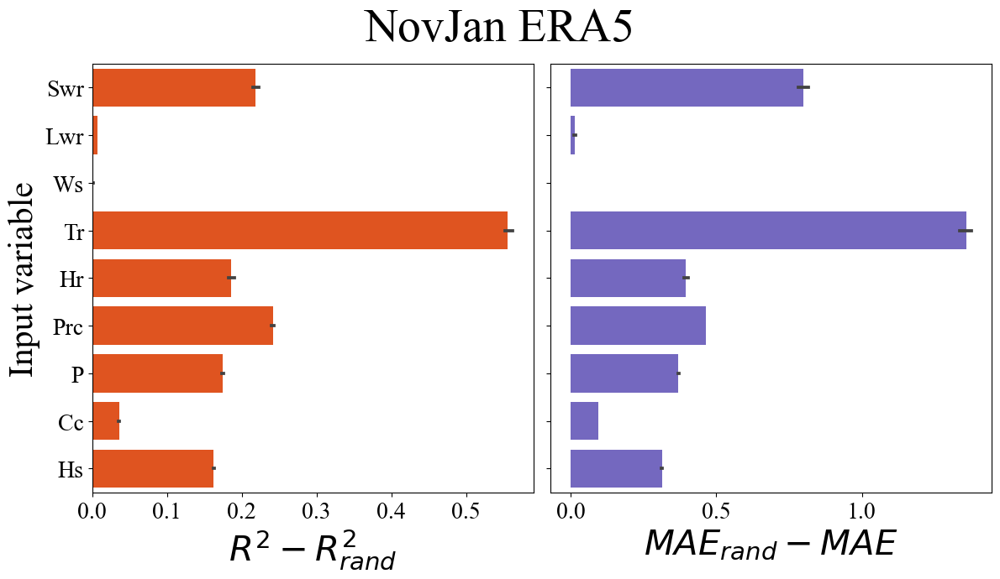

In [15]:
fig, ax = plot_inputs_importance(model, df_test, X_test, y_test, input_variables,
                       n_simul = 3, model_name = 'NovJan ERA5')

## Cross period prediction

The following plots depict the performance of the neural network, which was trained on a specific period, when tested on data collected from another period. This evaluation aims to test the network's ability to reproduce predictions under different climate conditions. The plots include the $R^2$ scores and mean absolute errors for the cross-period predictions.

In [21]:
sys.path.append(LIB_PATH + 'plotting_methods')
from machine_learning_plots import plot_cross_period_prediction

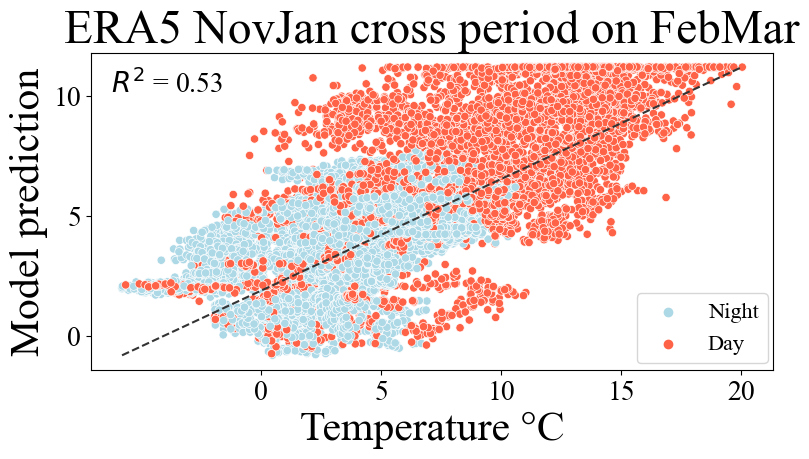

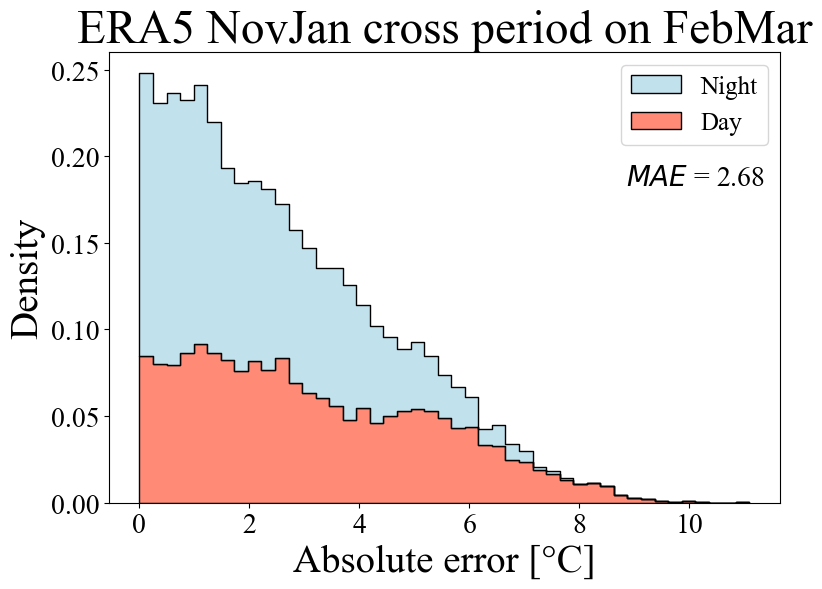

In [22]:
df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p'
input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
target_variable = 'T_target'
period_name_model = 'ERA5 NovJan'
cross_period_name = 'FebMar'


fig_r2, ax_r2, fig_mae, ax_mae = plot_cross_period_prediction(df_filename_cross_period = df_filename_cross_period, model = model, 
                             train_data_rescale_params = train_data_rescale_params, input_variables = input_variables,
                             target_variable = target_variable, 
                             period_name_model = period_name_model, cross_period_name = cross_period_name
                            )




## Spatial prediction over the study area

The neural network, trained on the sensor locations, can be extended to make predictions on temperature variations across the entire study area. This extension is made possible by computing the values of the input climate variables over the study area using the physical model described in the 'notebook_physical_model'.

The following plots showcase the predicted temperature variations at specific time instances, offering a comprehensive visualization of the temperature distribution across the entire study area.

In [23]:
sys.path.append(LIB_PATH + 'physical_model')
from terrain_utility import terrain, skyviewfactor
from utility import smooth

sys.path.append(LIB_PATH + 'plotting_methods')
from machine_learning_plots import plot_microclimate_prediction_over_study_area

In [24]:
lat = 45.7247139
long = 9.6975472

filename = DATA_PATH + 'data_torreboldone/dsm_TorreBoldone.p'    
infile = open(filename, 'rb')
dsm = pickle.load(infile)
dsm = smooth(dsm,smooth_side = 2)
resolution = 2

slope = terrain(dsm, 'slope')
aspect = terrain(dsm, 'aspect')

ha, svf = skyviewfactor(dsm, steps = 36, reso = 2)
study_area_coordinates = [804,619,422,588]
         
df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2022_11_12__2023_01_15.p')

periods = [
    [2023,1,10,10],
    [2023,1,10,11],
    [2023,1,10,13],
    [2023,1,10,14]
]

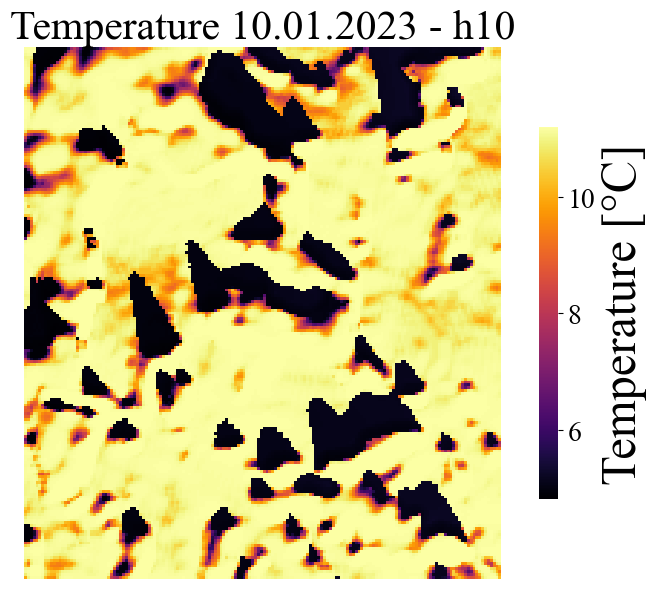

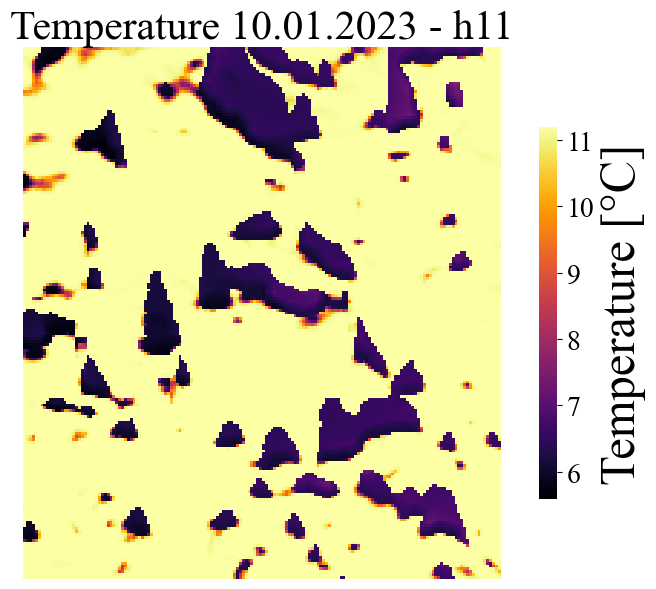

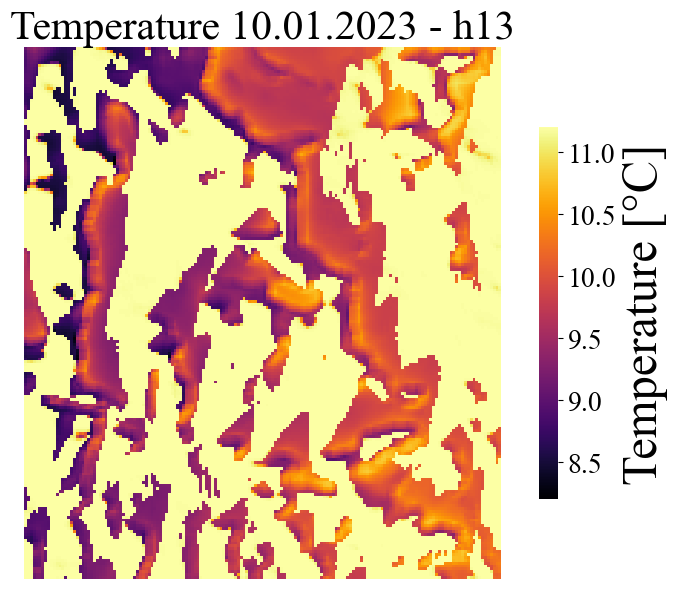

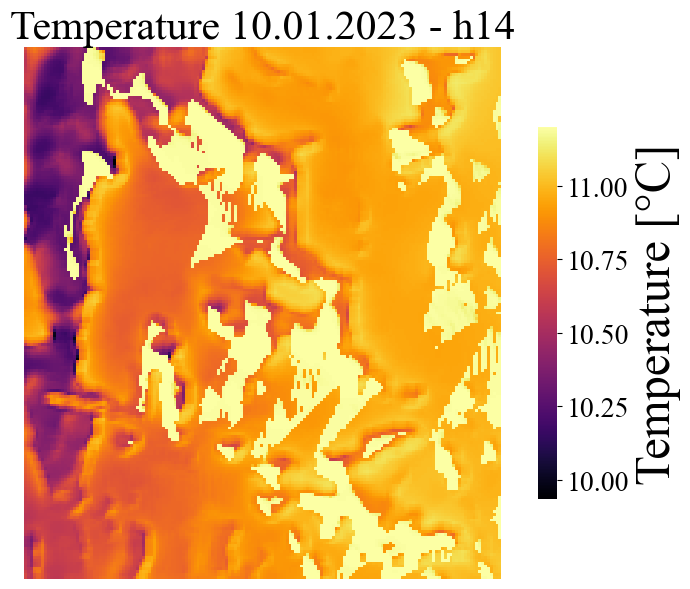

In [25]:
for period in periods:
    
    fig, ax = plot_microclimate_prediction_over_study_area(
                    model = model, target_variable = target_variable, train_data_rescale_params = train_data_rescale_params,
                    df_climate = df_climate, period = period,
                    lat = lat, long = long, dsm = dsm, resolution = resolution,
                    slope = slope, aspect = aspect, ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                    figsize=(8,6), aspect_heatmap = 1, shrink = 0.7,tick_params_labelsize = 20, ylabel_fontsize = 35,
                    title_fontsize = 30
                                                          )

## MachineLearningFFNN class

The MachineLearningFFNN class encapsulates all the aforementioned operations and plotting methods, allowing for a more concise and streamlined execution of the entire procedure. This class efficiently combines and integrates all the necessary steps to train the neural network, evaluate its performance, and generate the relevant plots, providing a more compact and organized approach to the overall process.

In [3]:
sys.path.append(LIB_PATH + 'machine_learning')
from machine_learning_ffnn import MachineLearningFFNN

sys.path.append(LIB_PATH + 'physical_model')
from terrain_utility import terrain, skyviewfactor
from utility import smooth

Metal device set to: Apple M1
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense (Dense)               (None, 1024)              10240     
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dense_3 (Dense)             (None, 128)               32896     
                                                                 
 dense_4 (Dense)             (None, 1)                 129       
                                                                 
Total params: 699,393
Trainable

2023-06-21 15:23:30.752940: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-21 15:23:30.753033: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-06-21 15:23:30.893632: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-06-21 15:23:31.060349: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 15:23:35.982767: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 15:38:30.060722: I tensorflow/core/grappler/o

Benchmark vs prediction mae: 4.24807096226535   0.42366490959309083
Benchmark vs prediction r2: 0.4760257459292029   0.9428516901352519


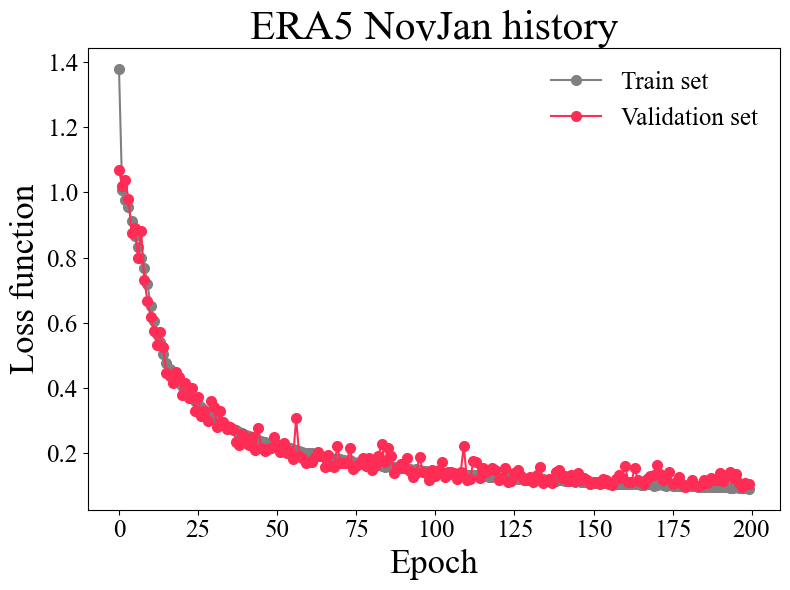

In [4]:
ML = MachineLearningFFNN(model_type_name = 'ERA5',
                         model_period_name = 'NovJan',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'T_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data(seed = 18,
                        test_train_proportion = 0.3,
                        val_test_proportion = 0.3,
                       )

ML.create_model(display_summary = True)

ML.train(epochs = 200, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.test()

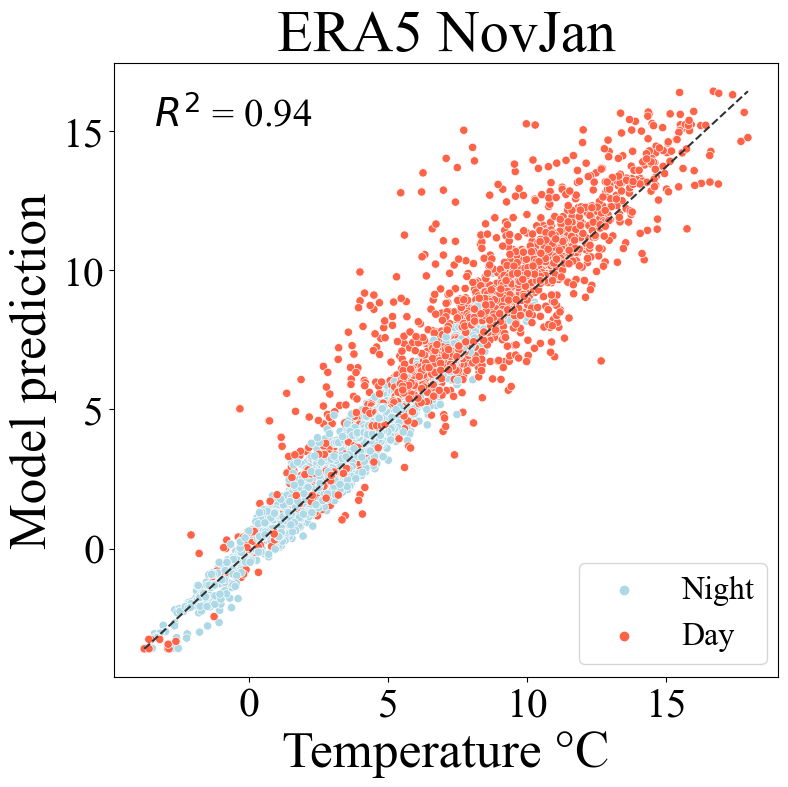

In [5]:
fig,ax = ML.make_plot_results_test_R2(
    figsize=(8, 8), xfontsize = 37, yfontsize = 37, title_fontsize = 42,
    ticks_fontsize = 30, r2_fontsize = 28, r2_loc = (0.06, 0.95),
    legend_fontsize = 23, legend_loc = (0.70,0.02))

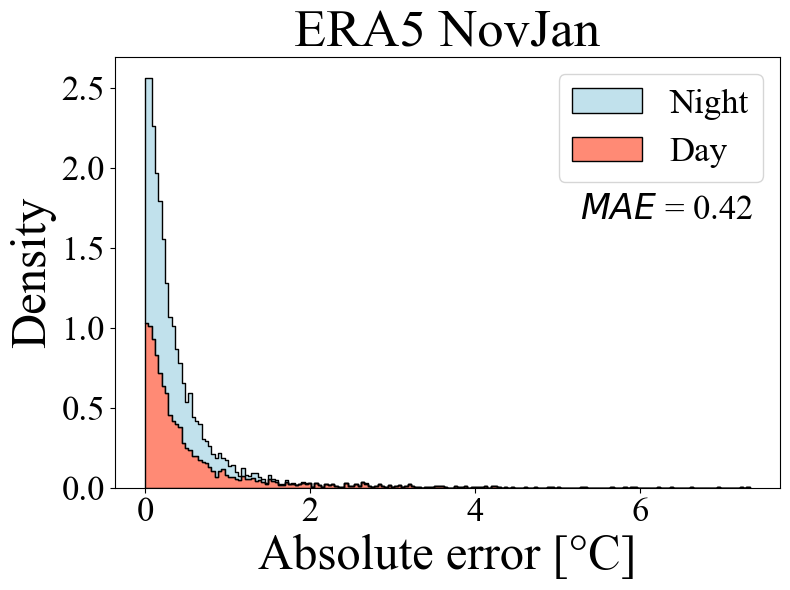

In [6]:
fig,ax = ML.make_plot_distribution_test_mae(
    figsize=(8, 6), xfontsize = 35, yfontsize = 35, title_fontsize = 38,
    ticks_fontsize = 25, mae_fontsize = 25, mae_loc = (0.70, 0.68),
    legend_fontsize = 25
)


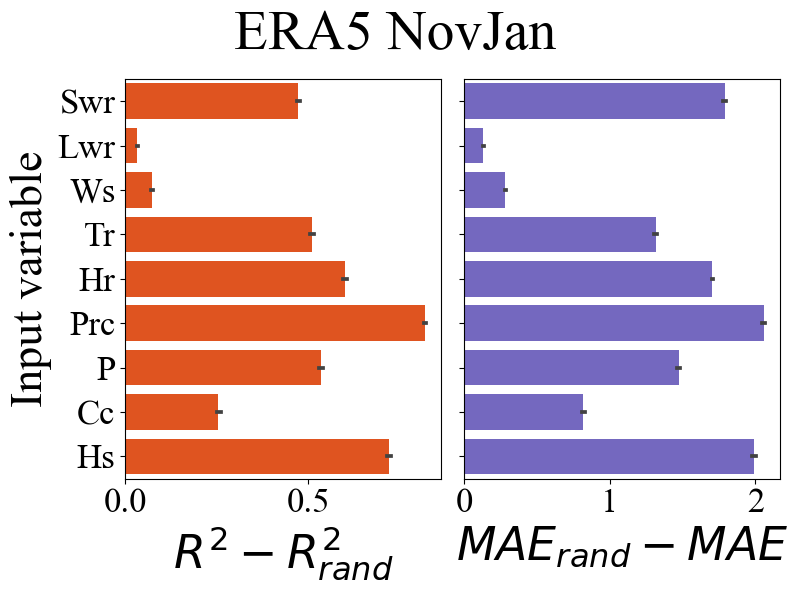

In [11]:
fig, ax = ML.make_plot_inputs_importance(
    n_simul = 3,figsize = (8,6), xfontsize = 33, yfontsize = 33,
    title_fontsize = 40,  ticks_fontsize = 25)


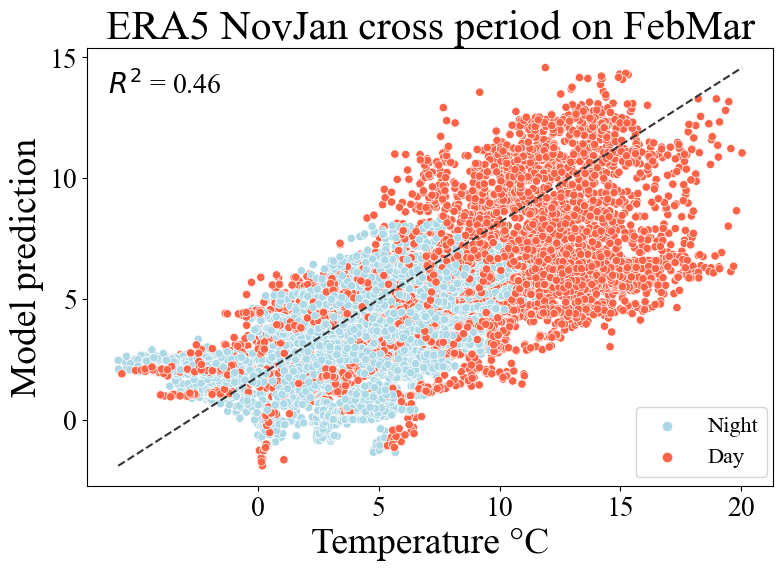

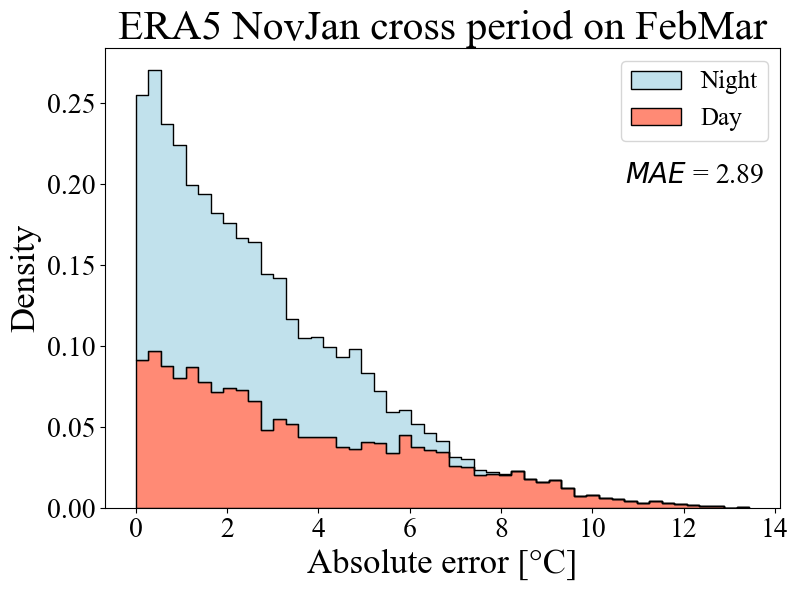

In [8]:
fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'FebMar')

In [9]:
lat = 45.7247139
long = 9.6975472

filename = DATA_PATH + 'data_torreboldone/dsm_TorreBoldone.p'    
infile = open(filename, 'rb')
dsm = pickle.load(infile)
dsm = smooth(dsm,smooth_side = 2)
resolution = 2

slope = terrain(dsm, 'slope')
aspect = terrain(dsm, 'aspect')

ha, svf = skyviewfactor(dsm, steps = 36, reso = 2)
study_area_coordinates = [804,619,422,588]
         
df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2022_11_12__2023_01_15.p')

periods = [
    [2023,1,10,10],
    [2023,1,10,11],
    [2023,1,10,13],
    [2023,1,10,14]
]

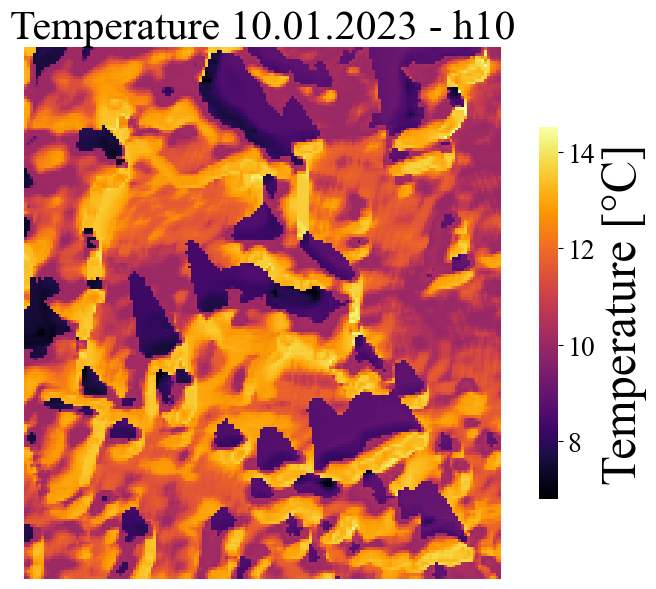

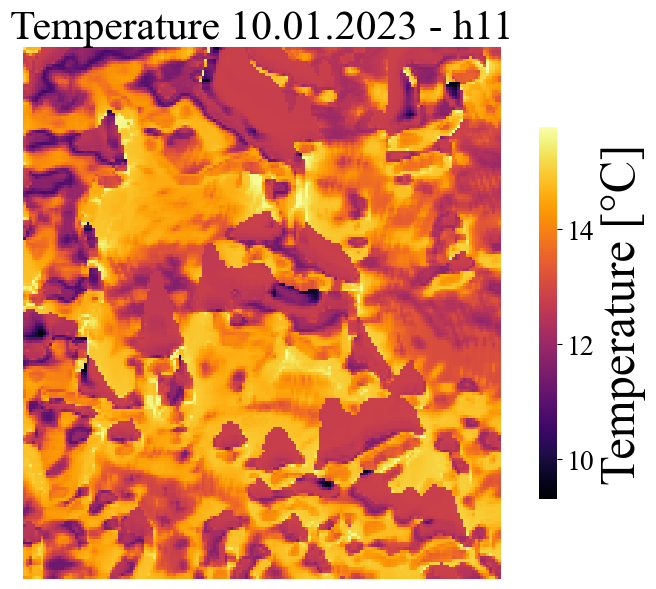

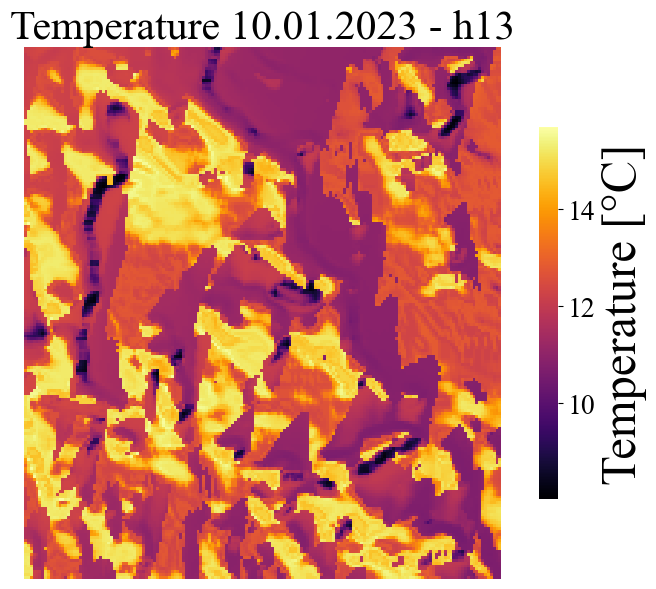

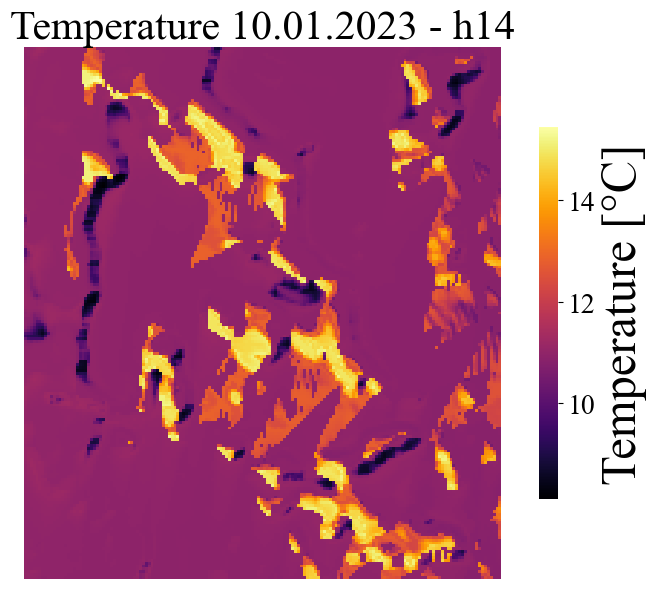

In [10]:
for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                         df_climate = df_climate, period = period, lat = lat, long = long,
                                                         dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                         ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                         figsize=(8,6), aspect_heatmap = 1, shrink = 0.7,
                                                         tick_params_labelsize = 20, ylabel_fontsize = 35,
                                                         title_fontsize = 30,)

    



# Load terrain data of the study area

In [3]:
sys.path.append(LIB_PATH + 'physical_model')
from terrain_utility import terrain, skyviewfactor
from utility import smooth

The terrain data for the study area is loaded, and the corresponding terrain properties are computed. For additional details, please refer to the 'notebook_physical_model' for more comprehensive information on this process.

In [4]:
lat = 45.7247139
long = 9.6975472

filename = DATA_PATH + 'data_torreboldone/dsm_TorreBoldone.p'    
infile = open(filename, 'rb')
dsm = pickle.load(infile)
dsm = smooth(dsm,smooth_side = 2)
resolution = 2

slope = terrain(dsm, 'slope')
aspect = terrain(dsm, 'aspect')

ha, svf = skyviewfactor(dsm, steps = 36, reso = 2)
study_area_coordinates = [804,619,422,588]
        

# NovJun

In this section a neural network for ERA5 database and ARPA database is trained to predict the temperature for the period from 12/11/2022 to 22/06/2023.

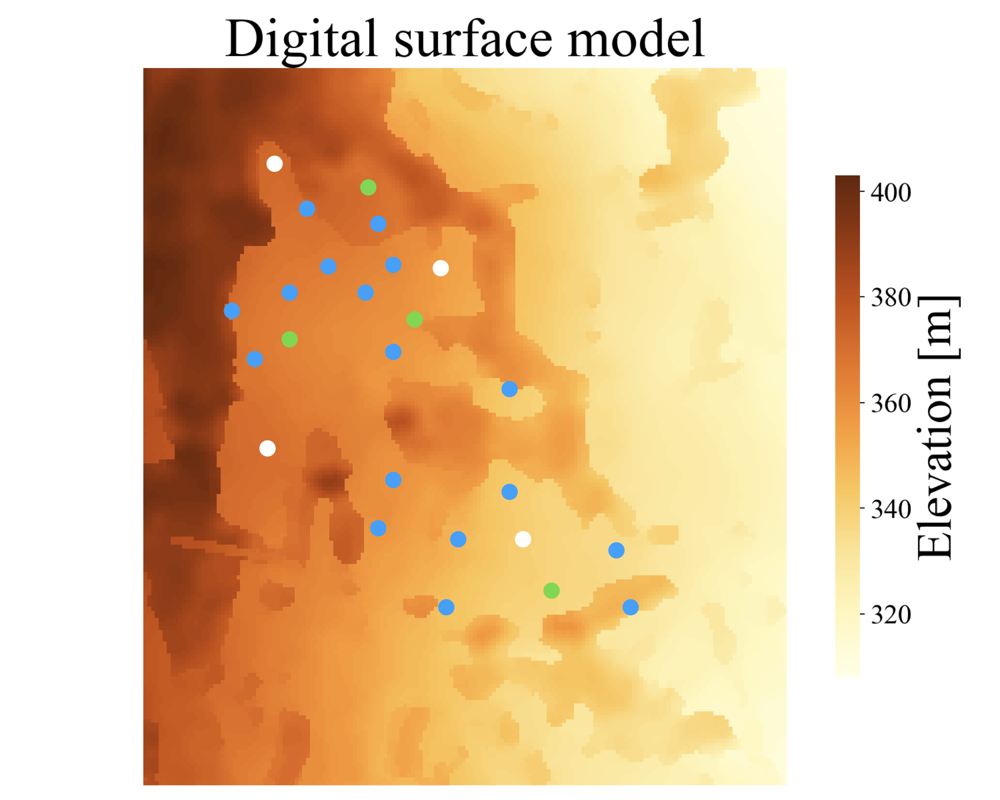

- In lightblue are represented the training sensors.
- In green are represented the validating sensors (3,12,13,22). 3 and 12 are not present in FebMar, 22 is not present in MarJun and 13 is always present.
- In white are represented the testing sensors (1, 15, 8, 23). These sensors are always present in the 3 periods.

## ERA5

Metal device set to: Apple M1
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense (Dense)               (None, 1024)              10240     
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dense_3 (Dense)             (None, 128)               32896     
                                                                 
 dense_4 (Dense)             (None, 1)                 129       
                                                                 
Total params: 699,393
Trainable

2023-07-01 09:03:25.962986: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-07-01 09:03:25.963109: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-07-01 09:03:26.108385: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-07-01 09:03:26.260904: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-01 09:03:36.387575: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_era5/model_weights_temperature_era5__2022_11_12__2023_06_22/FFNN_temperature_era5_NovJun_out_01-07-2023_09-03-14/model_weights/assets


2023-07-01 10:58:52.295243: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.858542768315666   0.6083877484107264
Benchmark vs prediction r2: 0.7881641079728006   0.9777550515887504


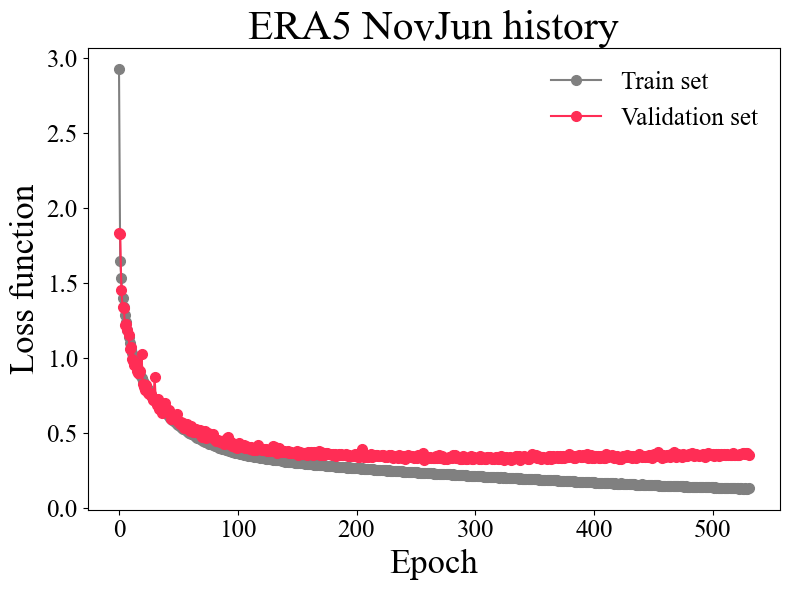

In [3]:
ML = MachineLearningFFNN(model_type_name = 'ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_06_22/df_microclimate_era5_NovJun_out_30-06-2023_12-42-55.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'T_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data_fixed_sensors(idxs_train = [2,4,5,6,7,9,10,11,14,16,17,18,19,20,21,24,25],
                                      idxs_validation = [3,12,13,22],
                                      idxs_test = [1,8,15,23],
                                     )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

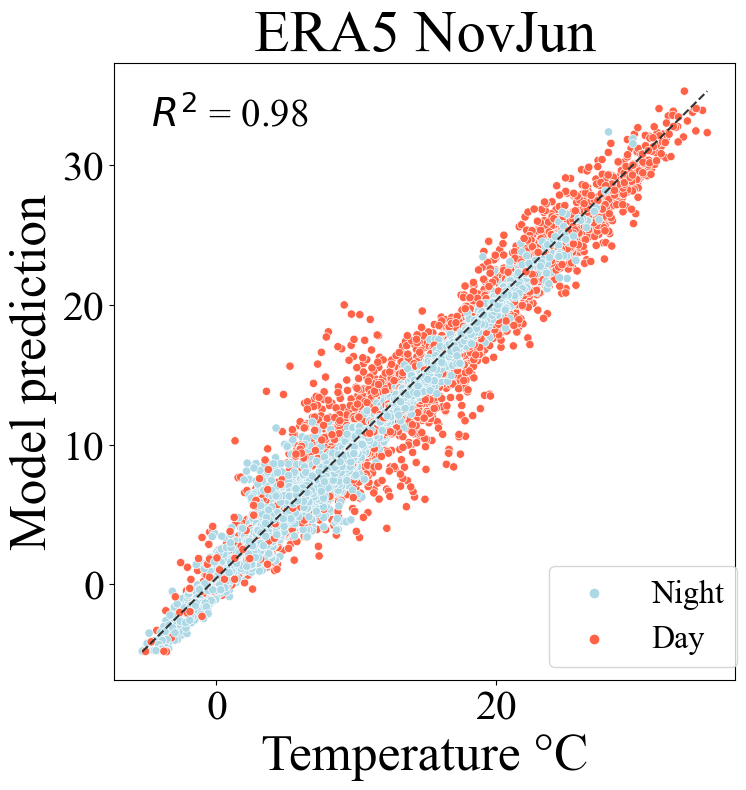

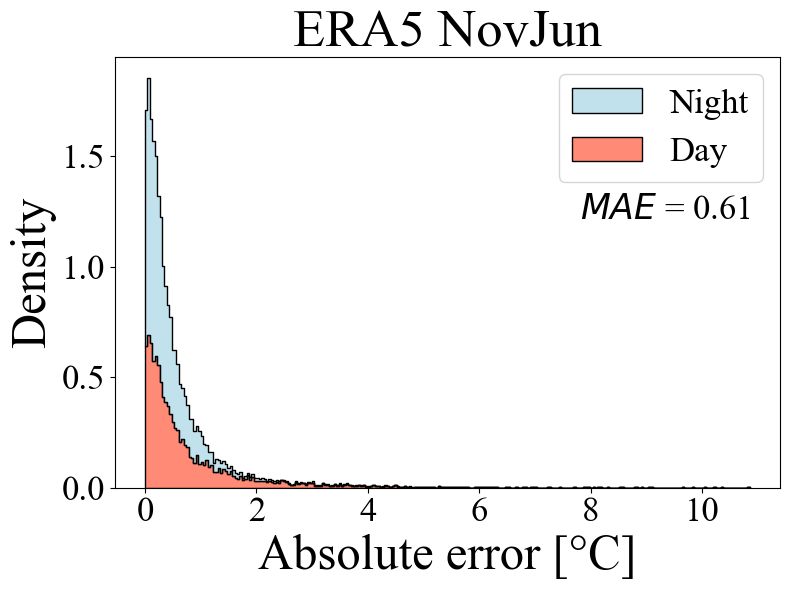

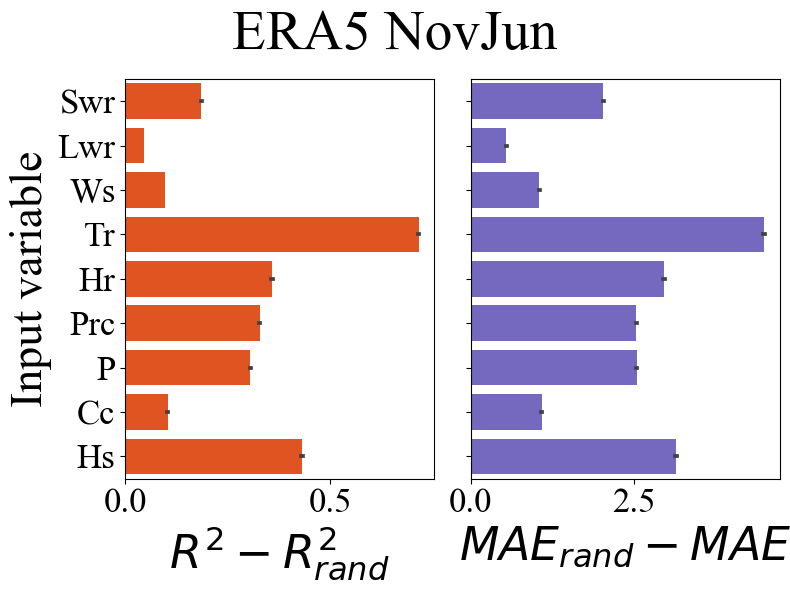

In [4]:
fig,ax = ML.make_plot_results_test_R2( save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJun_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJun_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJun_figure_input_importance.png', dpi=150)



2023-07-03 17:46:42.406465: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


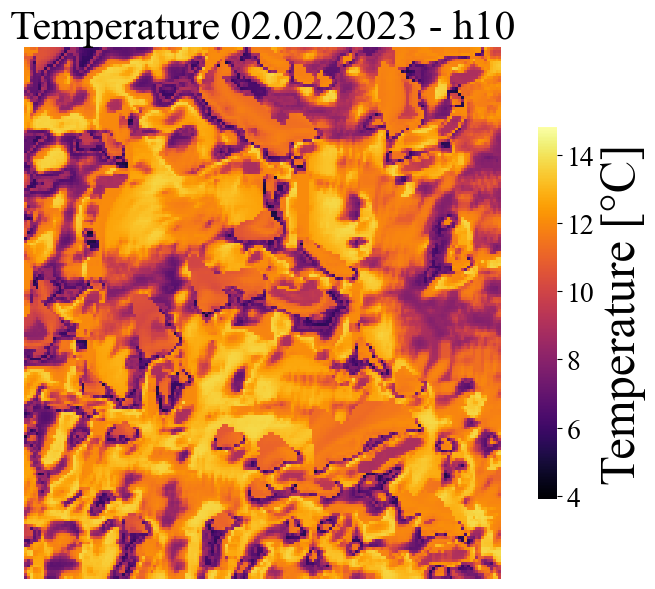

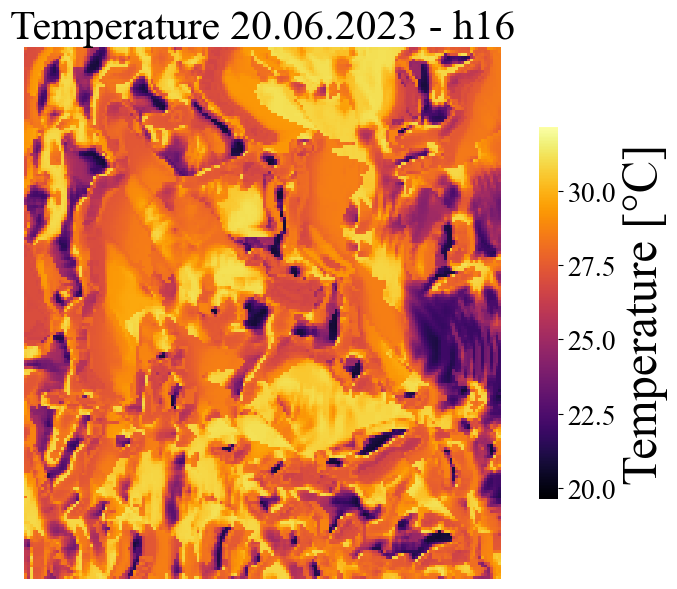

In [25]:
periods = [
 [2023,2,2,10],
 [2023,6,20,16]
]
for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                             df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2022_11_12__2023_06_22.p'),
                                                             period = period, lat = lat, long = long,
                                                             dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                             ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                             save_figure=True,)
    
    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/era5_temperature_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)


### Figures reworking

This subsection allows to load a trained model to perform figures style reworks.

In [3]:
ML = MachineLearningFFNN(model_type_name = 'ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_06_22/df_microclimate_era5_NovJun_out_30-06-2023_12-42-55.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'T_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.load_model_properties(RESULTS_PATH+'/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_era5/model_weights_temperature_era5__2022_11_12__2023_06_22/FFNN_temperature_era5_NovJun_out_01-07-2023_09-03-14')


Metal device set to: Apple M1


2023-07-07 09:50:03.854305: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-07-07 09:50:03.854725: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-07-07 09:50:04.015578: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open /Users/marcozanchi/Work/Grade/microclima/notebooks/results//output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_era5/model_weights_temperature_era5__2022_11_12__2023_06_22/FFNN_temperature_era5_NovJun_out_01-07-2023_09-03-14/model_weights: FAILED_PRECONDITION: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learnin

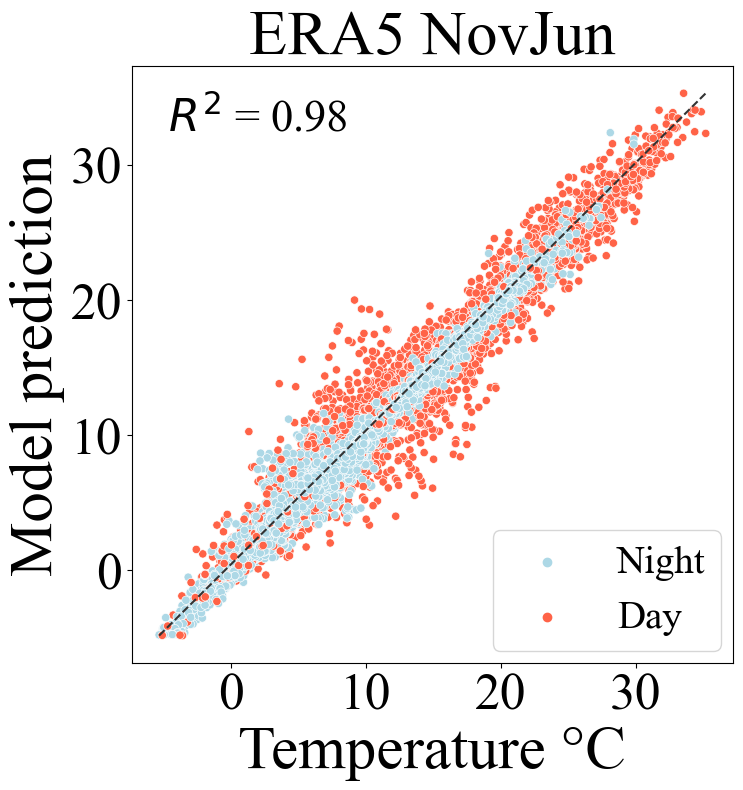

In [11]:
fig,ax = ML.make_plot_results_test_R2(
    xfontsize = 44, yfontsize = 44,
    title_fontsize = 45,
    ticks_fontsize = 37,
    r2_fontsize = 32, legend_fontsize = 28,
    legend_loc = (0.60,0.02), save_fig = True)


fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJun_figure_results_test_R2.png', dpi=150)


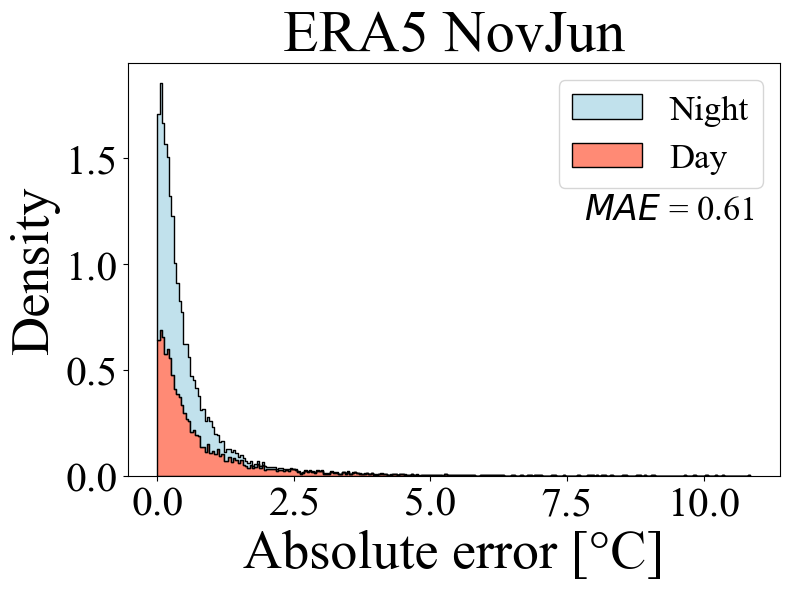

In [14]:
fig,ax = ML.make_plot_distribution_test_mae(
    xfontsize = 39, yfontsize = 39, 
    title_fontsize = 42,
    ticks_fontsize = 30,
    save_fig = True)

fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJun_figure_mae_distribution.png', dpi=150)

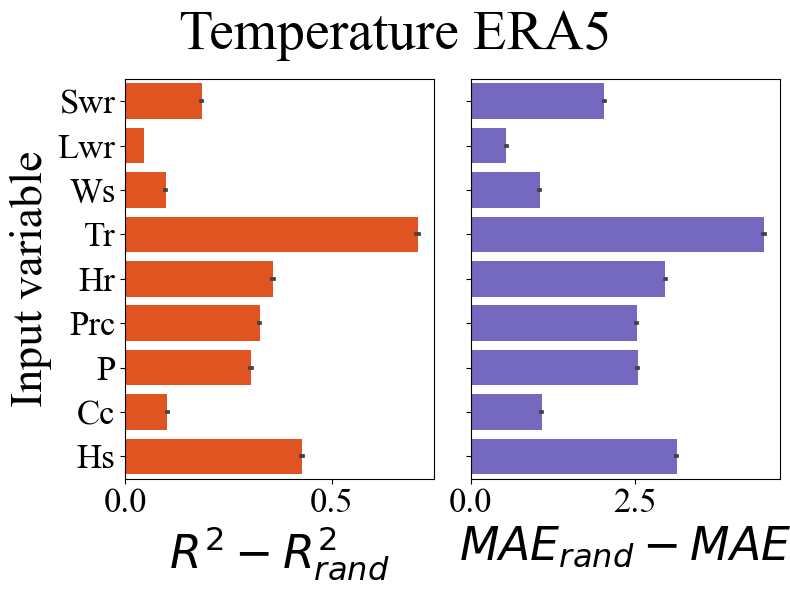

In [6]:
fig, ax = ML.make_plot_inputs_importance(n_simul = 10, title = 'Temperature ERA5',save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJun_figure_input_importance.png', dpi=150)



## Mixed ARPA ERA5

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense_5 (Dense)             (None, 1024)              10240     
                                                                 
 dense_6 (Dense)             (None, 512)               524800    
                                                                 
 dense_7 (Dense)             (None, 256)               131328    
                                                                 
 dense_8 (Dense)             (None, 128)               32896     
                                                                 
 dense_9 (Dense)             (None, 1)                 129       
                                                                 
Total params: 699,393
Trainable params: 699,393
Non-trainab

2023-07-01 11:00:39.979965: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-01 11:00:52.429905: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_mixed_arpa_era5/model_weights_temperature_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_temperature_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-14/model_weights/assets


2023-07-01 12:21:29.282232: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.1790171258671396   0.5679484979010363
Benchmark vs prediction r2: 0.9441694603899499   0.9841209305563955


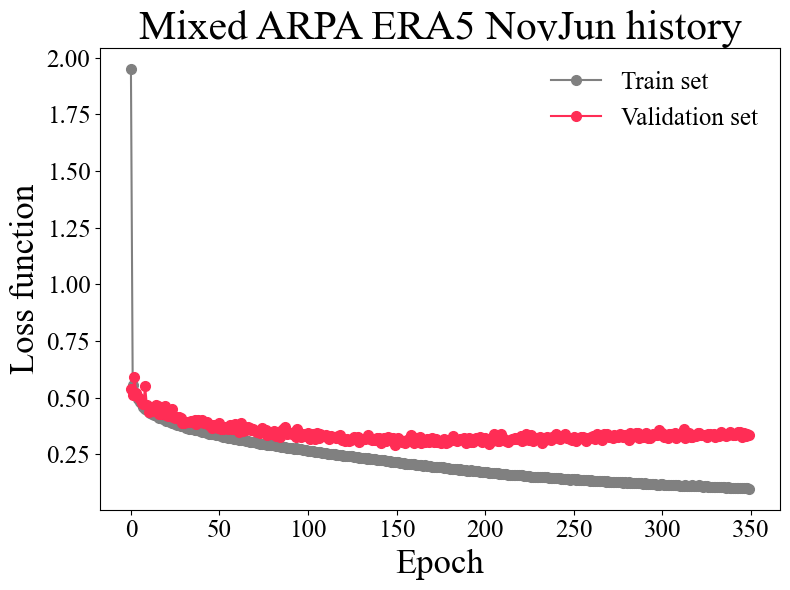

In [5]:
ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_06_22/df_microclimate_mixed_arpa_era5_NovJun_out_30-06-2023_12-42-55',              
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'T_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data_fixed_sensors(idxs_train = [2,4,5,6,7,9,10,11,14,16,17,18,19,20,21,24,25],
                                      idxs_validation = [3,12,13,22],
                                      idxs_test = [1,8,15,23],
                                     )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

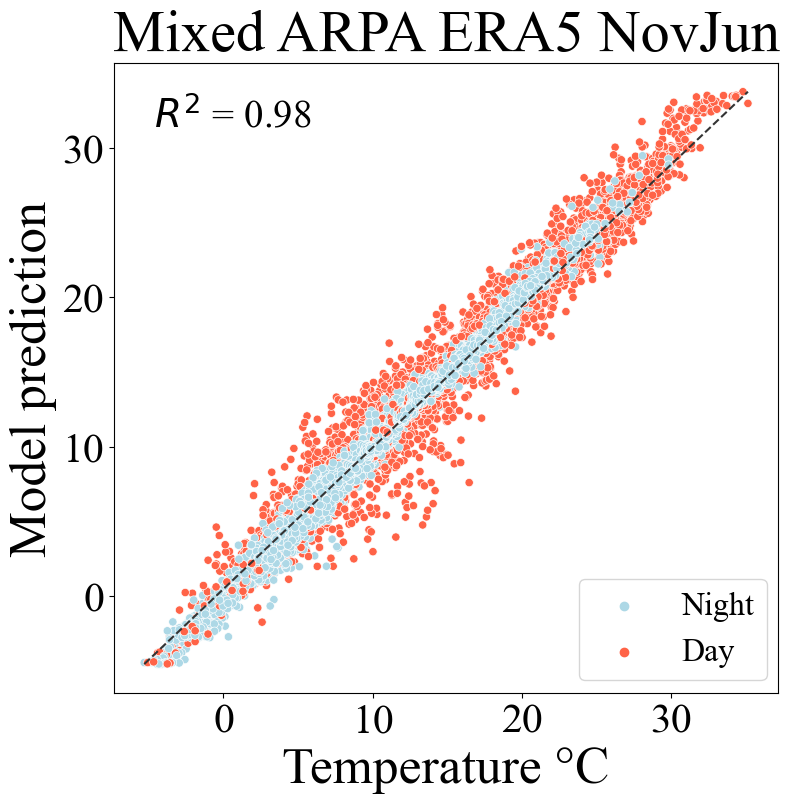

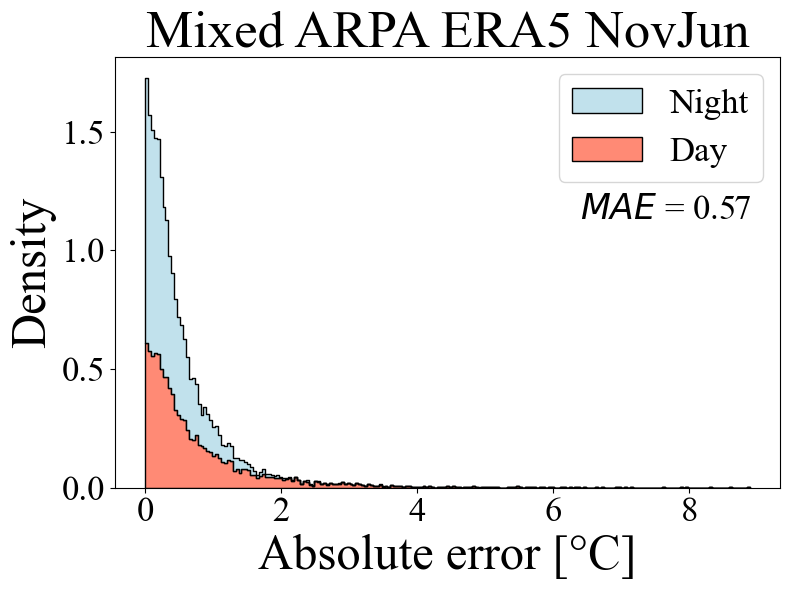

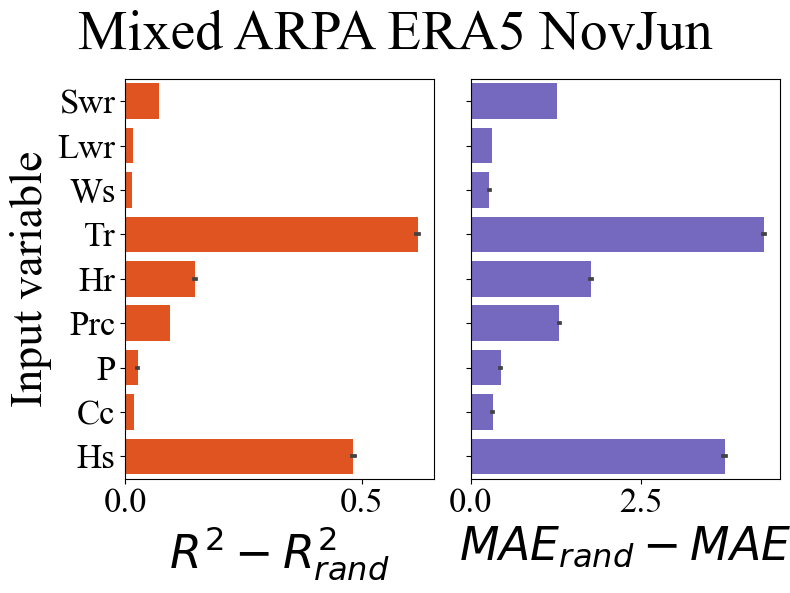

In [6]:
fig,ax = ML.make_plot_results_test_R2( save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJun_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJun_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJun_figure_input_importance.png', dpi=150)

for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                             df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2022_11_12__2023_06_22.p'),
                                                             period = period, lat = lat, long = long,
                                                             dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                             ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                             save_figure=True,)
    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/mixed_arpa_era5_temperature_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)


2023-07-03 17:48:27.906736: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


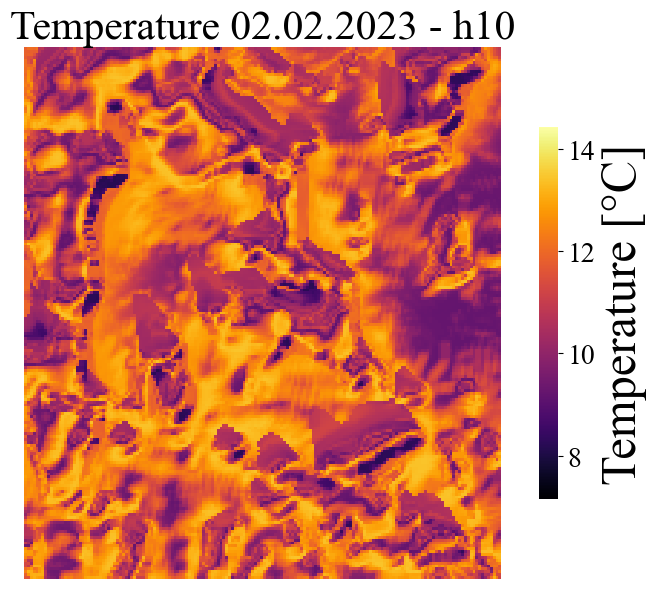

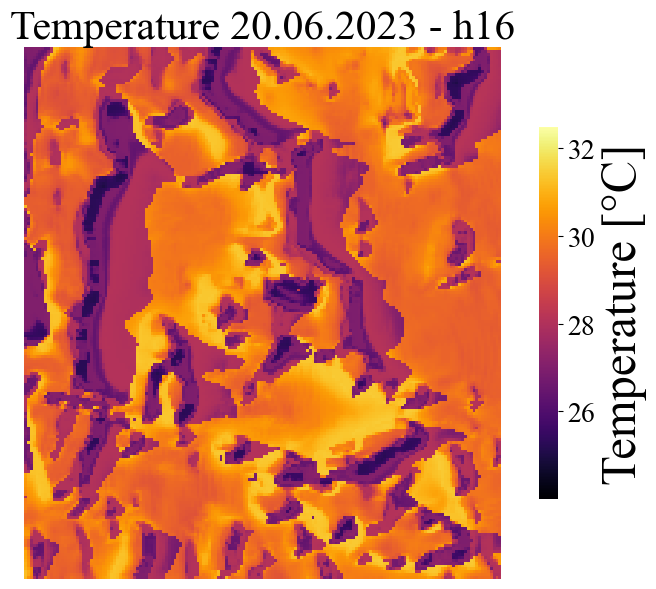

In [27]:
periods = [
 [2023,2,2,10],
 [2023,6,20,16]
]
for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                             df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2022_11_12__2023_06_22.p'),
                                                             period = period, lat = lat, long = long,
                                                             dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                             ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                             save_figure=True,)
    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/mixed_arpa_era5_temperature_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)


### Figures reworking

This subsection allows to load a trained model to perform figures style reworks.

In [15]:
ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_06_22/df_microclimate_mixed_arpa_era5_NovJun_out_30-06-2023_12-42-55',              
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'T_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.load_model_properties(RESULTS_PATH+'/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_mixed_arpa_era5/model_weights_temperature_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_temperature_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-14')


2023-07-07 10:01:34.774776: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open /Users/marcozanchi/Work/Grade/microclima/notebooks/results//output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_mixed_arpa_era5/model_weights_temperature_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_temperature_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-14/model_weights: FAILED_PRECONDITION: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_mixed_arpa_era5/model_weights_temperature_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_temperature_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-14/model_weights; Is a directory: perhaps your file is in a different file format and you need to use a different restore operator?
2023-07-07 10:01:34.830537: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is ena

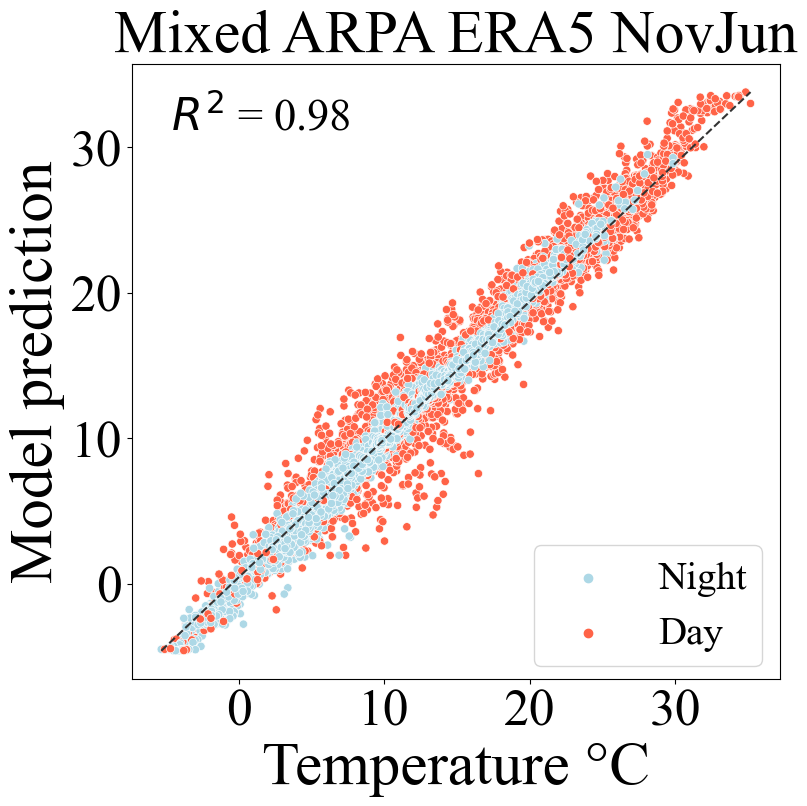

In [19]:
fig,ax = ML.make_plot_results_test_R2(
    xfontsize = 44, yfontsize = 44,
    title_fontsize = 43,
    ticks_fontsize = 37,
    r2_fontsize = 32, legend_fontsize = 28,
    legend_loc = (0.62,0.02),
    save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJun_figure_results_test_R2.png', dpi=150)


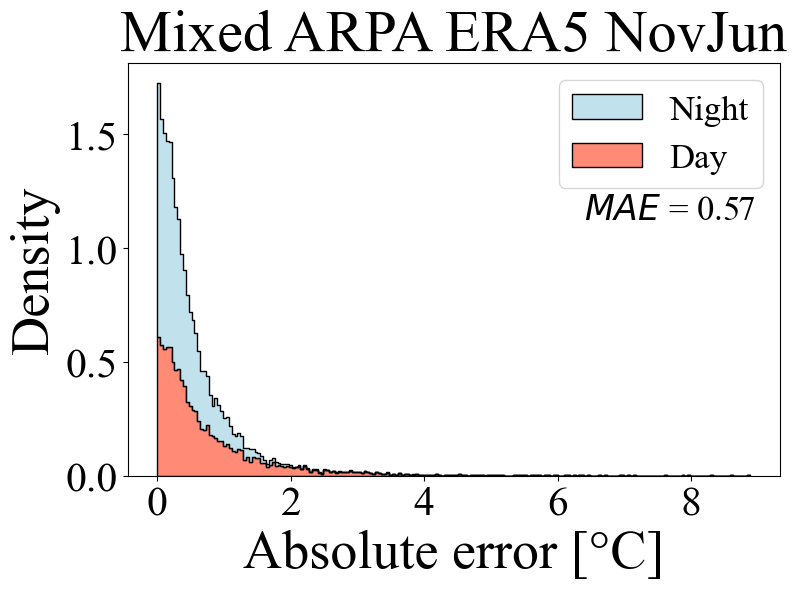

In [20]:
fig,ax = ML.make_plot_distribution_test_mae(
    xfontsize = 39, yfontsize = 39, 
    title_fontsize = 42,
    ticks_fontsize = 30,
    save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJun_figure_mae_distribution.png', dpi=150)


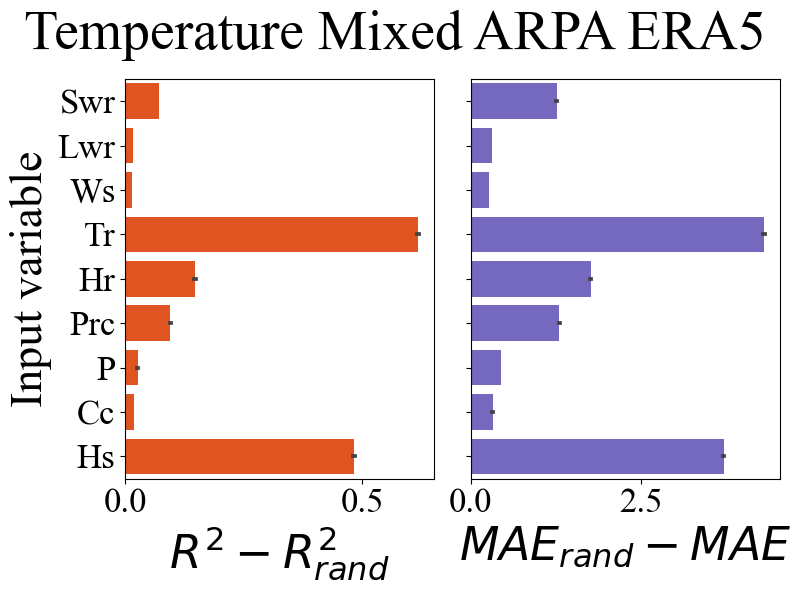

In [8]:
fig, ax = ML.make_plot_inputs_importance(n_simul = 10, title = 'Temperature Mixed ARPA ERA5',save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJun_figure_input_importance.png', dpi=150)


# NovJan

In this section a neural network for ERA5 database and ARPA database is trained to predict the temperature for the period from 12/11/2022 to 15/01/2023.

In [5]:

periods = [
    [2023,1,10,9],
    [2023,1,10,10],
    [2023,1,10,11],
    [2023,1,10,12],
    [2023,1,10,13],
    [2023,1,10,14],
    [2023,1,10,15],
    [2023,1,10,16],
]

## ERA5

Metal device set to: Apple M1
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense (Dense)               (None, 1024)              10240     
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dense_3 (Dense)             (None, 128)               32896     
                                                                 
 dense_4 (Dense)             (None, 1)                 129       
                                                                 
Total params: 699,393
Trainable

2023-06-21 19:59:58.750589: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-21 19:59:58.750688: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-06-21 19:59:58.931738: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-06-21 19:59:59.110772: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 20:00:03.425491: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_era5/model_weights_temperature_era5__2022_11_12__2023_01_15/FFNN_temperature_era5_NovJan_out_21-06-2023_19-57-16/model_weights/assets


2023-06-21 20:25:57.796336: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 4.2272004732972395   0.3946211331252411
Benchmark vs prediction r2: 0.4711560296396471   0.9456613785335106


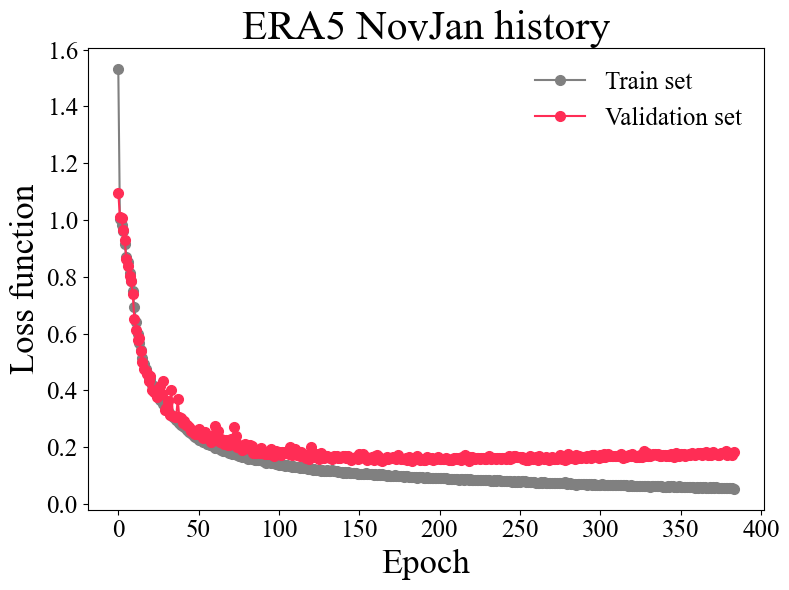

In [6]:
ML = MachineLearningFFNN(model_type_name = 'ERA5',
                         model_period_name = 'NovJan',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'T_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data(seed = 18,
                        test_train_proportion = 0.4,
                        val_test_proportion = 0.4,
                       )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

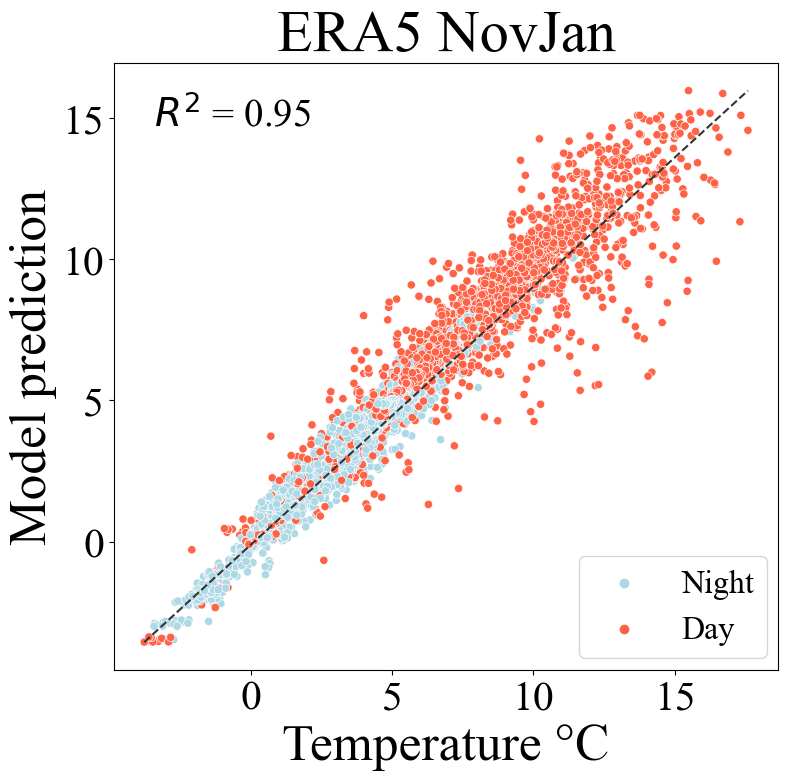

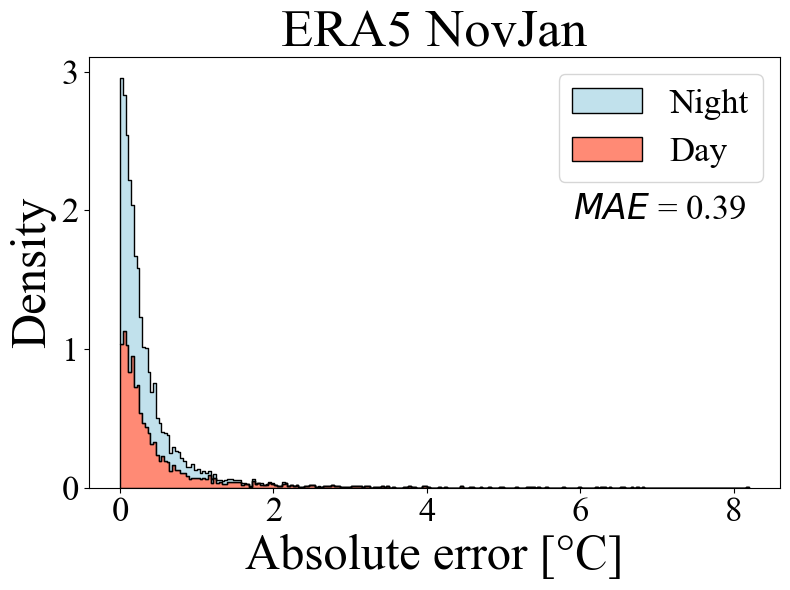

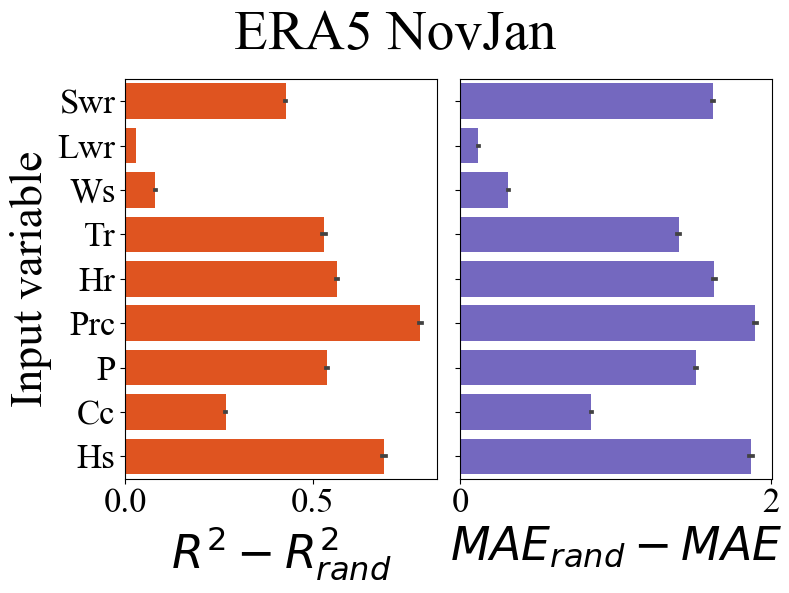

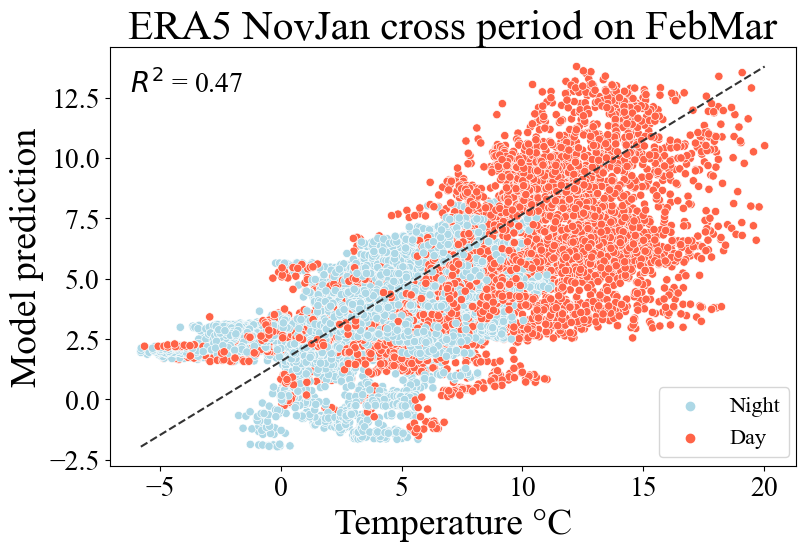

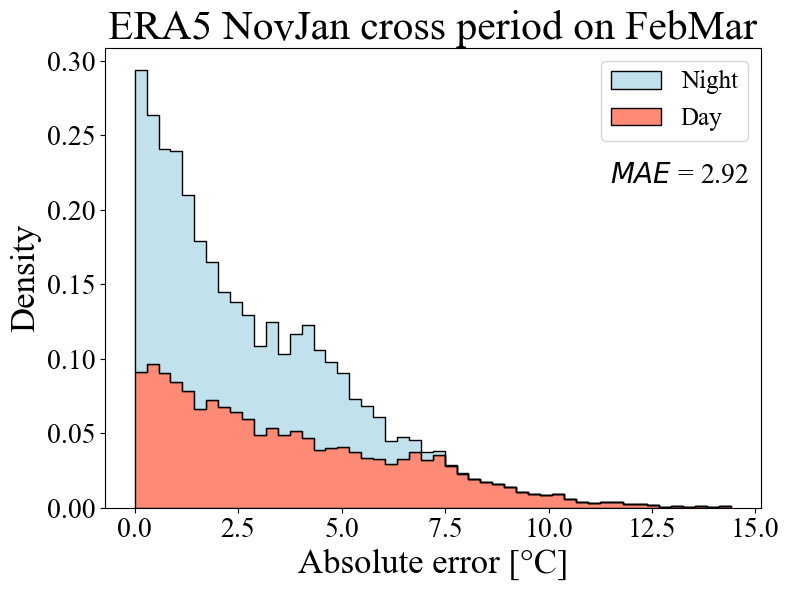

...

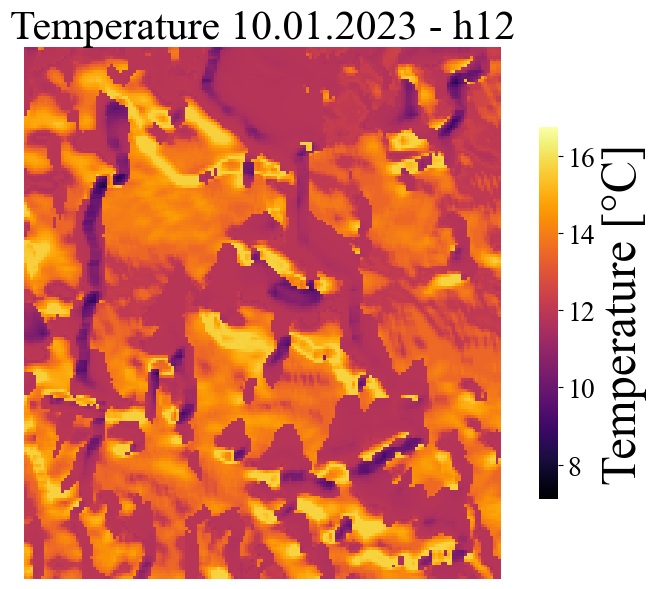

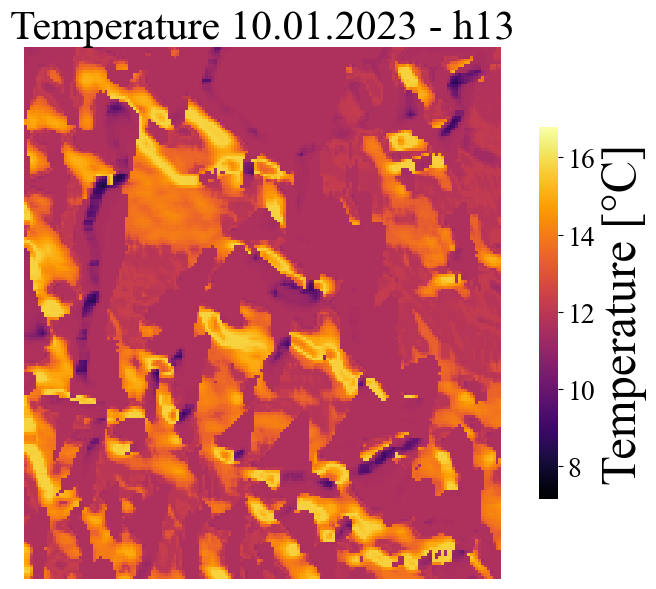

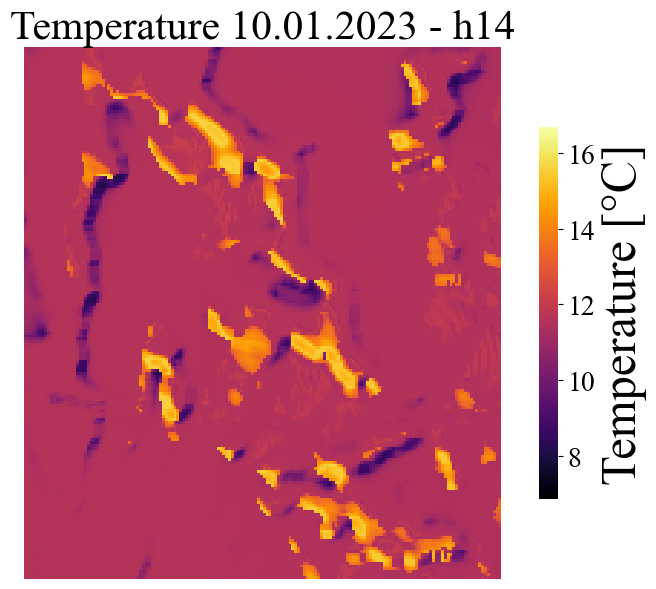

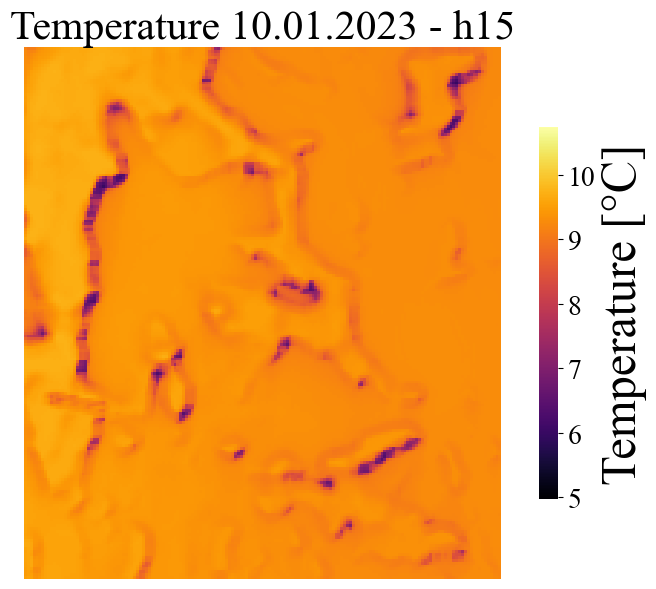

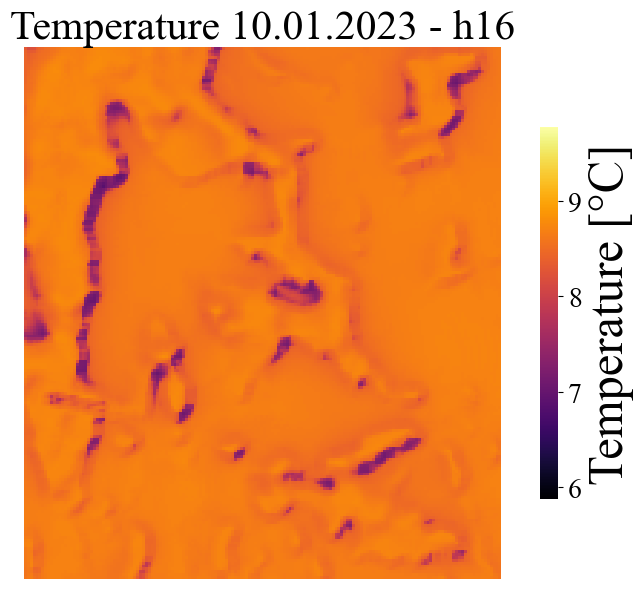

In [7]:
fig,ax = ML.make_plot_results_test_R2( save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJan_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJan_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJan_figure_input_importance.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'FebMar',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJan_figure_cross_period_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJan_figure_cross_period_distribution_mae.png', dpi=150)


for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                         df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2022_11_12__2023_01_15.p'),
                                                         period = period, lat = lat, long = long,
                                                         dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                         ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                         save_figure=True,)

    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/era5_temperature_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)





## ARPA + ERA5

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense_5 (Dense)             (None, 1024)              10240     
                                                                 
 dense_6 (Dense)             (None, 512)               524800    
                                                                 
 dense_7 (Dense)             (None, 256)               131328    
                                                                 
 dense_8 (Dense)             (None, 128)               32896     
                                                                 
 dense_9 (Dense)             (None, 1)                 129       
                                                                 
Total params: 699,393
Trainable params: 699,393
Non-trainab

2023-06-21 20:28:17.721809: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 20:28:21.772380: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_mixed_arpa_era5/model_weights_temperature_mixed_arpa_era5__2022_11_12__2023_01_15/FFNN_temperature_mixed_arpa_era5_NovJan_out_21-06-2023_19-57-16/model_weights/assets


2023-06-21 20:53:17.281417: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 0.8893940393655987   0.43926270700060926
Benchmark vs prediction r2: 0.7997229651503607   0.939956128630558


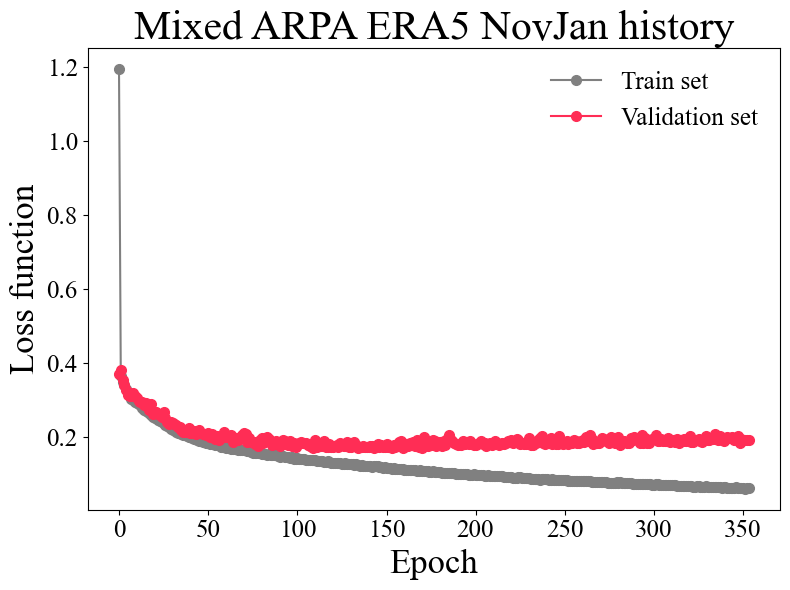

In [8]:
ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                         model_period_name = 'NovJan',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_13-06-2023_16-59-32.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'T_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data(seed = 18,
                        test_train_proportion = 0.4,
                        val_test_proportion = 0.4,
                       )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

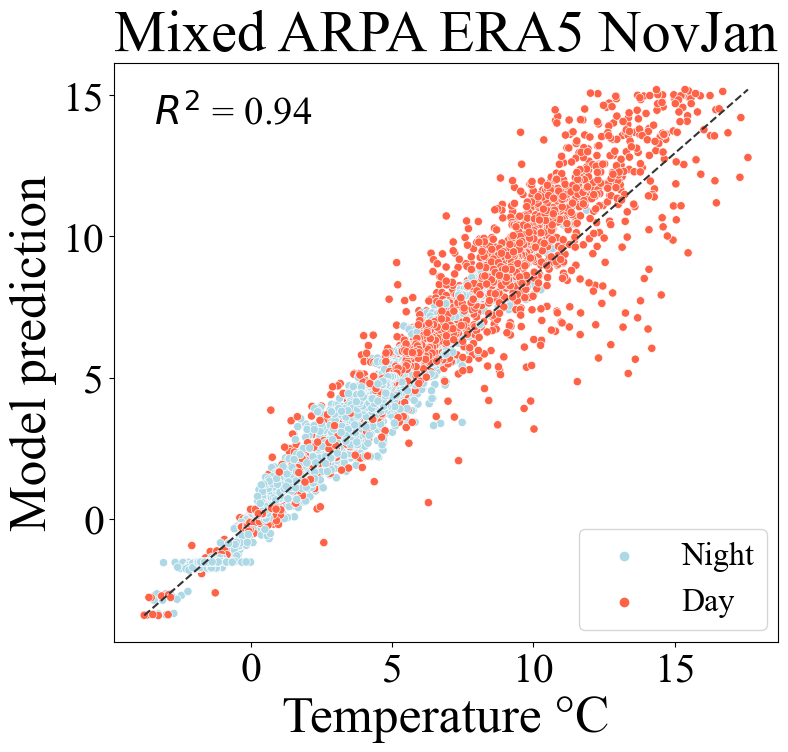

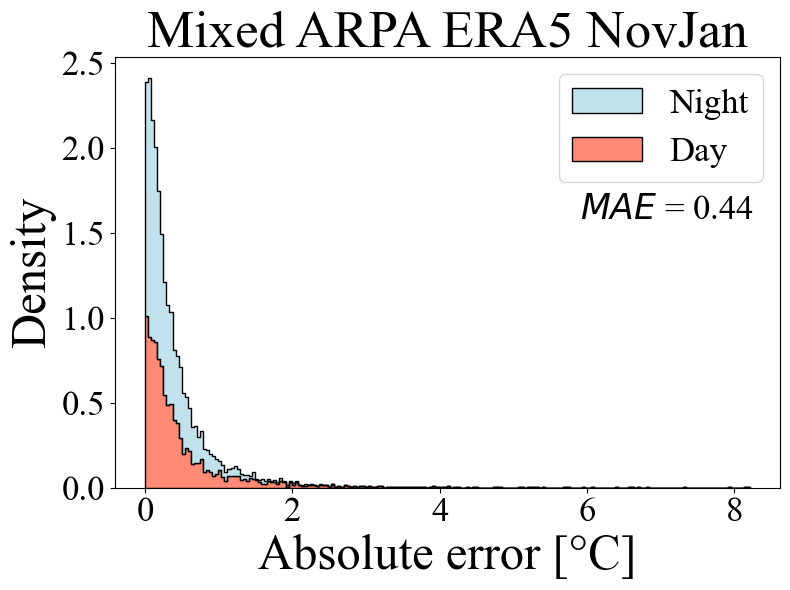

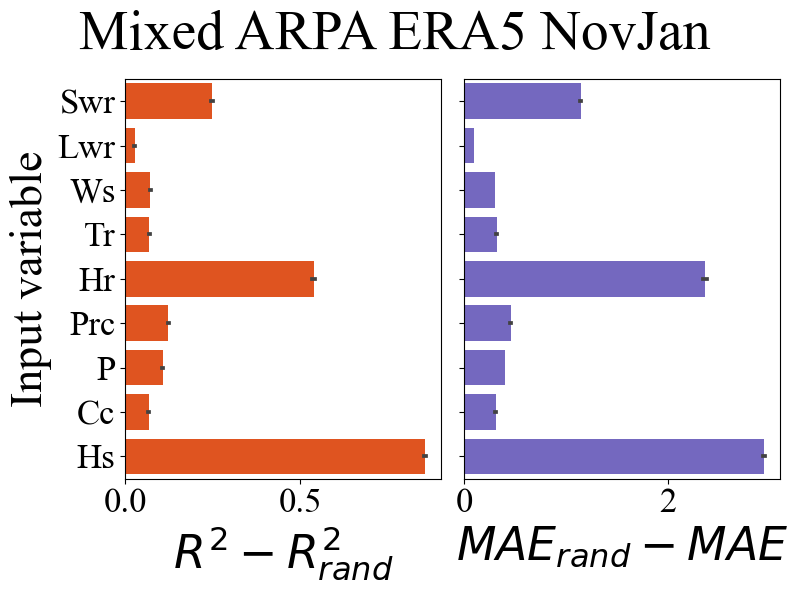

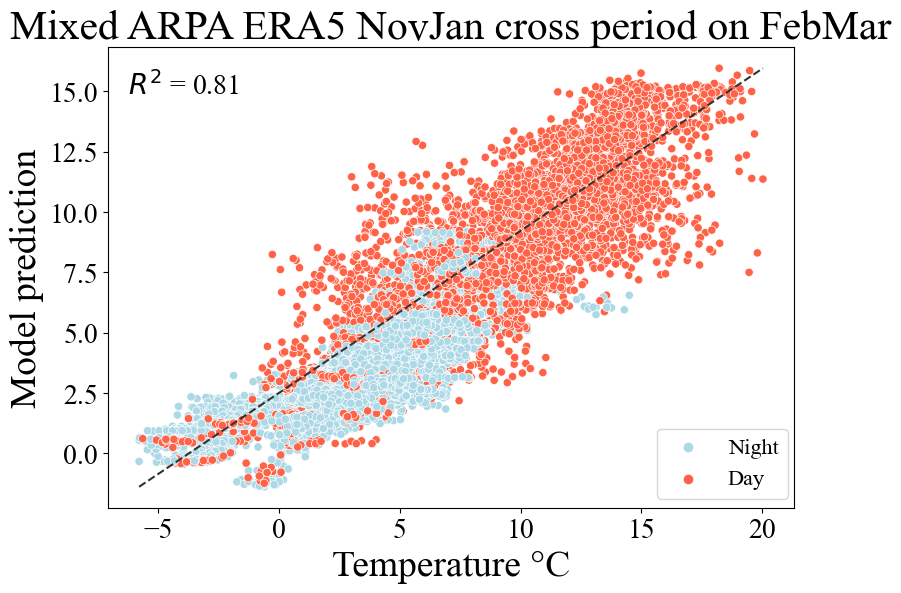

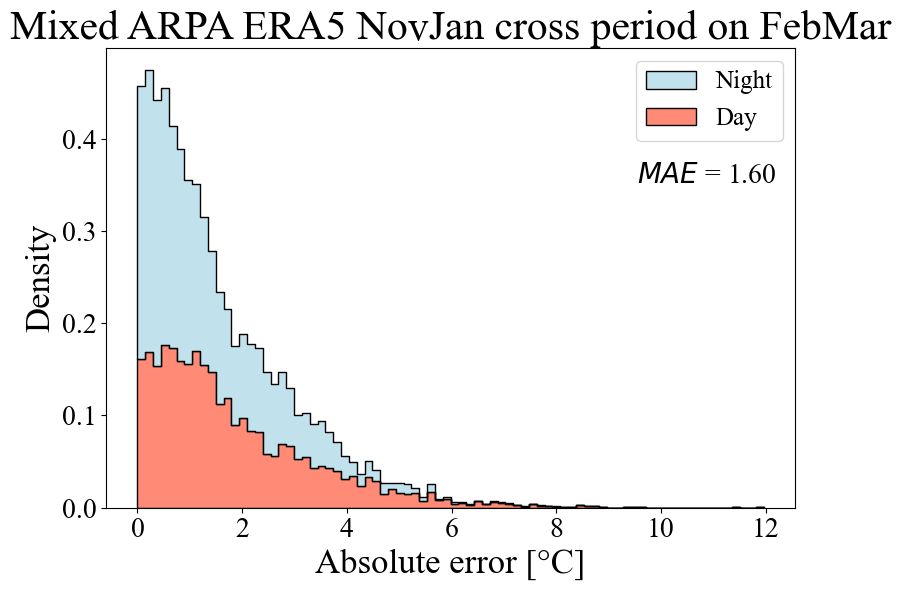

...

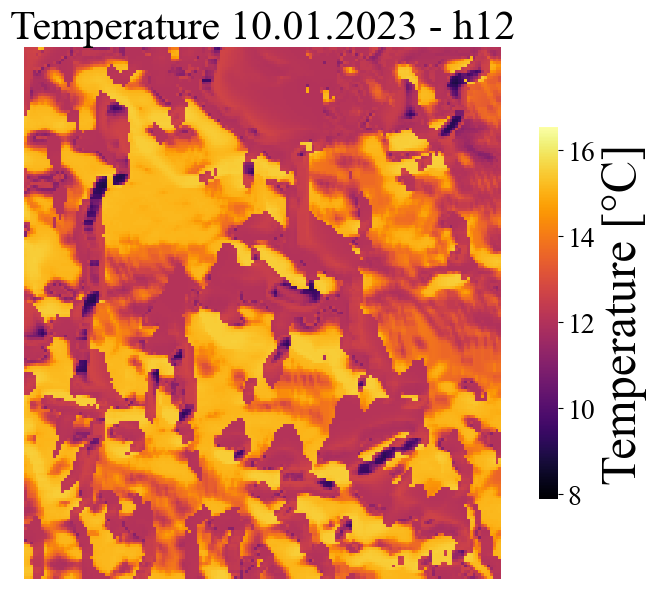

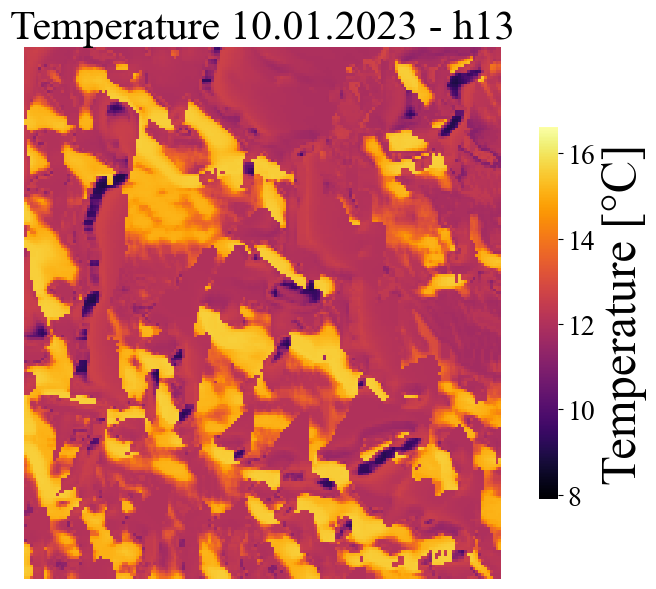

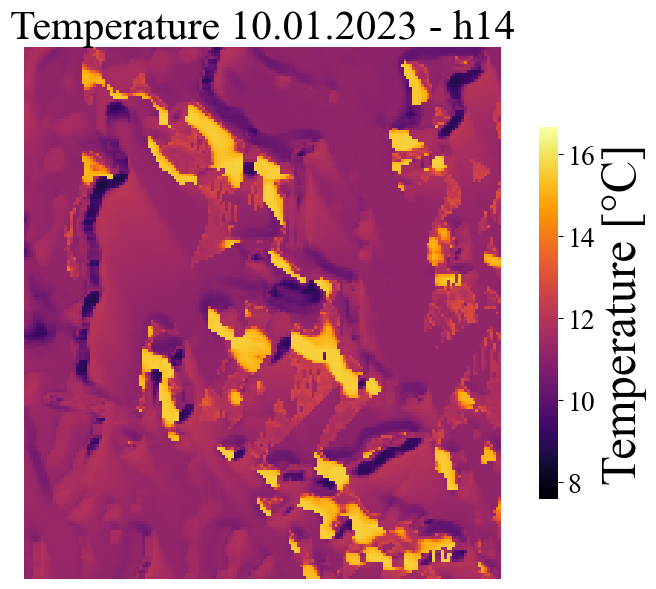

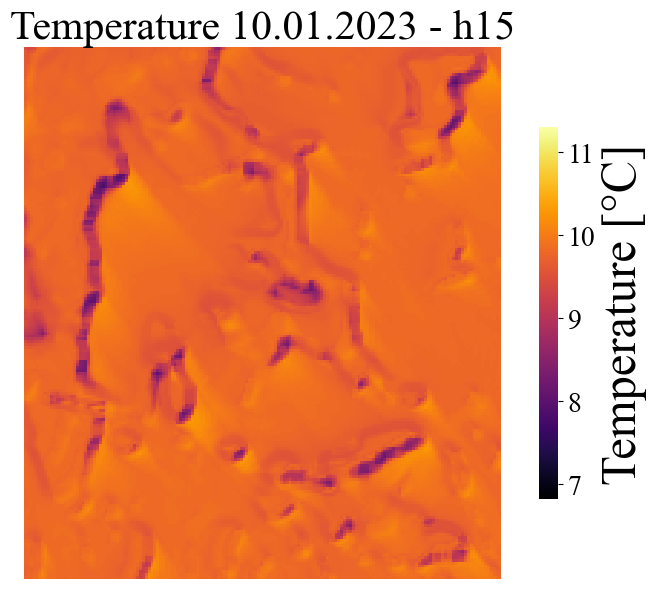

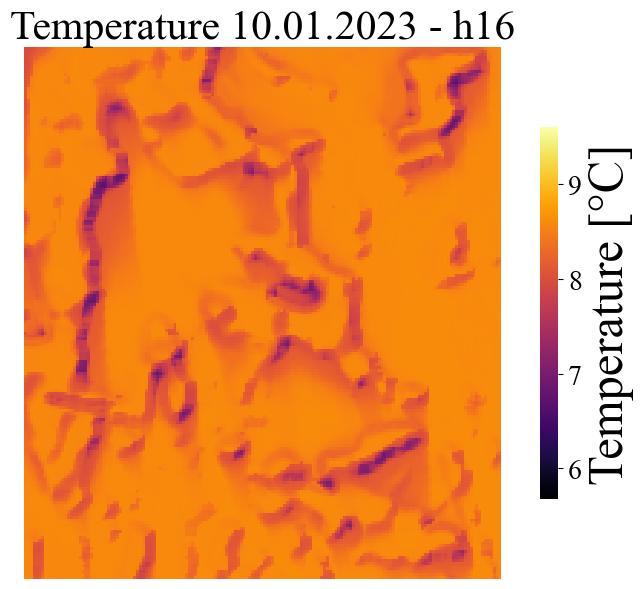

In [9]:
fig,ax = ML.make_plot_results_test_R2( save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJan_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJan_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJan_figure_input_importance.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'FebMar',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJan_figure_cross_period_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJan_figure_cross_period_distribution_mae.png', dpi=150)


for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                         df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2022_11_12__2023_01_15.p'),
                                                         period = period, lat = lat, long = long,
                                                         dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                         ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                         save_figure=True,)

    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/mixed_arpa_era5_temperature_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)



# FebMar

In [10]:
periods = [
    [2023,2,2,9],
    [2023,2,2,10],
    [2023,2,2,11],
    [2023,2,2,12],
    [2023,2,2,13],
    [2023,2,2,14],
    [2023,2,2,15],
    [2023,2,2,16],
]

## ERA5

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense_10 (Dense)            (None, 1024)              10240     
                                                                 
 dense_11 (Dense)            (None, 512)               524800    
                                                                 
 dense_12 (Dense)            (None, 256)               131328    
                                                                 
 dense_13 (Dense)            (None, 128)               32896     
                                                                 
 dense_14 (Dense)            (None, 1)                 129       
                                                                 
Total params: 699,393
Trainable params: 699,393
Non-trainab

2023-06-21 20:55:00.632208: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 20:55:02.163937: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_era5/model_weights_temperature_era5__2023_02_01__2023_03_06/FFNN_temperature_era5_FebMar_out_21-06-2023_19-57-16/model_weights/assets


2023-06-21 21:05:23.390771: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.829650076388876   0.6998471040142871
Benchmark vs prediction r2: 0.7813656030019002   0.960812346256644


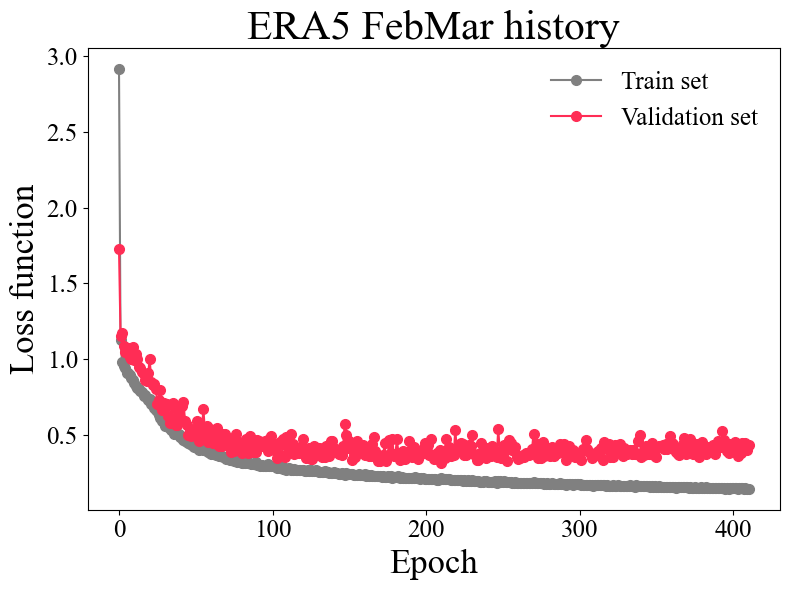

In [11]:
ML = MachineLearningFFNN(model_type_name = 'ERA5',
                         model_period_name = 'FebMar',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'T_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data(seed = 18,
                        test_train_proportion = 0.4,
                        val_test_proportion = 0.4,
                       )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

2023-06-21 21:05:49.980397: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


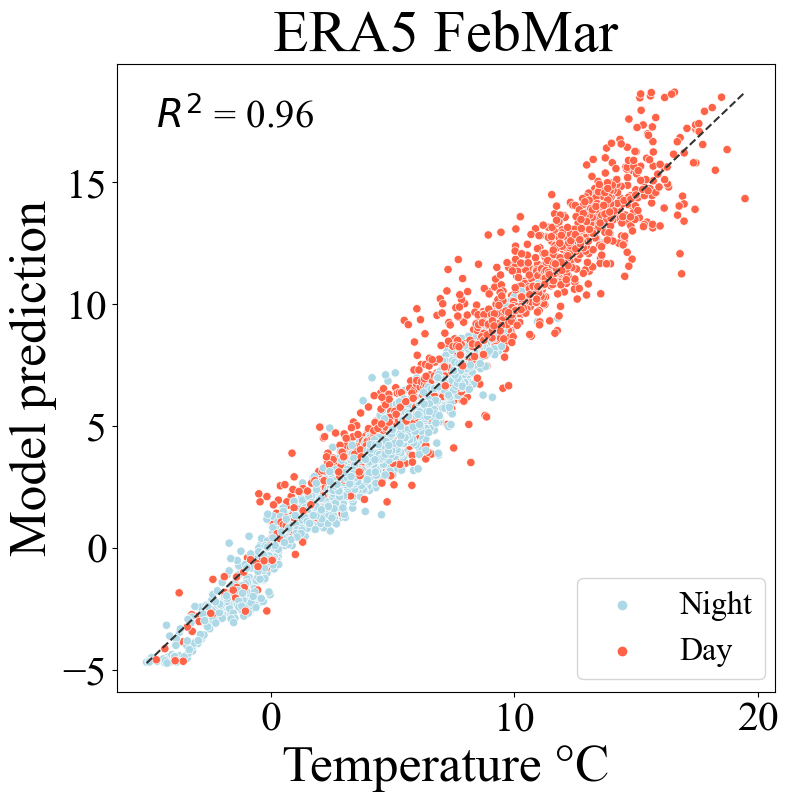

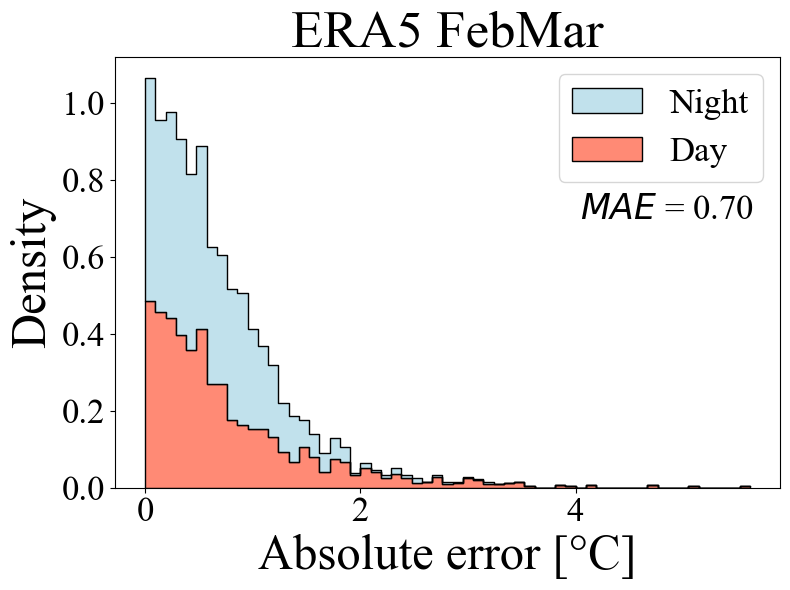

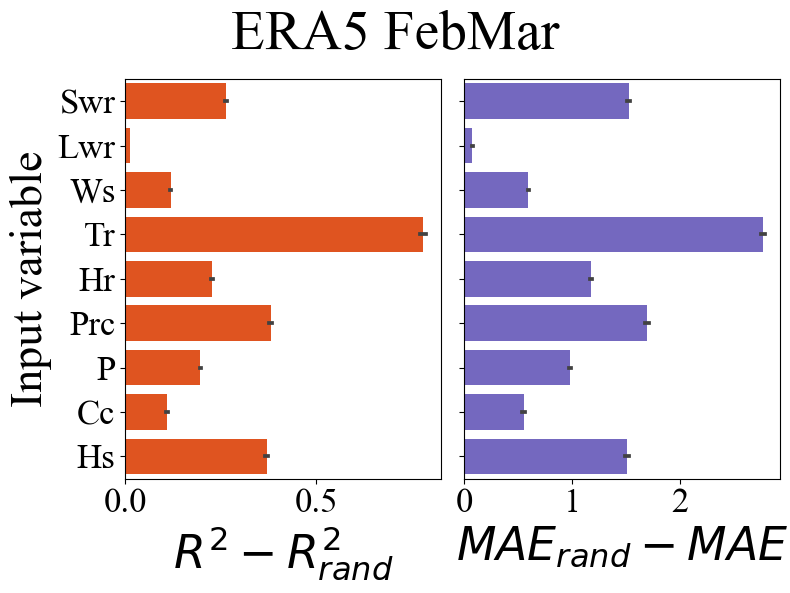

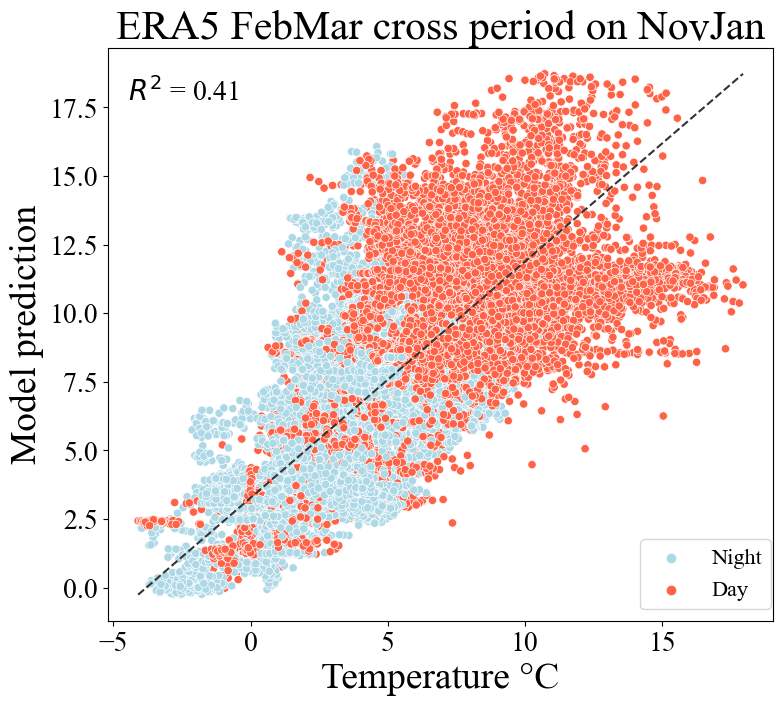

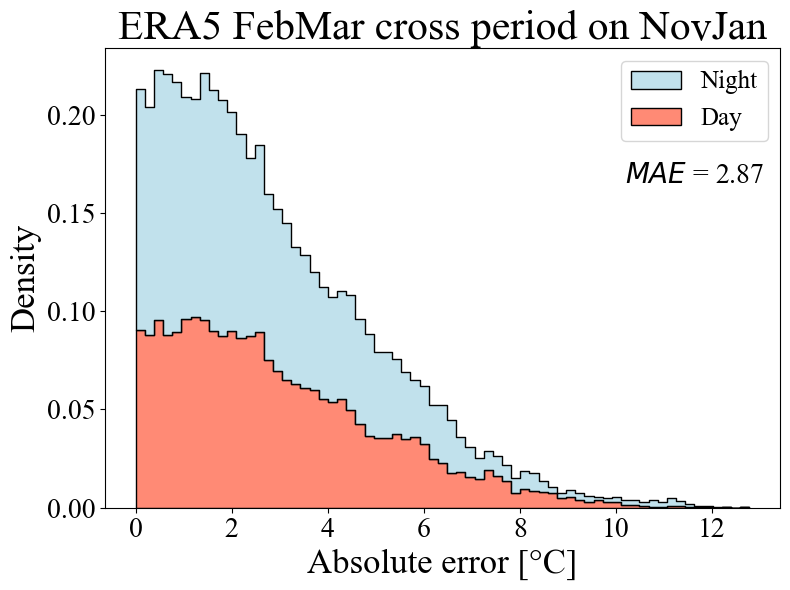

...

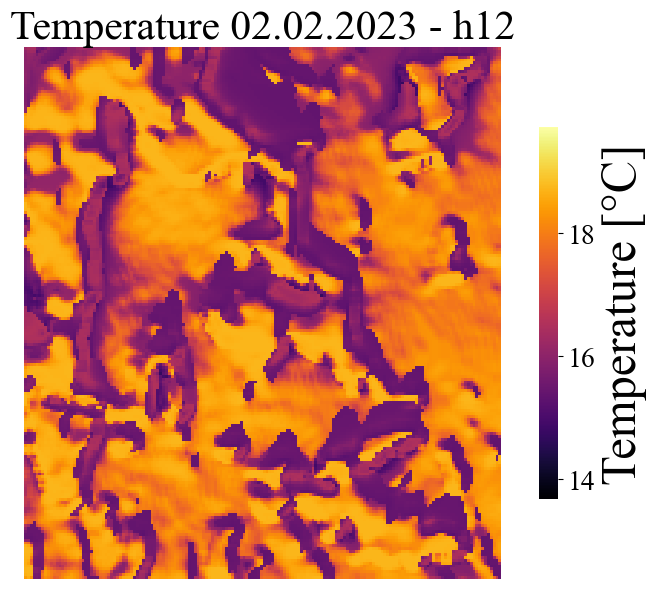

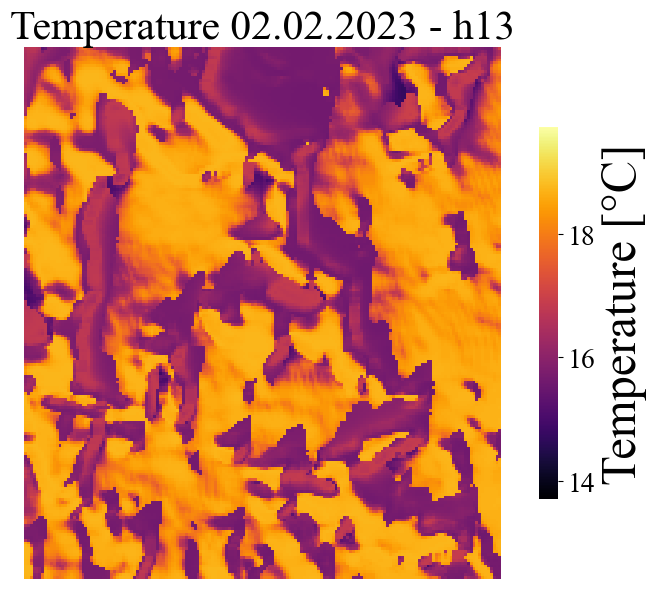

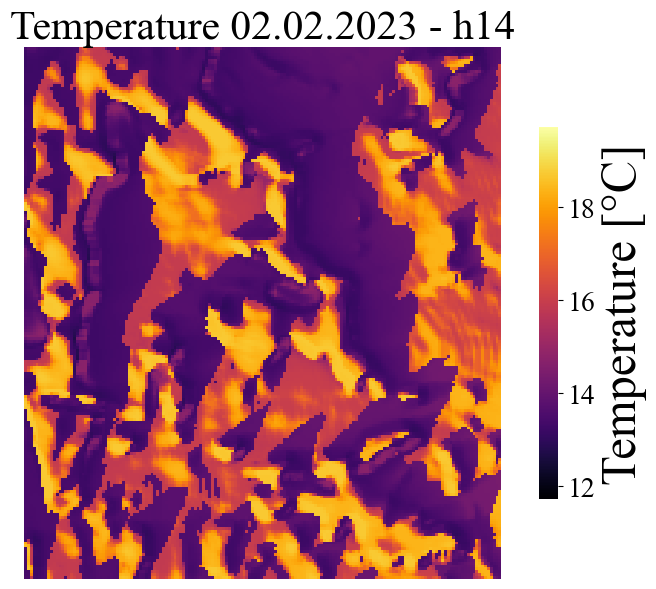

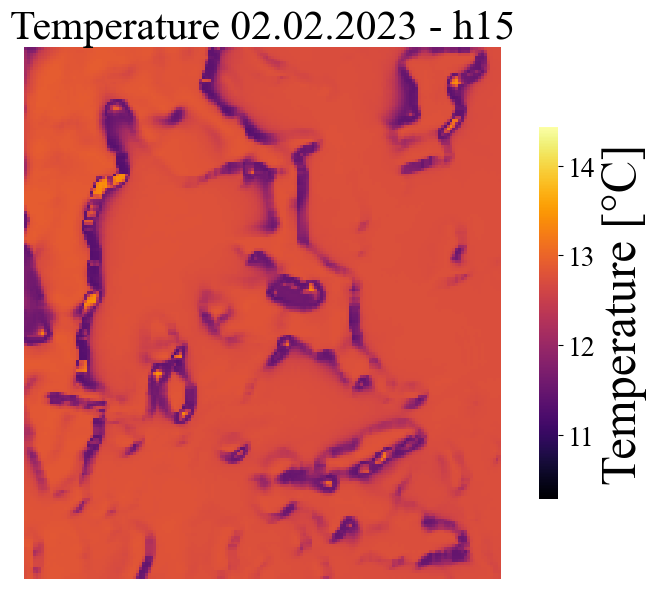

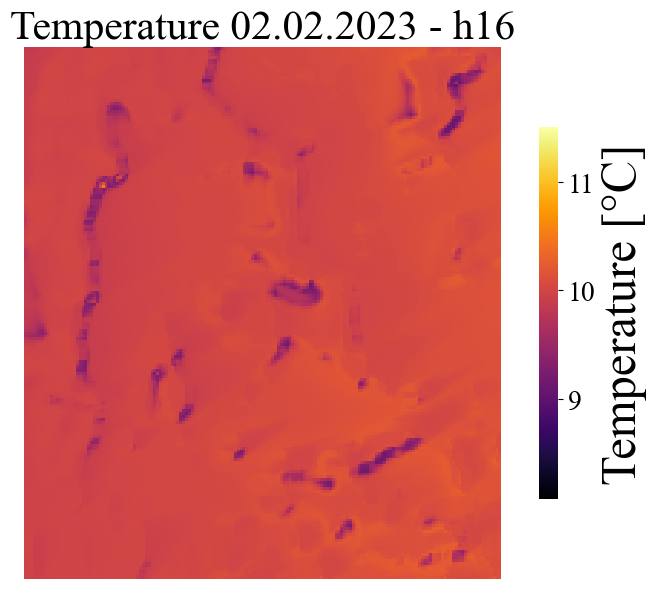

In [12]:
fig,ax = ML.make_plot_results_test_R2( save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/FebMar_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/FebMar_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/FebMar_figure_input_importance.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'NovJan',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/FebMar_figure_cross_period_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/FebMar_figure_cross_period_distribution_mae.png', dpi=150)

for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                         df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2023_02_01__2023_03_06.p'),
                                                         period = period, lat = lat, long = long,
                                                         dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                         ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                         save_figure=True,)

    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/era5_temperature_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)



## ARPA + ERA5

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense_15 (Dense)            (None, 512)               5120      
                                                                 
 dense_16 (Dense)            (None, 256)               131328    
                                                                 
 dense_17 (Dense)            (None, 128)               32896     
                                                                 
 dense_18 (Dense)            (None, 1)                 129       
                                                                 
Total params: 169,473
Trainable params: 169,473
Non-trainable params: 0
_________________________________________________________________


2023-06-21 21:06:45.105445: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 21:06:46.407910: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_mixed_arpa_era5/model_weights_temperature_mixed_arpa_era5__2023_02_01__2023_03_06/FFNN_temperature_mixed_arpa_era5_FebMar_out_21-06-2023_19-57-16/model_weights/assets


2023-06-21 21:14:26.554177: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.396845915572296   0.7094344250940533
Benchmark vs prediction r2: 0.8360127130056827   0.9563581369070577


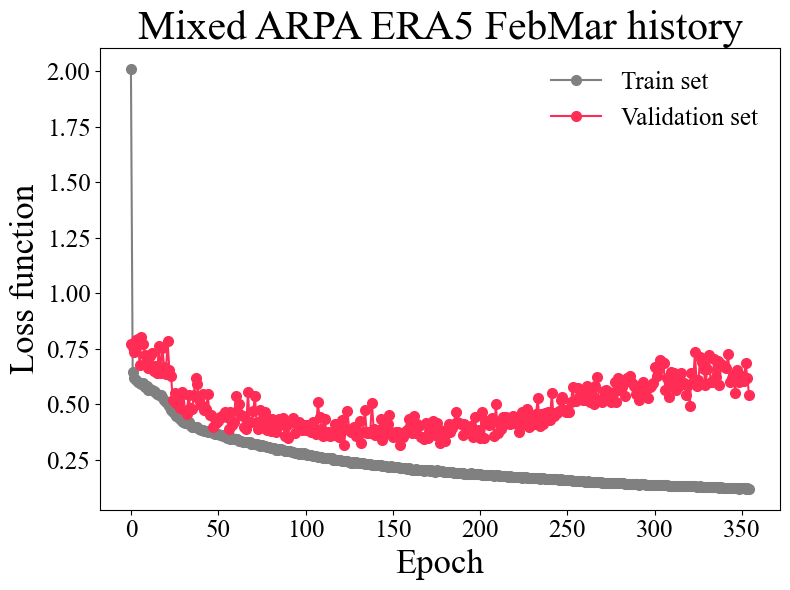

In [13]:
ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                         model_period_name = 'FebMar',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_13-06-2023_16-59-32.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'T_target',
                         max_n_neurons = 512,
                         min_n_neurons = 128,
                         n_layers = 3,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data(seed = 18,
                        test_train_proportion = 0.4,
                        val_test_proportion = 0.4,
                       )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

2023-06-21 21:14:54.196044: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


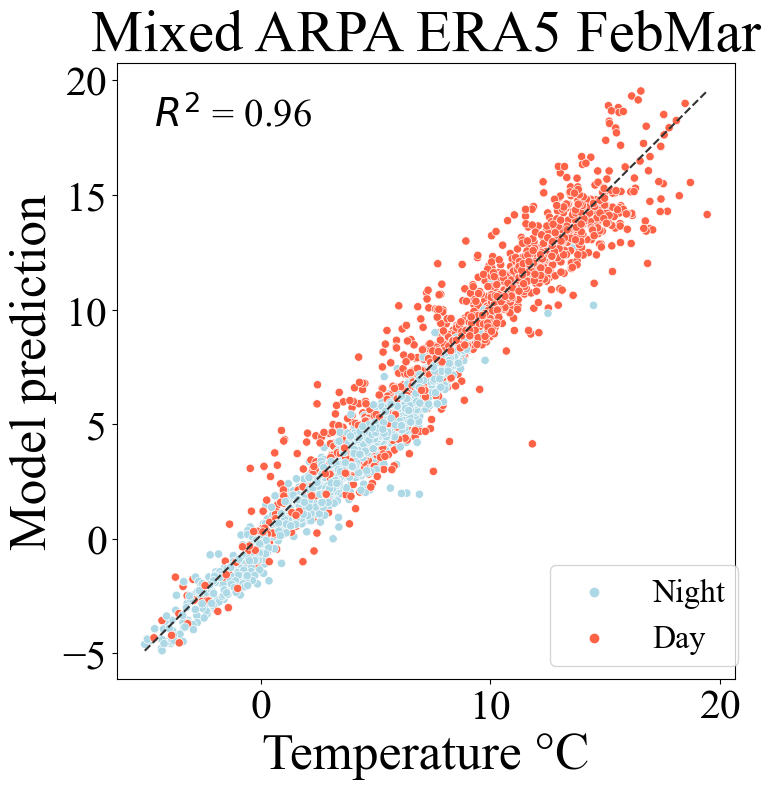

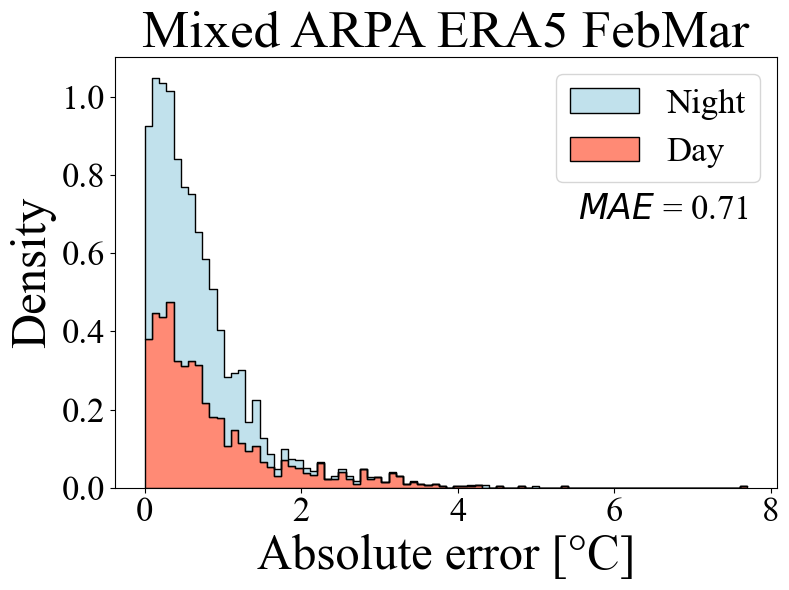

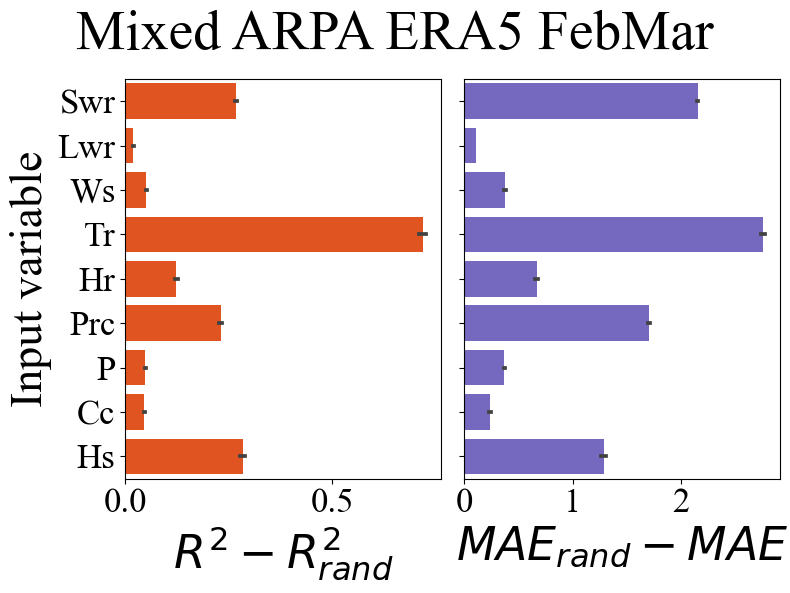

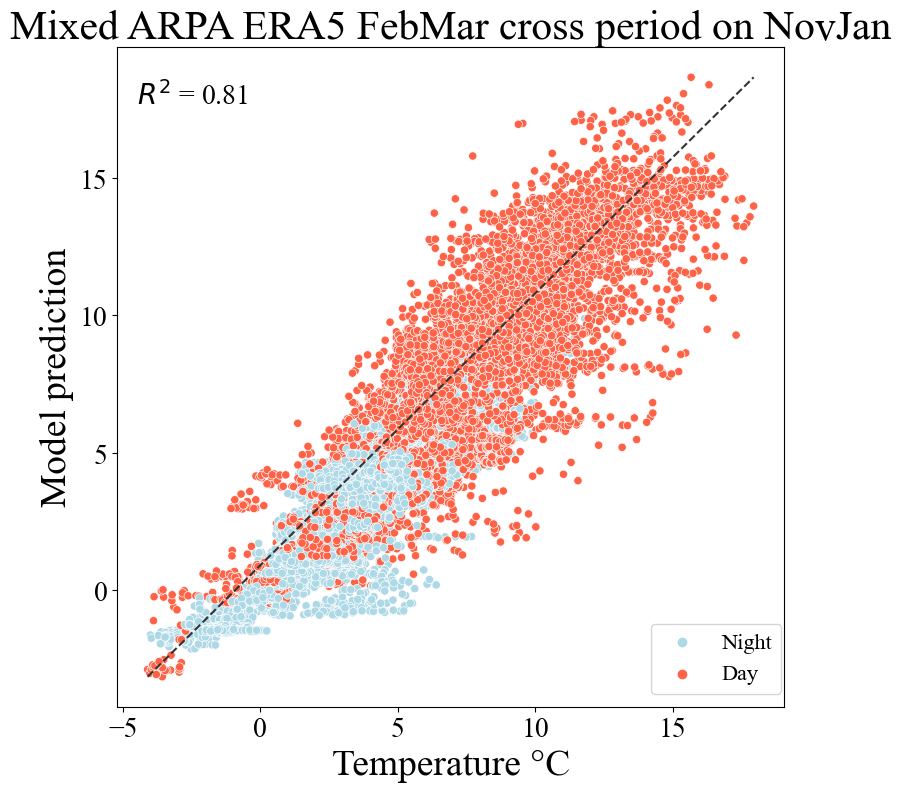

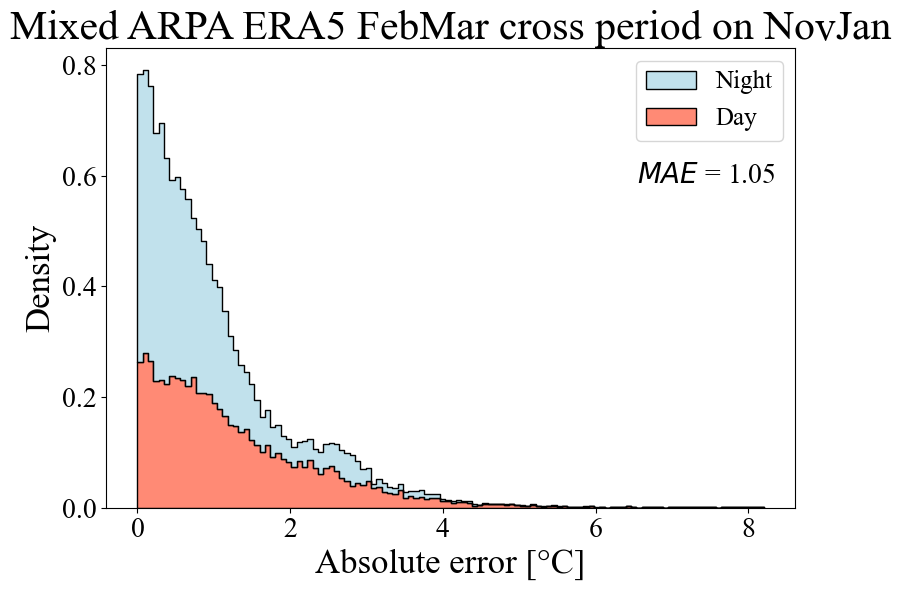

...

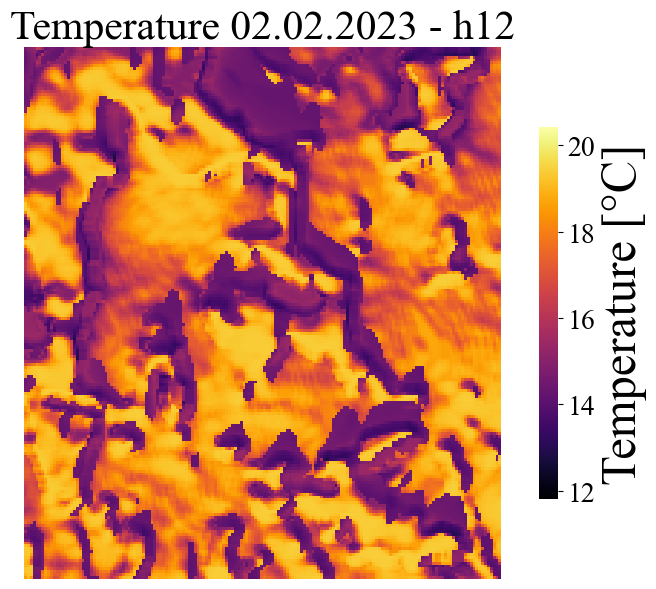

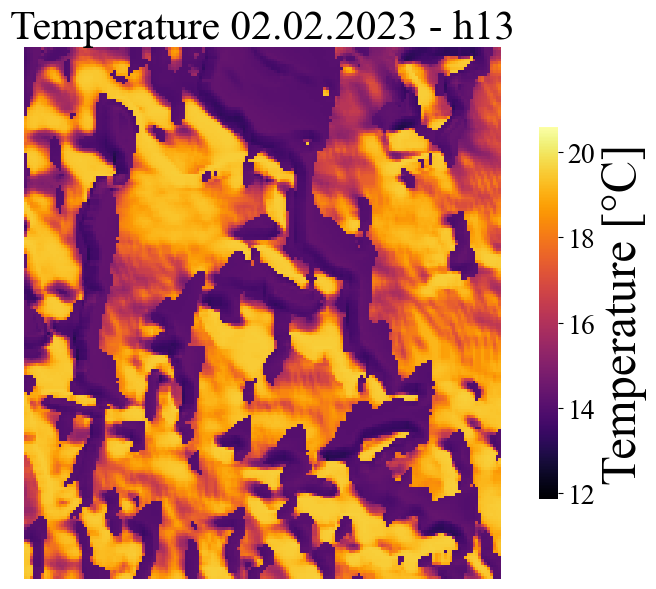

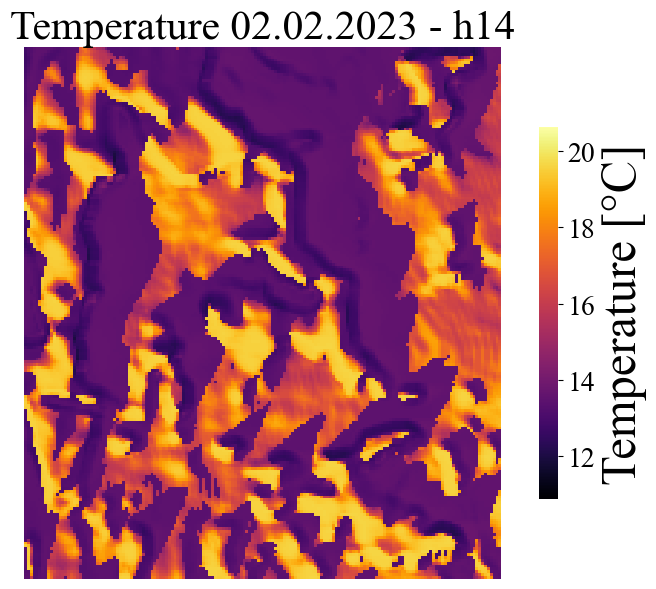

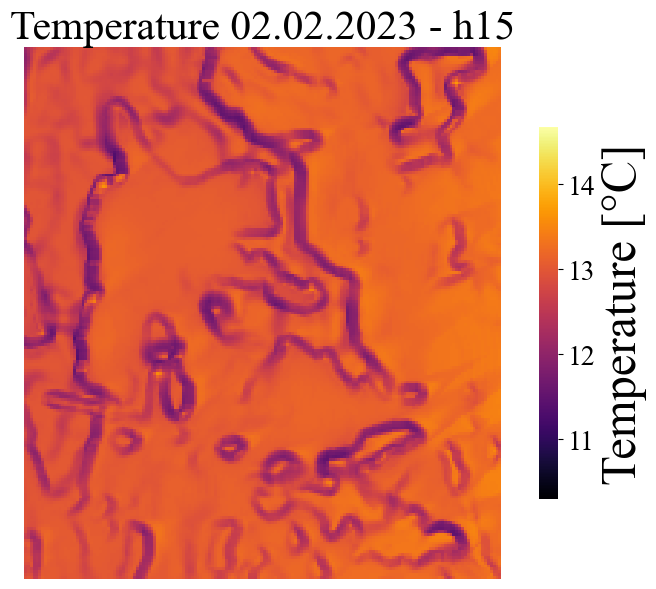

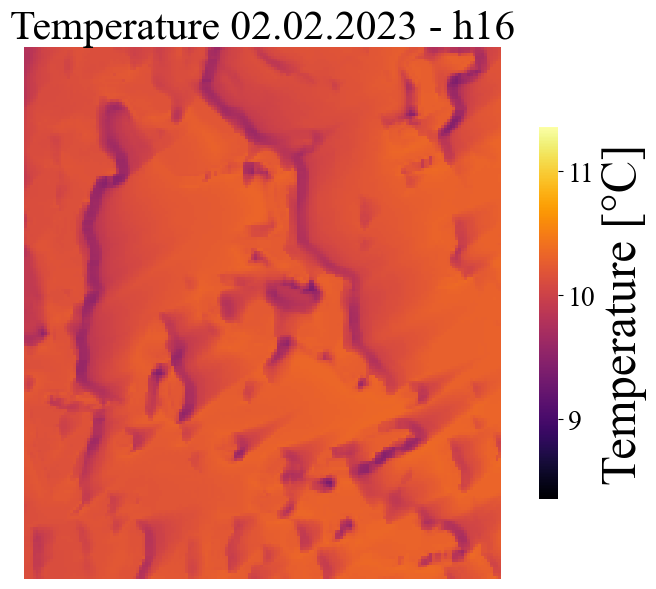

In [14]:
fig,ax = ML.make_plot_results_test_R2( save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/FebMar_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/FebMar_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/FebMar_figure_input_importance.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'NovJan',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/FebMar_figure_cross_period_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/FebMar_figure_cross_period_distribution_mae.png', dpi=150)

for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                         df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2023_02_01__2023_03_06.p'),
                                                         period = period, lat = lat, long = long,
                                                         dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                         ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                         save_figure=True,)

    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/mixed_arpa_era5_temperature_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)



# MarJun

In [5]:
periods = [
    [2023,6,20,9],
    [2023,6,20,10],
    [2023,6,20,11],
    [2023,6,20,12],
    [2023,6,20,13],
    [2023,6,20,14],
    [2023,6,20,15],
    [2023,6,20,16],
]

## ERA5

Metal device set to: Apple M1
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense (Dense)               (None, 512)               5120      
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dense_3 (Dense)             (None, 1)                 129       
                                                                 
Total params: 169,473
Trainable params: 169,473
Non-trainable params: 0
_________________________________________________________________


2023-06-30 09:04:31.936999: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-30 09:04:31.937104: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-06-30 09:04:32.095116: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-06-30 09:04:32.245505: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 09:04:37.112950: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_era5/model_weights_temperature_era5__2023_03_27__2023_06_22/FFNN_temperature_era5_MarJun_out_30-06-2023_09-01-46/model_weights/assets


2023-06-30 09:28:09.034888: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.2373867125488074   0.937330866389361
Benchmark vs prediction r2: 0.7941746381545879   0.960397667729622


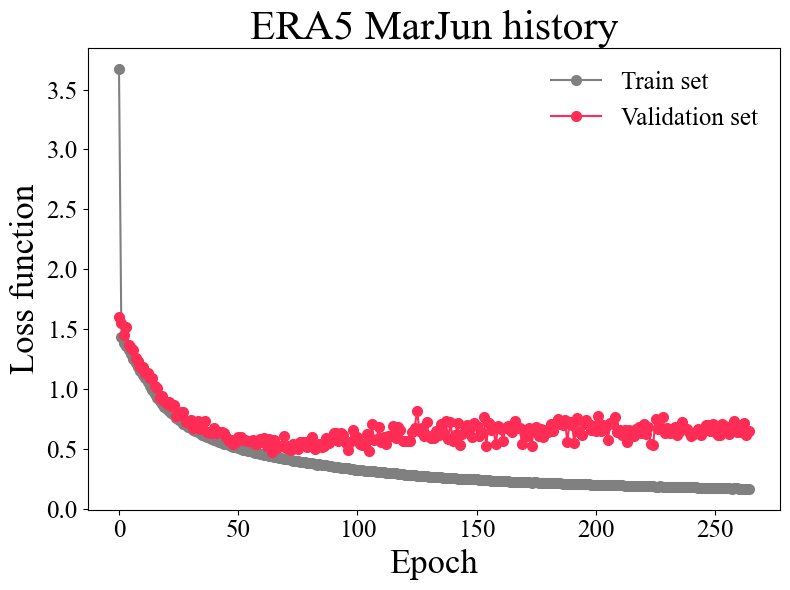

In [6]:
ML = MachineLearningFFNN(model_type_name = 'ERA5',
                         model_period_name = 'MarJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_03_27__2023_06_22/df_microclimate_era5_MarJun_out_28-06-2023_22-26-55.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'T_target',
                         max_n_neurons = 512,
                         min_n_neurons = 128,
                         n_layers = 3,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data(seed = 18,
                        test_train_proportion = 0.4,
                        val_test_proportion = 0.4,
                       )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

"\nfor period in periods:\n\n    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(\n                                                         df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2023_03_27__2023_06_22.p'),\n                                                         period = period, lat = lat, long = long,\n                                                         dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,\n                                                         ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,\n                                                         save_figure=True,)\n\n    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/era5_temperature_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)\n"

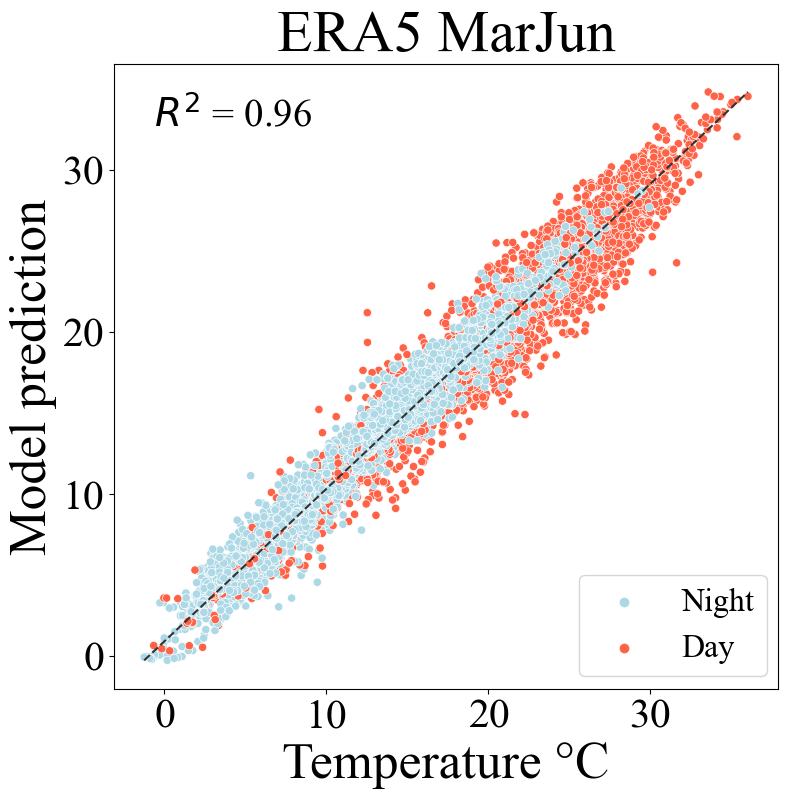

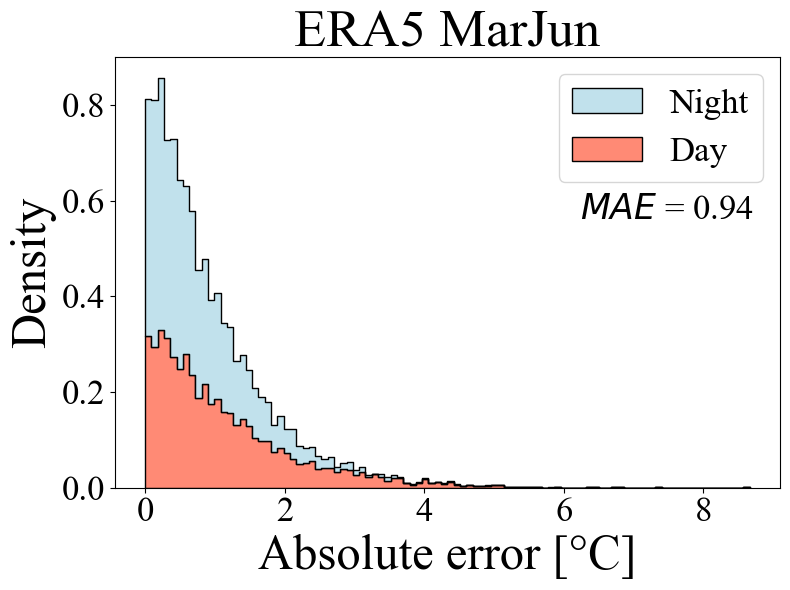

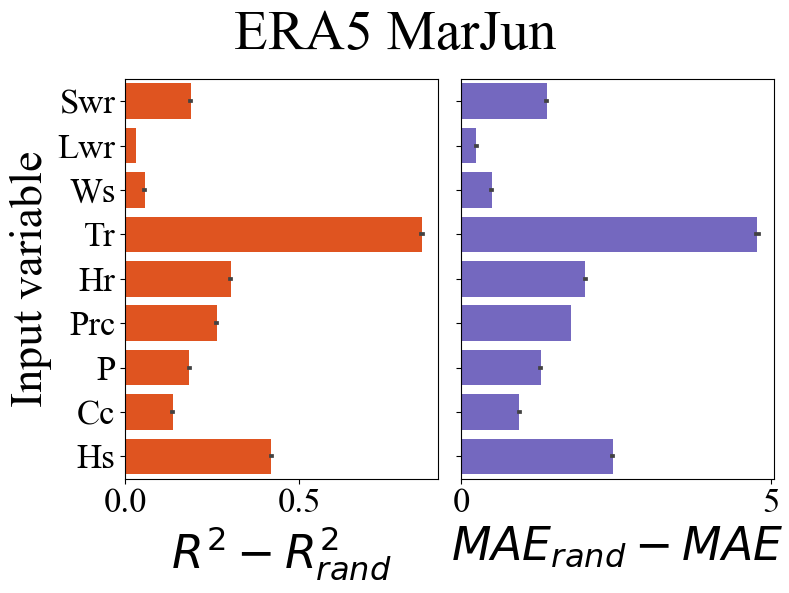

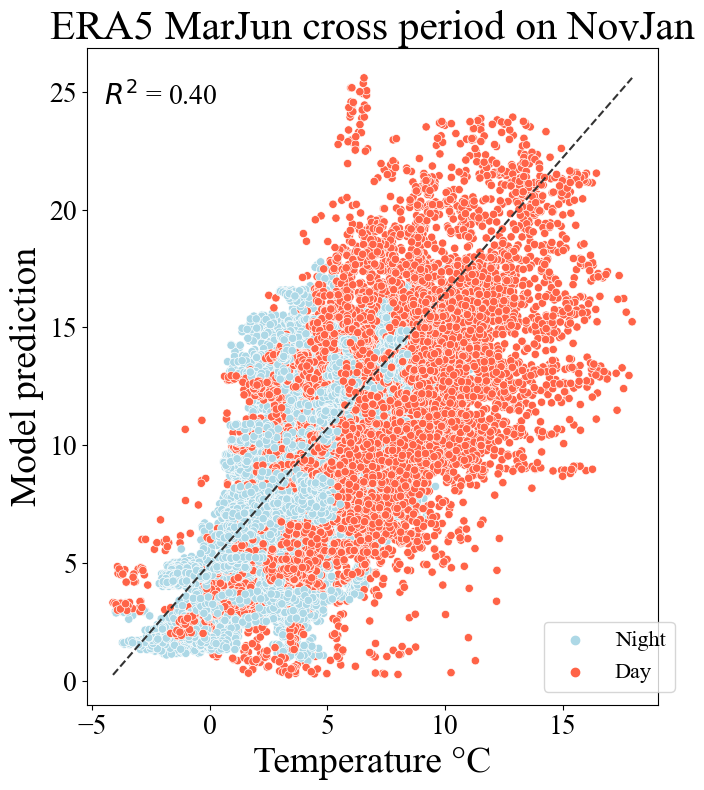

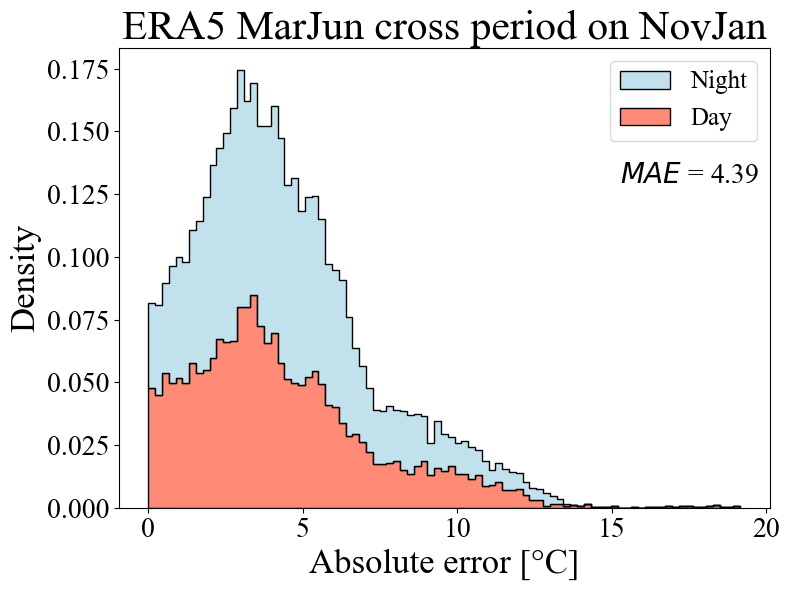

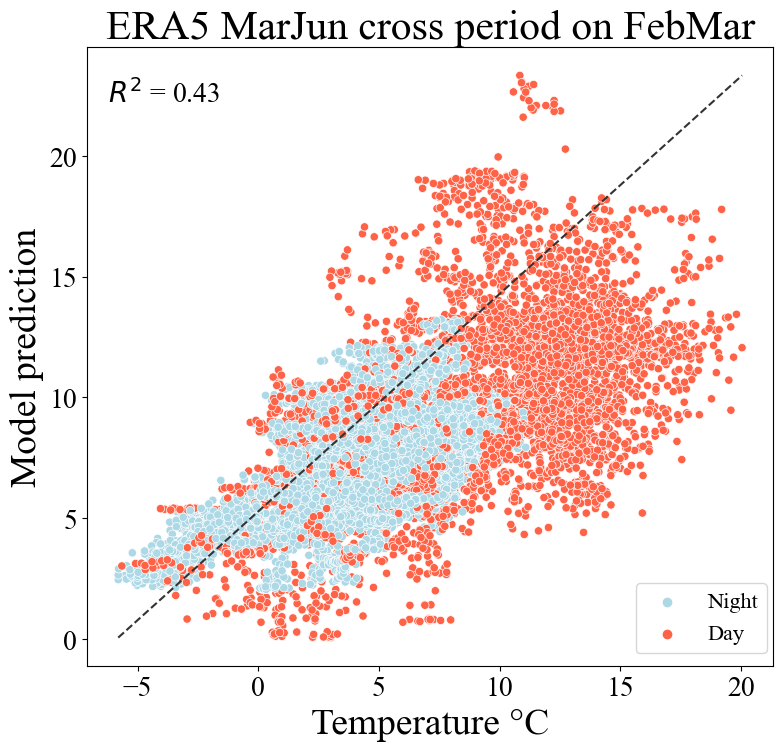

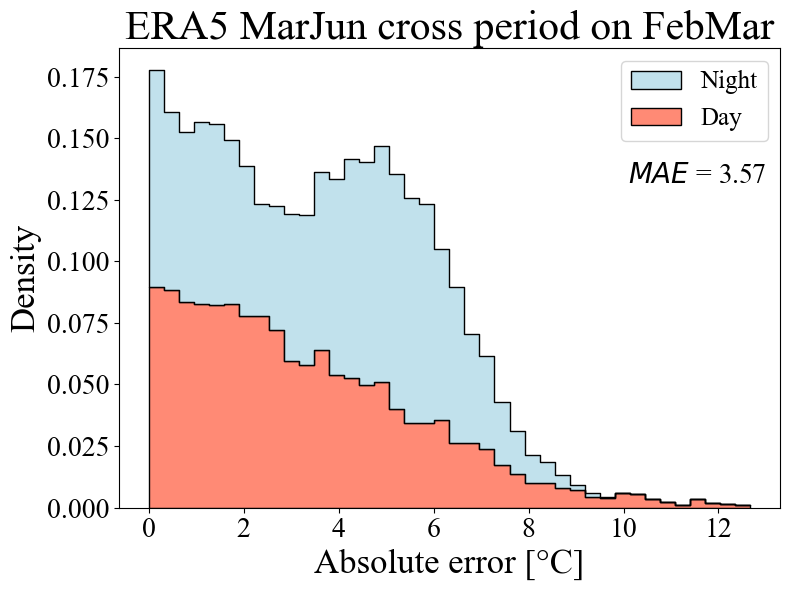

In [12]:
fig,ax = ML.make_plot_results_test_R2( save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/MarJun_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/MarJun_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/MarJun_figure_input_importance.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'NovJan',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/MarJun_figure_cross_period_NovJan_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/MarJun_figure_cross_period_NovJan_distribution_mae.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'FebMar',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/MarJun_figure_cross_period_FebMar_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/MarJun_figure_cross_period_FebMar_distribution_mae.png', dpi=150)

'''
for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                         df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2023_03_27__2023_06_22.p'),
                                                         period = period, lat = lat, long = long,
                                                         dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                         ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                         save_figure=True,)

    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/era5_temperature_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)
'''

## ARPA + ERA5

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 9)]               0         
                                                                 
 dense_4 (Dense)             (None, 512)               5120      
                                                                 
 dense_5 (Dense)             (None, 256)               131328    
                                                                 
 dense_6 (Dense)             (None, 128)               32896     
                                                                 
 dense_7 (Dense)             (None, 1)                 129       
                                                                 
Total params: 169,473
Trainable params: 169,473
Non-trainable params: 0
_________________________________________________________________


2023-06-30 09:39:18.461895: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 09:39:23.328654: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


INFO:tensorflow:Assets written to: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_mixed_arpa_era5/model_weights_temperature_mixed_arpa_era5__2023_03_27__2023_06_22/FFNN_temperature_mixed_arpa_era5_MarJun_out_30-06-2023_09-01-46/model_weights/assets


2023-06-30 10:01:16.697947: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.4087940420136853   0.8099326121879117
Benchmark vs prediction r2: 0.9207289710762092   0.9687934090075028


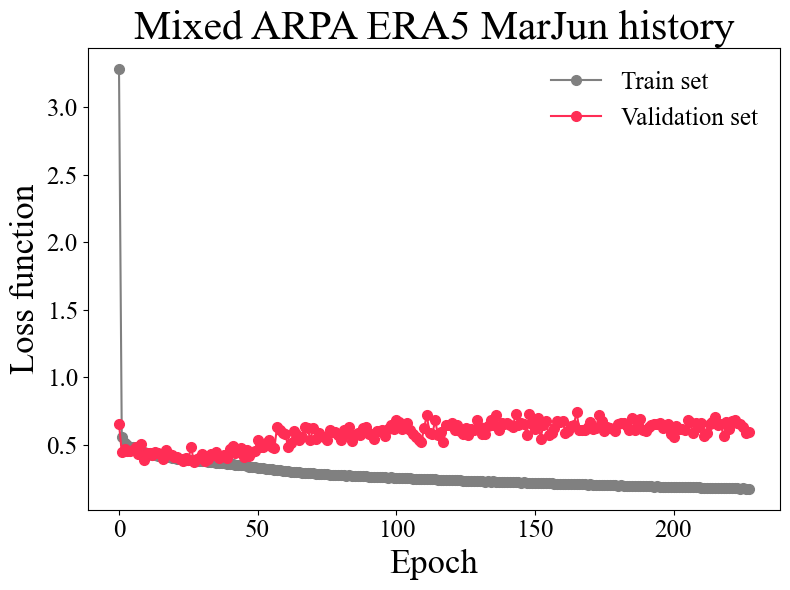

In [13]:
ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                         model_period_name = 'MarJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_03_27__2023_06_22/df_microclimate_mixed_arpa_era5_MarJun_out_29-06-2023_14-03-45.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'T_target',
                         max_n_neurons = 512,
                         min_n_neurons = 128,
                         n_layers = 3,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.elaborate_input_data(seed = 18,
                        test_train_proportion = 0.4,
                        val_test_proportion = 0.4,
                       )

ML.create_model(display_summary = True)

ML.train(epochs = 1000, patience = 200,
         metric_to_monitor = 'val_loss', restore_best_weights = True, 
         plot_history_bool = True, verbose = 0,
        )

ML.save_model_properties(datetime = DATETIME)

ML.test()

2023-06-30 10:14:37.457127: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


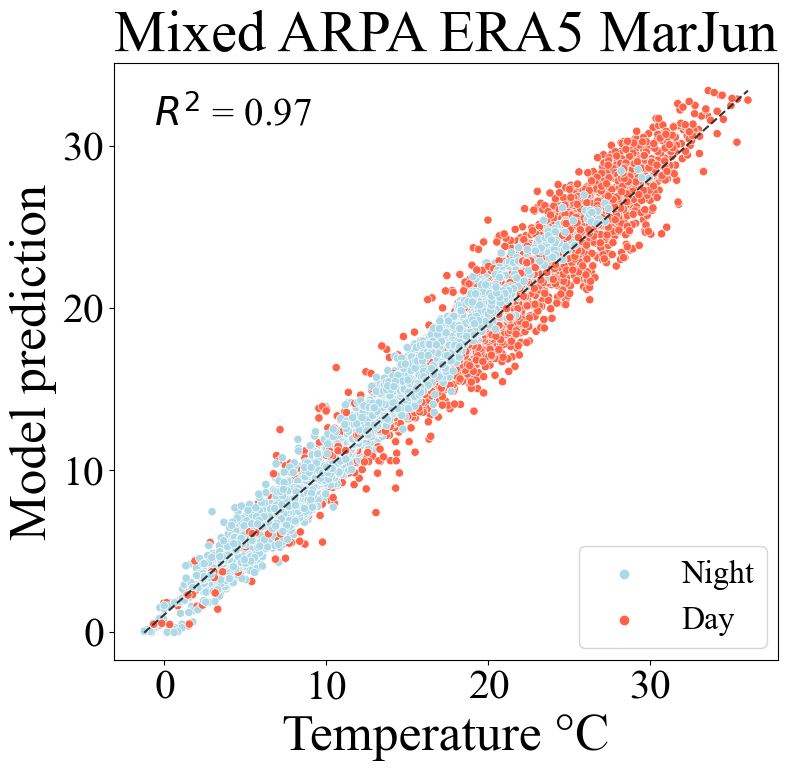

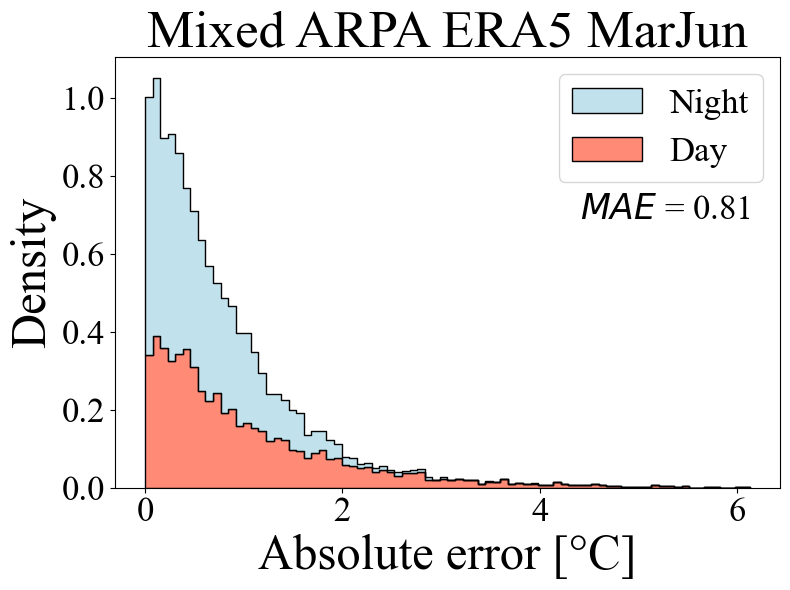

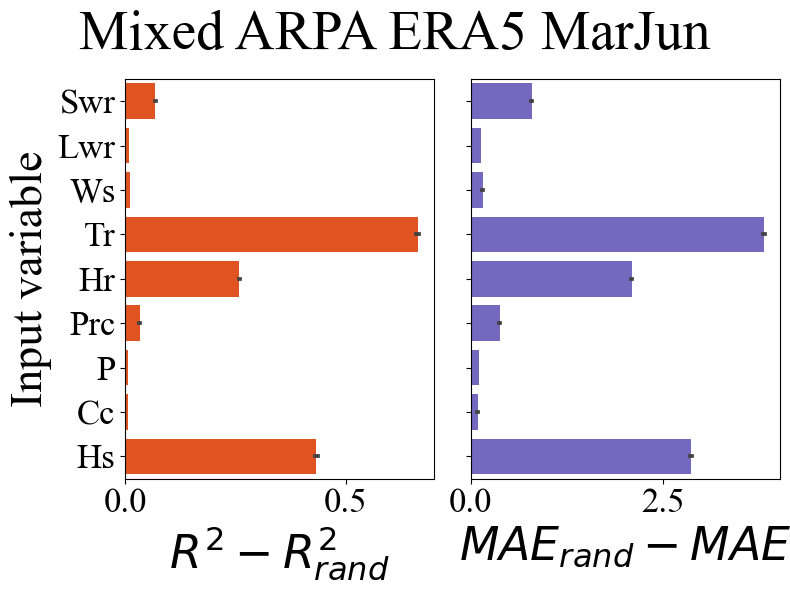

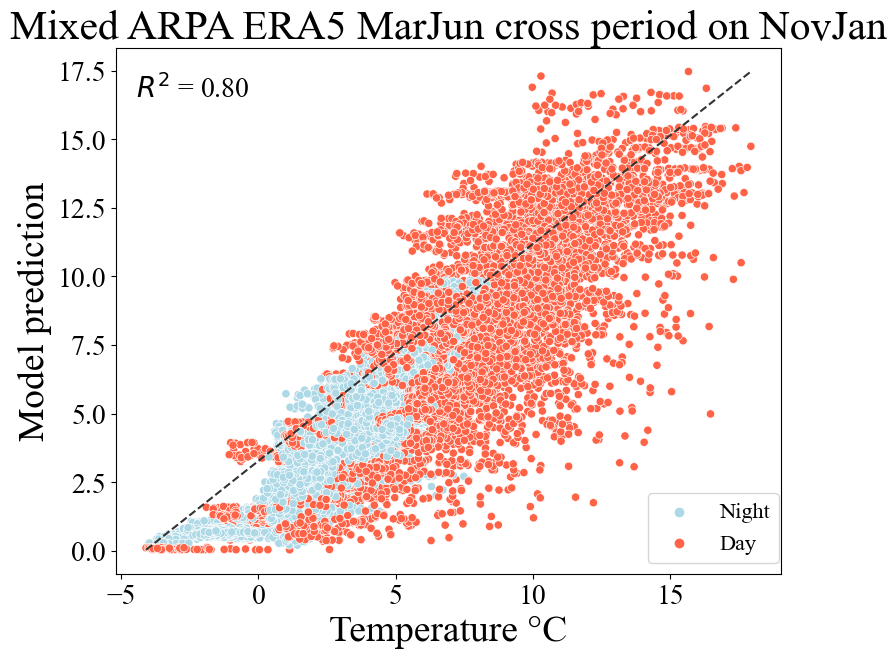

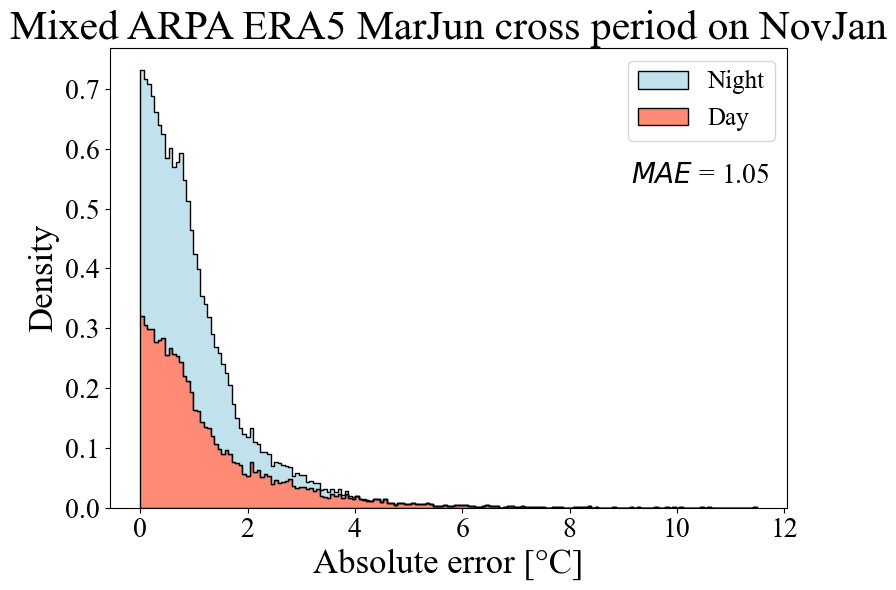

...

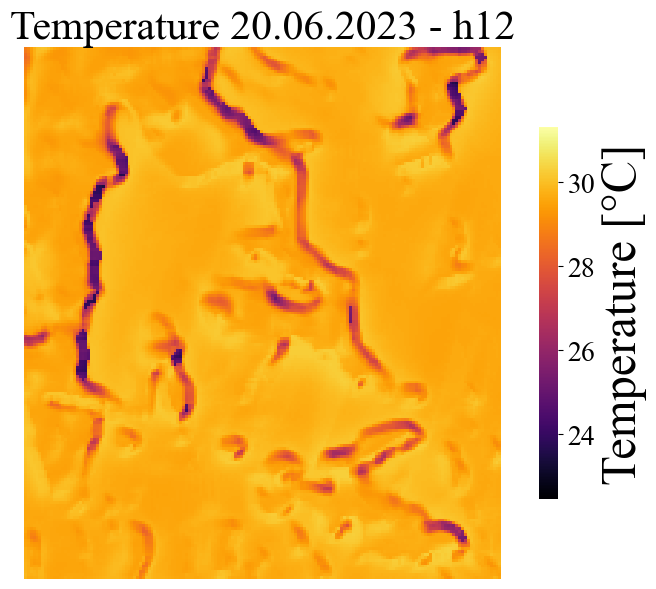

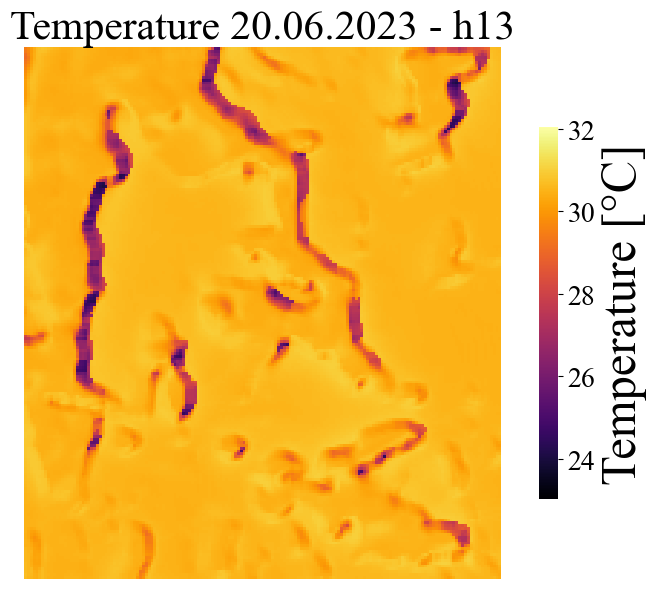

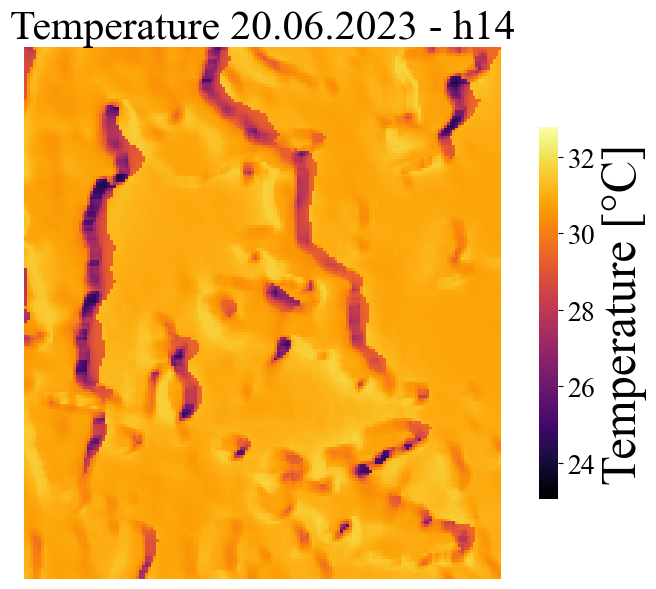

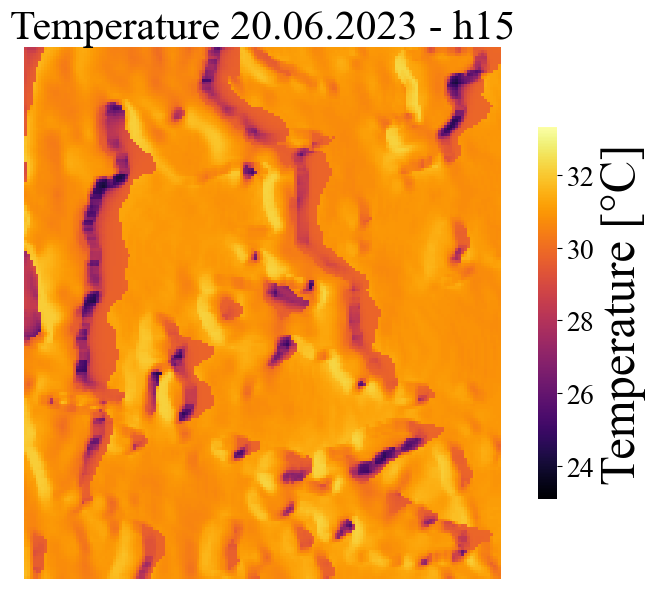

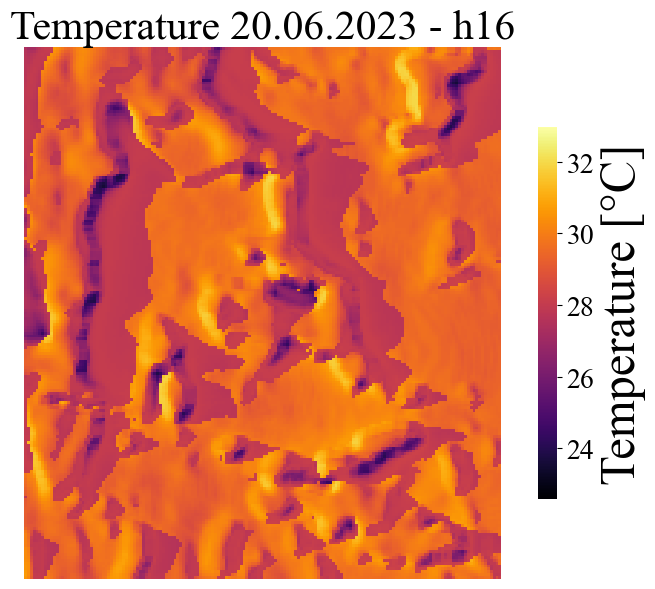

In [15]:
fig,ax = ML.make_plot_results_test_R2( save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/MarJun_figure_results_test_R2.png', dpi=150)

fig,ax = ML.make_plot_distribution_test_mae(save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/MarJun_figure_mae_distribution.png', dpi=150)

fig, ax = ML.make_plot_inputs_importance(n_simul = 10,save_fig = True)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/MarJun_figure_input_importance.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'NovJan',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/MarJun_figure_cross_period_NovJan_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/MarJun_figure_cross_period_NovJan_distribution_mae.png', dpi=150)

fig_r2, ax_r2, fig_mae, ax_mae = ML.make_plot_cross_period_prediction(df_filename_cross_period = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_13-06-2023_16-59-32.p',
                                                                      cross_period_name = 'FebMar',save_fig = True)

fig_r2.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/MarJun_figure_cross_period_FebMar_results_test_R2.png', dpi=150)
fig_mae.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/MarJun_figure_cross_period_FebMar_distribution_mae.png', dpi=150)


for period in periods:

    fig,ax = ML.make_plot_microclimate_prediction_over_study_area(
                                                         df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2023_03_27__2023_06_22.p'),
                                                         period = period, lat = lat, long = long,
                                                         dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                         ha = ha, svf = svf, study_area_coordinates = study_area_coordinates,
                                                         save_figure=True,)

    fig.savefig(RESULTS_PATH+'figures/microclima_prediction_figures/mixed_arpa_era5_temperature_spacemap_{}_{}_{:02d}_{:02d}.png'.format(period[0], period[1], period[2], period[3]), dpi=150)



# Supplementary tests

This section includes several supplementary tests:
1. Hyperparameter optimization.
2. Evaluation of $R^2$ and MAE variations across different sensor configurations in the test, train, and validation sets.
3. Comparison between the neural network and a simple linear regression model across different sensor configurations to assess the neural network's superiority.
4. Benchmark testing across different sensor configurations.

## Hyperparamters optimization

Various hyperparameter configurations defining the neural network architecture were tested, and the configuration that achieved the lowest test accuracy was chosen as the final architecture. Specifically, four different configurations involving the number of hidden layers and the maximum number of neurons were examined. The sigmoidal activation function and the initial learning rate were kept constant throughout the testing process.

### NovJun

In [5]:
hyperparam_configs = [
    [2048,5],
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'ERA5',
                             model_period_name = 'NovJun',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_06_22/df_microclimate_era5_NovJun_out_30-06-2023_12-42-55.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'T_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data_fixed_sensors(idxs_train = [2,4,5,6,7,9,10,11,14,16,17,18,19,20,21,24,25],
                                          idxs_validation = [3,12,13,22],
                                          idxs_test = [1,8,15,23],
                                         )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()

    del ML, hyperparam_config

2023-06-30 16:09:41.219749: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 16:09:57.148920: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[2048, 5]


2023-06-30 17:10:48.133533: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.858542768315666   0.7173000362987686
Benchmark vs prediction r2: 0.7881641079728006   0.9731515471892436


2023-06-30 17:10:52.012640: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 17:11:02.121504: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-06-30 19:22:25.239370: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.858542768315666   0.6035448515967987
Benchmark vs prediction r2: 0.7881641079728006   0.9785415490129327


2023-06-30 19:22:28.838094: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 19:22:37.038525: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-06-30 19:53:53.304457: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.858542768315666   0.6933239489946822
Benchmark vs prediction r2: 0.7881641079728006   0.9777546762045376


2023-06-30 19:53:56.949158: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 19:54:03.935216: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]


2023-06-30 20:20:39.384074: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.858542768315666   0.7850671134950997
Benchmark vs prediction r2: 0.7881641079728006   0.9704791894538547


2023-06-30 20:20:42.804688: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 20:20:50.358893: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]


2023-06-30 20:50:40.168045: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.858542768315666   1.4143890311269092
Benchmark vs prediction r2: 0.7881641079728006   0.9239076261390411


Hyperparameters configurations for ERA5 on NovJun

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 5, 2048        | $0.973$  | $0.717$ |
| 4, 1024        | $0.979$  | $0.604$ |
| 3, 512         | $0.978$  | $0.693$ |
| 2, 256         | $0.970$  | $0.785$ |
| 1, 128         | $0.924$  | $1.414$ |

In [6]:
hyperparam_configs = [
    [2048,5],
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                             model_period_name = 'NovJun',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_06_22/df_microclimate_mixed_arpa_era5_NovJun_out_30-06-2023_12-42-55',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'T_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data_fixed_sensors(idxs_train = [2,4,5,6,7,9,10,11,14,16,17,18,19,20,21,24,25],
                                          idxs_validation = [3,12,13,22],
                                          idxs_test = [1,8,15,23],
                                         )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()

    del ML, hyperparam_config

2023-06-30 20:50:43.524604: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 20:50:59.760075: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[2048, 5]


2023-06-30 21:47:43.026086: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.1790171258671396   0.5895155723144739
Benchmark vs prediction r2: 0.9441694603899499   0.9839011580797469


2023-06-30 21:47:46.800768: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 21:47:56.940295: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-06-30 22:24:30.188719: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.1790171258671396   0.5403627089967864
Benchmark vs prediction r2: 0.9441694603899499   0.9852848924292678


2023-06-30 22:24:33.754824: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 22:24:42.021992: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-06-30 22:55:31.383159: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.1790171258671396   0.5648519514086404
Benchmark vs prediction r2: 0.9441694603899499   0.984212830081104


2023-06-30 22:55:34.994408: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 22:55:42.354570: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]


2023-06-30 23:22:20.680914: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.1790171258671396   0.5753756850143329
Benchmark vs prediction r2: 0.9441694603899499   0.983732244671249


2023-06-30 23:22:24.096212: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 23:22:31.881825: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]


2023-06-30 23:56:34.860999: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.1790171258671396   0.6998972411794554
Benchmark vs prediction r2: 0.9441694603899499   0.9777624570679763


Hyperparameters configurations for Mixed ARPA ERA5 on NovJun

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 5, 2048        | $0.984$  | $0.589$ |
| 4, 1024        | $0.985$  | $0.540$ |
| 3, 512         | $0.984$  | $0.565$ |
| 2, 256         | $0.984$  | $0.575$ |
| 1, 128         | $0.980$  | $0.700$ |

### NovJan

In [3]:
hyperparam_configs = [
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'ERA5',
                             model_period_name = 'NovJan',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'T_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = 18,
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()

    del ML, hyperparam_config


Metal device set to: Apple M1


2023-06-20 14:38:32.327659: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-20 14:38:32.327754: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-06-20 14:38:32.454363: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-06-20 14:38:32.593024: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 14:38:35.972330: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-06-20 14:50:49.528028: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 4.2272004732972395   0.4100457905112636
Benchmark vs prediction r2: 0.4711560296396471   0.9463297575442684


2023-06-20 14:50:50.984372: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 14:50:53.765591: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-06-20 15:01:12.814327: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 4.2272004732972395   0.4517310885935969
Benchmark vs prediction r2: 0.4711560296396471   0.9395732671838846


2023-06-20 15:01:14.225531: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 15:01:16.658955: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]


2023-06-20 15:10:22.871022: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 4.2272004732972395   0.4738556258830804
Benchmark vs prediction r2: 0.4711560296396471   0.9367817732651749


2023-06-20 15:10:24.209866: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 15:10:26.565249: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]


2023-06-20 15:19:25.428796: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 4.2272004732972395   0.7783545363517783
Benchmark vs prediction r2: 0.4711560296396471   0.8646740941890657


Hyperparameters configurations for ERA5 on NovJan

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 4, 1024        | $0.946$  | $0.410$ |
| 3, 512         | $0.940$  | $0.452$ |
| 2, 256         | $0.937$  | $0.474$ |
| 1, 128         | $0.865$  | $0.778$ |

In [4]:
hyperparam_configs = [
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                             model_period_name = 'NovJan',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'T_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = 18,
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()

    del ML, hyperparam_config





2023-06-20 15:19:26.767472: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 15:19:30.169917: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-06-20 15:31:51.415521: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 0.8893940393655987   0.40346096304174156
Benchmark vs prediction r2: 0.7997229651503607   0.9475990328883079


2023-06-20 15:31:52.851782: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 15:31:55.618853: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-06-20 15:42:18.101419: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 0.8893940393655987   0.42044277117524337
Benchmark vs prediction r2: 0.7997229651503607   0.9448303600945285


2023-06-20 15:42:19.510649: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 15:42:21.901931: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]


2023-06-20 15:51:21.137074: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 0.8893940393655987   0.4421327182463032
Benchmark vs prediction r2: 0.7997229651503607   0.9372594220734597


2023-06-20 15:51:22.482761: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 15:51:24.819136: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]


2023-06-20 16:00:27.266747: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 0.8893940393655987   0.5553431871100389
Benchmark vs prediction r2: 0.7997229651503607   0.9124682407213125


Hyperparameters configurations for Mixed ARPA ERA5 on NovJan

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 4, 1024        | $0.948$  | $0.403$ |
| 3, 512         | $0.944$  | $0.420$ |
| 2, 256         | $0.937$  | $0.442$ |
| 1, 128         | $0.912$  | $0.555$ |

### FebMar

In [5]:
hyperparam_configs = [
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'ERA5',
                             model_period_name = 'FebMar',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'T_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = 18,
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()
    del ML, hyperparam_config

2023-06-20 16:00:28.099700: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 16:00:29.668643: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-06-20 16:05:36.719489: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.829650076388876   0.6616608283556829
Benchmark vs prediction r2: 0.7813656030019002   0.9605461628313625


2023-06-20 16:05:37.412371: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 16:05:38.740490: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-06-20 16:09:55.192813: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.829650076388876   0.7006480742961637
Benchmark vs prediction r2: 0.7813656030019002   0.9576330854407428


2023-06-20 16:09:55.852186: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 16:09:57.002625: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]
Benchmark vs prediction mae: 1.829650076388876   0.6598018212554925
Benchmark vs prediction r2: 0.7813656030019002   0.9586206777581483


2023-06-20 16:13:42.224967: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 16:13:42.857187: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 16:13:43.940063: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]
Benchmark vs prediction mae: 1.829650076388876   0.9337724968180686
Benchmark vs prediction r2: 0.7813656030019002   0.9252127166720652


2023-06-20 16:17:13.236816: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Hyperparameters configurations for ERA5 on FebMar

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 4, 1024        | $0.961$  | $0.662$ |
| 3, 512         | $0.958$  | $0.701$ |
| 2, 256         | $0.959$  | $0.660$ |
| 1, 128         | $0.925$  | $0.934$ |

In [6]:
hyperparam_configs = [
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                             model_period_name = 'FebMar',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'T_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = 18,
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()
    del ML, hyperparam_config

2023-06-20 16:17:14.256835: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 16:17:15.836491: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-06-20 16:22:23.443835: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.396845915572296   0.6611744174811417
Benchmark vs prediction r2: 0.8360127130056827   0.9584197354443493


2023-06-20 16:22:24.116694: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 16:22:25.396126: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-06-20 16:26:43.068056: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.396845915572296   0.6584255240874234
Benchmark vs prediction r2: 0.8360127130056827   0.9597409481414523


2023-06-20 16:26:43.726012: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 16:26:44.885691: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]
Benchmark vs prediction mae: 1.396845915572296   0.664609662121992
Benchmark vs prediction r2: 0.8360127130056827   0.9587592797940299


2023-06-20 16:30:27.127209: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 16:30:27.750967: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 16:30:28.805931: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]
Benchmark vs prediction mae: 1.396845915572296   0.7999738355886131
Benchmark vs prediction r2: 0.8360127130056827   0.9426416772259085


2023-06-20 16:34:00.159101: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Hyperparameters configurations for Mixed ARPA ERA5 on FebMar

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 4, 1024        | $0.958$  | $0.661$ |
| 3, 512         | $0.960$  | $0.658$ |
| 2, 256         | $0.959$  | $0.665$ |
| 1, 128         | $0.836$  | $0.800$ |

### MarJun

In [5]:
hyperparam_configs = [
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'ERA5',
                             model_period_name = 'MarJun',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_03_27__2023_06_22/df_microclimate_era5_MarJun_out_28-06-2023_22-26-55.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'T_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = 18,
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()
    del ML, hyperparam_config

2023-06-29 20:38:09.509617: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-29 20:38:09.509950: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-06-29 20:38:09.686079: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


Metal device set to: Apple M1


2023-06-29 20:38:09.841593: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 20:38:15.275310: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-06-29 20:59:46.567595: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.2373867125488074   0.9376808113743846
Benchmark vs prediction r2: 0.7941746381545879   0.9570176869071053


2023-06-29 20:59:49.147103: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 20:59:54.569319: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-06-29 21:19:19.061843: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.2373867125488074   0.923219131219091
Benchmark vs prediction r2: 0.7941746381545879   0.9593323715600649


2023-06-29 21:19:21.604839: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 21:19:26.274547: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]


2023-06-29 21:36:19.192527: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.2373867125488074   0.9245327210286348
Benchmark vs prediction r2: 0.7941746381545879   0.9602242163706995


2023-06-29 21:36:21.640323: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 21:36:25.702823: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]


2023-06-29 21:51:14.814303: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.2373867125488074   1.5218953808196365
Benchmark vs prediction r2: 0.7941746381545879   0.8949643025181245


Hyperparameters configurations for ERA5 on MarJun

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 4, 1024        | $0.957$  | $0.938$ |
| 3, 512         | $0.959$  | $0.923$ |
| 2, 256         | $0.960$  | $0.925$ |
| 1, 128         | $1.522$  | $0.895$ |

In [6]:
hyperparam_configs = [
    [1024,4],
    [512,3],
    [256,2],
    [128,1],
]

for hyperparam_config in hyperparam_configs:

    ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                             model_period_name = 'MarJun',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_03_27__2023_06_22/df_microclimate_mixed_arpa_era5_MarJun_out_29-06-2023_14-03-45.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'T_target',
                             max_n_neurons = hyperparam_config[0],
                             min_n_neurons = 128,
                             n_layers = hyperparam_config[1],
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = 18,
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    print(hyperparam_config)
    ML.test()
    del ML, hyperparam_config

2023-06-29 21:51:17.186192: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 21:51:23.471354: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[1024, 4]


2023-06-29 22:15:38.582833: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.4087940420136853   0.9146494207824806
Benchmark vs prediction r2: 0.9207289710762092   0.9588130893636031


2023-06-29 22:15:41.353449: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 22:15:47.176177: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[512, 3]


2023-06-29 22:35:55.343979: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.4087940420136853   0.9514986509097494
Benchmark vs prediction r2: 0.9207289710762092   0.9564998105154778


2023-06-29 22:35:57.894094: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 22:36:02.719865: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[256, 2]


2023-06-29 22:53:16.156098: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.4087940420136853   0.9334374855887979
Benchmark vs prediction r2: 0.9207289710762092   0.9605338503541092


2023-06-29 22:53:18.615714: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 22:53:22.801169: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[128, 1]


2023-06-29 23:08:23.349143: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.4087940420136853   0.9518238778665462
Benchmark vs prediction r2: 0.9207289710762092   0.9605769506571941


Hyperparameters configurations for Mixed ARPA ERA5 on MarJun

| Hypeparameters |    R2    |   MAE   |
|----------------|:--------:|------:  |
| 4, 1024        | $0.959$  | $0.915$ |
| 3, 512         | $0.956$  | $0.951$ |
| 2, 256         | $0.961$  | $0.933$ |
| 1, 128         | $0.961$  | $0.952$ |

## Sensors robustness

As the data division into train, validation, and test sets was achieved based on a per sensor division, the overall accuracy of the neural network could potentially be influenced by the specific partitioning of the sensors. To ensure that the neural network's accuracy is not heavily dependent on the sensor configurations, ten different configurations were utilized for training, validation, and testing. The table below presents the mean and standard deviation of the $R^2$ and MAE values across these ten configurations.

| Model |  Period  |       MAE       |       R2        |
|-------|:--------:|:---------------:|:---------------:|
| ERA5  |  NovJan  | $0.433\pm0.050$ | $0.951\pm0.010$ |
| Mixed |  NovJan  | $0.441\pm0.040$ | $0.945\pm0.011$ |
| ERA5  |  FebMar  | $0.683\pm0.067$ | $0.961\pm0.007$ |
| Mixed |  FebMar  | $0.702\pm0.051$ | $0.956\pm0.009$ |
| ERA5  |  MarJun  | $0.794\pm0.102$ | $0.968\pm0.009$ |
| Mixed |  MarJun  | $0.761\pm0.091$ | $0.970\pm0.009$ |

In the following subsections you can find the codes that have produced this table.

### NovJan

In [3]:
mae_arr = []
R2_arr = []

for _ in range(10):

    ML = MachineLearningFFNN(model_type_name = 'ERA5',
                             model_period_name = 'NovJan',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'T_target',
                             max_n_neurons = 1024,
                             min_n_neurons = 128,
                             n_layers = 4,
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = random.randint(0,1000000000),
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    
    ML.test()

    mae, R2 = ML.evaluate()

    mae_arr.append(mae)
    R2_arr.append(R2)
    
    del ML

print('Mae over different training configuration: ',np.mean(mae_arr), '+-', np.std(mae_arr))
print('R2 over different training configuration: ',np.mean(R2_arr), '+-', np.std(R2_arr))

Metal device set to: Apple M1


2023-06-20 16:51:44.656761: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-20 16:51:44.656848: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-06-20 16:51:44.786280: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-06-20 16:51:44.924849: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 16:51:48.431502: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 17:04:02.411564: I tensorflow/core/grappler/o

Benchmark vs prediction mae: 4.2365432580756615   0.4062574910487275
Benchmark vs prediction r2: 0.4746393343743821   0.9525827606532705


2023-06-20 17:04:03.860088: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 17:04:07.203350: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 17:16:16.488394: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 4.313410927120986   0.3657161483354638
Benchmark vs prediction r2: 0.4732881393474117   0.9652977148227293


2023-06-20 17:16:17.947992: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 17:16:21.521024: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 17:28:37.704353: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 4.231773137882003   0.3974159602867071
Benchmark vs prediction r2: 0.46686173291740635   0.9569837812875412


2023-06-20 17:28:39.155121: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 17:28:42.508127: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 19:22:23.226615: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 4.375023674447251   0.43045126374033155
Benchmark vs prediction r2: 0.46838755112843883   0.9602553699385964


2023-06-20 19:22:24.667341: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 19:22:27.981122: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 19:37:01.152288: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 4.217656882100694   0.46823114018198436
Benchmark vs prediction r2: 0.47766445870879676   0.9364096155253291


2023-06-20 19:37:02.831349: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 19:37:06.899184: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 19:55:40.255535: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 4.4458470102963   0.4564472738625692
Benchmark vs prediction r2: 0.46707509367793587   0.952668030570376


2023-06-20 19:55:42.527985: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 19:55:48.165133: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 20:16:22.253555: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 4.139222520897551   0.40532844730555917
Benchmark vs prediction r2: 0.47845886257121817   0.955885777593703


2023-06-20 20:16:23.708092: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 20:16:27.169603: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 20:28:37.637607: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 4.147887953008569   0.5325333838921056
Benchmark vs prediction r2: 0.4874364912524273   0.9361679672329393


2023-06-20 20:28:39.096301: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 20:28:42.450134: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 20:41:06.176700: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 4.436948127319853   0.48828085751243844
Benchmark vs prediction r2: 0.4729374386386163   0.9372826089374141


2023-06-20 20:41:07.624959: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 20:41:10.941452: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 20:53:15.622434: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 4.28417160368253   0.37996583259989514
Benchmark vs prediction r2: 0.4721916524876031   0.9615193765540363
Mae over different training configuration:  0.4330627798765782 +- 0.04984693807277436
R2 over different training configuration:  0.9515053003115936 +- 0.010412443382973624


In [3]:
mae_arr = []
R2_arr = []

for _ in range(10):

    ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                             model_period_name = 'NovJan',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'T_target',
                             max_n_neurons = 1024,
                             min_n_neurons = 128,
                             n_layers = 4,
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = random.randint(0,1000000000),
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    ML.test()
    mae, R2 = ML.evaluate()

    mae_arr.append(mae)
    R2_arr.append(R2)
    
    del ML

print('Mae over different training configuration: ',np.mean(mae_arr), '+-', np.std(mae_arr))
print('R2 over different training configuration: ',np.mean(R2_arr), '+-', np.std(R2_arr))
    
    

Metal device set to: Apple M1


2023-06-20 21:07:52.573964: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-20 21:07:52.574130: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-06-20 21:07:52.713030: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-06-20 21:07:52.861558: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 21:07:56.291160: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 21:19:58.830498: I tensorflow/core/grappler/o

Benchmark vs prediction mae: 0.8840834582505526   0.43386754264491195
Benchmark vs prediction r2: 0.7998689642005024   0.9395090462541296


2023-06-20 21:20:00.281481: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 21:20:03.564855: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 21:32:03.200361: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 0.8330633543602767   0.5024872191941181
Benchmark vs prediction r2: 0.8364462402786689   0.9330085952446048


2023-06-20 21:32:04.629243: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 21:32:07.951025: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 21:44:09.818359: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 0.8256669251263834   0.4062437290321471
Benchmark vs prediction r2: 0.8474045112444542   0.950744796961018


2023-06-20 21:44:11.246283: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 21:44:14.514646: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 21:56:23.129256: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 0.9322333672153712   0.47823895506029723
Benchmark vs prediction r2: 0.7955979776329096   0.9375953590395497


2023-06-20 21:56:24.565719: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 21:56:27.835664: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 22:08:33.978578: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 0.8430710980545039   0.3940920950406294
Benchmark vs prediction r2: 0.838895559910944   0.9575889166374738


2023-06-20 22:08:35.421668: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 22:08:38.735133: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 22:20:45.695213: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 0.8348414380845747   0.40336031229531716
Benchmark vs prediction r2: 0.8407951482262699   0.9587169766522302


2023-06-20 22:20:47.131328: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 22:20:50.427936: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 22:32:54.752702: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 0.8707979394681616   0.4707373862205317
Benchmark vs prediction r2: 0.819177118273262   0.9302857146939376


2023-06-20 22:32:56.203999: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 22:32:59.529226: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 22:45:03.227387: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 0.8855444884283135   0.3840209992853477
Benchmark vs prediction r2: 0.810272244603124   0.959829850548128


2023-06-20 22:45:04.681769: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 22:45:08.015032: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 22:57:15.672575: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 0.8549896663313094   0.47182372834160424
Benchmark vs prediction r2: 0.8139717864295255   0.9337524040504209


2023-06-20 22:57:17.126382: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 22:57:20.533622: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:09:23.302351: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 0.8498621567531217   0.4693304393308389
Benchmark vs prediction r2: 0.8333033002250702   0.9474680494525586
Mae over different training configuration:  0.4414202406445743 +- 0.03990645877190304
R2 over different training configuration:  0.9448499709534051 +- 0.010849982886860478


### FebMar

In [4]:
mae_arr = []
R2_arr = []

for _ in range(10):

    ML = MachineLearningFFNN(model_type_name = 'ERA5',
                             model_period_name = 'FebMar',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'T_target',
                             max_n_neurons = 1024,
                             min_n_neurons = 128,
                             n_layers = 4,
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = random.randint(0,1000000000),
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    
    ML.test()

    mae, R2 = ML.evaluate()

    mae_arr.append(mae)
    R2_arr.append(R2)
    
    del ML

print('Mae over different training configuration: ',np.mean(mae_arr), '+-', np.std(mae_arr))
print('R2 over different training configuration: ',np.mean(R2_arr), '+-', np.std(R2_arr))

2023-06-20 23:09:24.253069: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:09:25.839317: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:14:28.475333: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.9564513704639817   0.6911869515914907
Benchmark vs prediction r2: 0.7655051187945695   0.9583199902307659


2023-06-20 23:14:29.594222: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:14:31.124151: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:19:33.121545: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.988546327199822   0.8466754854937625
Benchmark vs prediction r2: 0.7585607429354944   0.9463043863969021


2023-06-20 23:19:33.799311: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:19:35.413850: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:24:37.351237: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.1620169732097354   0.6881114685514574
Benchmark vs prediction r2: 0.770632151867244   0.9588033107257065


2023-06-20 23:24:38.041460: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:24:39.600801: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:30:15.166362: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.9021671172227028   0.689956466938054
Benchmark vs prediction r2: 0.7730013877932869   0.958824132659509


2023-06-20 23:30:15.917018: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:30:17.655017: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:35:55.350831: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.9934405117702292   0.6976992286093492
Benchmark vs prediction r2: 0.7708623589724974   0.9531483723344827


2023-06-20 23:35:56.109997: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:35:57.960144: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:41:37.679881: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.0590499540958795   0.6248295790388702
Benchmark vs prediction r2: 0.7832228982251981   0.9641622983590706


2023-06-20 23:41:38.457316: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:41:40.251951: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:47:21.005228: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.0467317103973177   0.6033853974549582
Benchmark vs prediction r2: 0.7657098700364182   0.9646785359475695


2023-06-20 23:47:21.803398: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:47:23.622895: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:53:02.465290: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.1372765206075663   0.6217554948291872
Benchmark vs prediction r2: 0.7578763931387513   0.9700379766998786


2023-06-20 23:53:03.289232: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:53:05.087866: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:58:44.526489: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.01270126483467   0.6406893487435987
Benchmark vs prediction r2: 0.7742424276184183   0.9664727701338683


2023-06-20 23:58:45.355568: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-20 23:58:47.222632: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:04:30.663657: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.8054497950845119   0.7281517423699176
Benchmark vs prediction r2: 0.7890858206938942   0.9668508847559172
Mae over different training configuration:  0.6832441163620645 +- 0.06666987696127738
R2 over different training configuration:  0.9607602658243671 +- 0.006805714746125396


In [5]:
mae_arr = []
R2_arr = []

for _ in range(10):

    ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                             model_period_name = 'FebMar',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_13-06-2023_16-59-32.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'T_target',
                             max_n_neurons = 512,
                             min_n_neurons = 128,
                             n_layers = 3,
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = random.randint(0,1000000000),
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    ML.test()
    mae, R2 = ML.evaluate()

    mae_arr.append(mae)
    R2_arr.append(R2)
    
    del ML

print('Mae over different training configuration: ',np.mean(mae_arr), '+-', np.std(mae_arr))
print('R2 over different training configuration: ',np.mean(R2_arr), '+-', np.std(R2_arr))
    
    

2023-06-21 00:04:31.495335: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:04:33.080187: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:09:29.069225: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.5291087383621018   0.8272777951597506
Benchmark vs prediction r2: 0.7969386541774234   0.9346247346081346


2023-06-21 00:09:30.248835: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:09:31.751887: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:14:28.744232: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.4233490610886075   0.6442806780969821
Benchmark vs prediction r2: 0.8346437645932183   0.9638728320013223


2023-06-21 00:14:29.515942: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:14:31.047811: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:19:27.759839: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.4806261523304545   0.7522021621621889
Benchmark vs prediction r2: 0.8097685945762175   0.95390059970558


2023-06-21 00:19:28.545288: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:19:30.094333: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:24:27.167260: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.5945225692348153   0.6892087014404222
Benchmark vs prediction r2: 0.7916705290537883   0.9568333460519938


2023-06-21 00:24:27.953790: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:24:29.527589: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:29:29.078711: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.6516985052090118   0.6655271739799903
Benchmark vs prediction r2: 0.7852868227677747   0.9629620706586649


2023-06-21 00:29:29.878594: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:29:31.446317: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:34:36.515308: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.5098309346977947   0.6984356751455746
Benchmark vs prediction r2: 0.7968975140140611   0.9531873077813301


2023-06-21 00:34:37.315304: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:34:38.922558: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:39:44.731994: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.3768649524694216   0.6925995328235877
Benchmark vs prediction r2: 0.841612609887128   0.9680488096046045


2023-06-21 00:39:45.540847: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:39:47.153713: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:44:54.472193: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.486382578789008   0.7219266236646464
Benchmark vs prediction r2: 0.8171553424358198   0.9504101227100002


2023-06-21 00:44:55.283682: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:44:56.885561: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:50:03.426874: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.4889083107658607   0.6726506498681605
Benchmark vs prediction r2: 0.8142017494392698   0.9568501906340547


2023-06-21 00:50:04.236301: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:50:05.865685: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-21 00:55:13.438440: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.4734540941086771   0.6579416019969659
Benchmark vs prediction r2: 0.8147315775092515   0.9593314194661429
Mae over different training configuration:  0.7022050594338268 +- 0.05132293575296886
R2 over different training configuration:  0.9560021433221829 +- 0.00876703337364535


### MarJun

In [14]:
mae_arr = []
R2_arr = []

for _ in range(10):

    ML = MachineLearningFFNN(model_type_name = 'ERA5',
                             model_period_name = 'MarJun',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_03_27__2023_06_22/df_microclimate_era5_MarJun_out_28-06-2023_22-26-55.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'T_target',
                             max_n_neurons = 512,
                             min_n_neurons = 128,
                             n_layers = 3,
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = random.randint(0,1000000000),
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    
    ML.test()

    mae, R2 = ML.evaluate()

    mae_arr.append(mae)
    R2_arr.append(R2)
    
    del ML

print('Mae over different training configuration: ',np.mean(mae_arr), '+-', np.std(mae_arr))
print('R2 over different training configuration: ',np.mean(R2_arr), '+-', np.std(R2_arr))

2023-06-29 23:12:28.132094: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 23:12:33.093553: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 23:32:30.982509: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.175840818166257   0.7259619864537167
Benchmark vs prediction r2: 0.7934463304890635   0.9720788291055802


2023-06-29 23:32:33.616961: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 23:32:39.216906: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 23:53:13.616674: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.0217114623372416   0.8465712917760916
Benchmark vs prediction r2: 0.8082982994197541   0.9571447091487097


2023-06-29 23:53:16.311433: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-29 23:53:22.120871: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 00:13:50.838647: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.23335130431726   0.9640103226469106
Benchmark vs prediction r2: 0.7939589391474356   0.955104142848769


2023-06-30 00:13:53.496623: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 00:13:59.194711: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 00:34:26.511732: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.096284623048585   0.6687649605923682
Benchmark vs prediction r2: 0.8081602322593481   0.9766216230979012


2023-06-30 00:34:29.153930: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 00:34:34.944233: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 00:55:00.546459: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.1109062149070343   0.8069116498051647
Benchmark vs prediction r2: 0.8005951091420946   0.9678631337500496


2023-06-30 00:55:03.170776: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 00:55:09.112292: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 01:15:39.595275: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.135758603263477   0.7598323297735043
Benchmark vs prediction r2: 0.811705197805398   0.9730045131430555


2023-06-30 01:15:42.276195: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 01:15:48.043887: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 01:36:23.950990: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.4052597368990543   0.7950207801773332
Benchmark vs prediction r2: 0.7965321516713109   0.9727968410853393


2023-06-30 01:36:26.606709: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 01:36:32.475647: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 01:57:05.178329: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.1752050192461296   0.687544299797754
Benchmark vs prediction r2: 0.806452449127253   0.977731861213281


2023-06-30 01:57:07.834237: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 01:57:13.491157: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 02:17:40.350641: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.2707076507738346   0.7117804506548525
Benchmark vs prediction r2: 0.8012339350363794   0.9765040398015308


2023-06-30 02:17:43.002716: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 02:17:48.779922: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 02:38:15.009427: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 2.043168695074442   0.9721232823669431
Benchmark vs prediction r2: 0.8012801703102708   0.9524405277317909
Mae over different training configuration:  0.7938521354044639 +- 0.10155588351823558
R2 over different training configuration:  0.9681290220926009 +- 0.009122180645521139


In [15]:
mae_arr = []
R2_arr = []

for _ in range(10):

    ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                             model_period_name = 'MarJun',
                             df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_03_27__2023_06_22/df_microclimate_mixed_arpa_era5_MarJun_out_29-06-2023_14-03-45.p',
                             input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                             target_variable = 'T_target',
                             max_n_neurons = 1024,
                             min_n_neurons = 128,
                             n_layers = 4,
                             learning_rate = 0.001,
                             activation = 'sigmoid',
                             loss = 'log_cosh',
                             metrics = ['mean_squared_error','mean_absolute_error'],
                            )
    
    ML.elaborate_input_data(seed = random.randint(0,1000000000),
                            test_train_proportion = 0.4,
                            val_test_proportion = 0.4,
                           )
    
    ML.create_model(display_summary = False)
    
    ML.train(epochs = 200, patience = 200,
             metric_to_monitor = 'val_loss', restore_best_weights = True, 
             plot_history_bool = False, verbose = 0,
            )

    ML.test()
    mae, R2 = ML.evaluate()

    mae_arr.append(mae)
    R2_arr.append(R2)
    
    del ML

print('Mae over different training configuration: ',np.mean(mae_arr), '+-', np.std(mae_arr))
print('R2 over different training configuration: ',np.mean(R2_arr), '+-', np.std(R2_arr))
    
    

2023-06-30 02:38:17.670109: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 02:38:24.531381: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 03:02:54.012632: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.3193927382509028   0.8296142358632608
Benchmark vs prediction r2: 0.9269632731633359   0.9671375968047511


2023-06-30 03:02:56.769154: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 03:03:04.169277: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 03:23:25.807133: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.1962458499498296   0.7722504600917652
Benchmark vs prediction r2: 0.9388715814656562   0.9681760416526699


2023-06-30 03:23:27.816568: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 03:23:32.958182: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 03:42:02.531397: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.4024514104084975   0.6969569900234283
Benchmark vs prediction r2: 0.9238204590811624   0.9786601696618459


2023-06-30 03:42:04.536743: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 03:42:09.779868: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 04:00:26.383977: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.3937556125324895   0.7326591252717706
Benchmark vs prediction r2: 0.9209480035866054   0.9714558456097505


2023-06-30 04:00:28.411868: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 04:00:33.551415: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 04:18:52.347918: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.388156336940174   0.6711409037138236
Benchmark vs prediction r2: 0.9219992844632348   0.9779630375544903


2023-06-30 04:18:54.369326: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 04:18:59.563364: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 04:37:23.207191: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.194885025187755   0.9178052454115669
Benchmark vs prediction r2: 0.9396707678588959   0.9541963011082955


2023-06-30 04:37:25.232250: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 04:37:30.574961: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 04:55:56.870314: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.4020016868744911   0.7111423773446137
Benchmark vs prediction r2: 0.9266381052221031   0.9750024194282947


2023-06-30 04:55:58.897867: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 04:56:04.018282: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 05:14:22.786230: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.2607484091661614   0.6454662057939671
Benchmark vs prediction r2: 0.9347404904493173   0.9782038498760858


2023-06-30 05:14:24.814250: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 05:14:30.062032: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 05:32:57.051555: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.2018246415844926   0.9101728008351843
Benchmark vs prediction r2: 0.9401992199680245   0.9545637883075804


2023-06-30 05:32:59.076711: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 05:33:04.370309: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-06-30 05:51:49.383798: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Benchmark vs prediction mae: 1.3286930100284198   0.7227648780275843
Benchmark vs prediction r2: 0.9255587034917635   0.9748813459183884
Mae over different training configuration:  0.7609973222376964 +- 0.09052625576405439
R2 over different training configuration:  0.9700240395922153 +- 0.00869615323096593


## Linear fit

In [7]:
sys.path.append(LIB_PATH + 'machine_learning')
from elaborate_data_utility import load_split_data, get_data_from_df

Rather than using complex nonlinear models like neural networks to predict the microclimate, a straightforward linear regression is employed to forecast temperature for various sensor configurations. The table below displays the mean and standard deviation of the $R^2$ and MAE values obtained from the linear model across these ten configurations.

| Model |  Period  |       MAE       |       R2        |
|-------|:--------:|:---------------:|:---------------:|
| ERA5  |  NovJun  | $2.224$ | $0.824$ |
| Mixed |  NovJun  | $0.899$ | $0.964$ |
| ERA5  |  NovJan  | $1.541\pm0.029$ | $0.592\pm0.007$ |
| Mixed |  NovJan  | $0.719\pm0.014$ | $0.871\pm0.010$ |
| ERA5  |  FebMar  | $1.550\pm0.043$ | $0.818\pm0.005$ |
| Mixed |  FebMar  | $1.080\pm0.019$ | $0.902\pm0.004$ |
| ERA5  |  MarJun  | $2.013\pm0.048$ | $0.823\pm0.005$ |
| Mixed |  MarJun  | $1.008\pm0.023$ | $0.954\pm0.002$ |

In the following subsections you can find the codes that have produced this table.

### NovJun

In [10]:
idxs_train = [2,4,5,6,7,9,10,11,14,16,17,18,19,20,21,24,25]
idxs_validation = [3,12,13,22]
idxs_test = [1,8,15,23]

In [11]:
df = pd.read_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_06_22/df_microclimate_era5_NovJun_out_30-06-2023_12-42-55.p')
df_train = df[df.Sensor_id.isin(idxs_train)]
df_test = df[df.Sensor_id.isin(idxs_test)]
df_validation = df[df.Sensor_id.isin(idxs_validation)]

#check that each dataframe contains different sensors
assert not set(list(df_train.Sensor_id.values)) & set(list(df_test.Sensor_id.values))
assert not set(list(df_train.Sensor_id.values)) & set(list(df_validation.Sensor_id.values))
assert not set(list(df_validation.Sensor_id.values)) & set(list(df_test.Sensor_id.values))

#check that all that have been represented in the dataframes
assert len(df_train)+len(df_test)+len(df_validation) == len(df)

input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']

X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'T_target')
X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'T_target')

#normalization
_m = np.mean(X_train, axis=0)
_s = np.std(X_train, axis=0)

X_train = ((X_train - _m) / _s)
X_test =  ((X_test - _m) / _s)

reg = LinearRegression().fit(X_train, y_train)
y_test_pred = reg.predict(X_test)

mae = np.mean(np.abs(y_test-y_test_pred))
r2 = linregress(y_test, y_test_pred).rvalue ** 2

print('Prediction mae:', mae)
print('Prediction r2:',r2)
 

Prediction mae: 2.223593254376372
Prediction r2: 0.823804744921496


In [12]:
df = pd.read_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_06_22/df_microclimate_mixed_arpa_era5_NovJun_out_30-06-2023_12-42-55')
df_train = df[df.Sensor_id.isin(idxs_train)]
df_test = df[df.Sensor_id.isin(idxs_test)]
df_validation = df[df.Sensor_id.isin(idxs_validation)]

#check that each dataframe contains different sensors
assert not set(list(df_train.Sensor_id.values)) & set(list(df_test.Sensor_id.values))
assert not set(list(df_train.Sensor_id.values)) & set(list(df_validation.Sensor_id.values))
assert not set(list(df_validation.Sensor_id.values)) & set(list(df_test.Sensor_id.values))

#check that all that have been represented in the dataframes
assert len(df_train)+len(df_test)+len(df_validation) == len(df)

input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']

X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'T_target')
X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'T_target')

#normalization
_m = np.mean(X_train, axis=0)
_s = np.std(X_train, axis=0)

X_train = ((X_train - _m) / _s)
X_test =  ((X_test - _m) / _s)

reg = LinearRegression().fit(X_train, y_train)
y_test_pred = reg.predict(X_test)

mae = np.mean(np.abs(y_test-y_test_pred))
r2 = linregress(y_test, y_test_pred).rvalue ** 2

print('Prediction mae:', mae)
print('Prediction r2:',r2)
 

Prediction mae: 0.8997688426835816
Prediction r2: 0.9643853328218056


### NovJan

In [4]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    df_test = pd.concat([df_test,df_validation])
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'T_target')
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'T_target')
    
    #normalization
    _m = np.mean(X_train, axis=0)
    _s = np.std(X_train, axis=0)
    
    X_train = ((X_train - _m) / _s)
    X_test =  ((X_test - _m) / _s)
    
    reg = LinearRegression().fit(X_train, y_train)
    y_test_pred = reg.predict(X_test)

    mae = np.mean(np.abs(y_test-y_test_pred))
    r2 = linregress(y_test, y_test_pred).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))
 

Prediction mae: 1.5405777744941083  +-  0.028616556217471733
Prediction r2: 0.5919520558911702  +-  0.007053336305952287


In [5]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_13-06-2023_16-59-32.p'

    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    df_test = pd.concat([df_test,df_validation])
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'T_target')
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'T_target')
    
    #normalization
    _m = np.mean(X_train, axis=0)
    _s = np.std(X_train, axis=0)
    
    X_train = ((X_train - _m) / _s)
    X_test =  ((X_test - _m) / _s)
    
    reg = LinearRegression().fit(X_train, y_train)
    y_test_pred = reg.predict(X_test)

    mae = np.mean(np.abs(y_test-y_test_pred))
    r2 = linregress(y_test, y_test_pred).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))

Prediction mae: 0.7189452338823765  +-  0.014029429080645028
Prediction r2: 0.870620666294174  +-  0.009921940814926955


### FebMar

In [6]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p'

    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    df_test = pd.concat([df_test,df_validation])
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'T_target')
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'T_target')
    
    #normalization
    _m = np.mean(X_train, axis=0)
    _s = np.std(X_train, axis=0)
    
    X_train = ((X_train - _m) / _s)
    X_test =  ((X_test - _m) / _s)
    
    reg = LinearRegression().fit(X_train, y_train)
    y_test_pred = reg.predict(X_test)

    mae = np.mean(np.abs(y_test-y_test_pred))
    r2 = linregress(y_test, y_test_pred).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))

Prediction mae: 1.5497274082242634  +-  0.043157406040791726
Prediction r2: 0.8176149795569898  +-  0.004686547529372332


In [7]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_13-06-2023_16-59-32.p'

    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    df_test = pd.concat([df_test,df_validation])
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'T_target')
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'T_target')
    
    #normalization
    _m = np.mean(X_train, axis=0)
    _s = np.std(X_train, axis=0)
    
    X_train = ((X_train - _m) / _s)
    X_test =  ((X_test - _m) / _s)
    
    reg = LinearRegression().fit(X_train, y_train)
    y_test_pred = reg.predict(X_test)

    mae = np.mean(np.abs(y_test-y_test_pred))
    r2 = linregress(y_test, y_test_pred).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))

Prediction mae: 1.0804199065499067  +-  0.01895459590849596
Prediction r2: 0.901592820473561  +-  0.004211892638364396


### MarJun

In [10]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_03_27__2023_06_22/df_microclimate_era5_MarJun_out_28-06-2023_22-26-55.p'

    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    df_test = pd.concat([df_test,df_validation])
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'T_target')
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'T_target')
    
    #normalization
    _m = np.mean(X_train, axis=0)
    _s = np.std(X_train, axis=0)
    
    X_train = ((X_train - _m) / _s)
    X_test =  ((X_test - _m) / _s)
    
    reg = LinearRegression().fit(X_train, y_train)
    y_test_pred = reg.predict(X_test)

    mae = np.mean(np.abs(y_test-y_test_pred))
    r2 = linregress(y_test, y_test_pred).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))

Prediction mae: 2.0126072766681524  +-  0.04812328319315182
Prediction r2: 0.8230244862703827  +-  0.0053453871223223155


In [11]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_03_27__2023_06_22/df_microclimate_mixed_arpa_era5_MarJun_out_29-06-2023_14-03-45.p'

    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    df_test = pd.concat([df_test,df_validation])
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_train, y_train = get_data_from_df(df_train, input_variables = input_variables, target_variable = 'T_target')
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'T_target')
    
    #normalization
    _m = np.mean(X_train, axis=0)
    _s = np.std(X_train, axis=0)
    
    X_train = ((X_train - _m) / _s)
    X_test =  ((X_test - _m) / _s)
    
    reg = LinearRegression().fit(X_train, y_train)
    y_test_pred = reg.predict(X_test)

    mae = np.mean(np.abs(y_test-y_test_pred))
    r2 = linregress(y_test, y_test_pred).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))

Prediction mae: 1.0078670303852686  +-  0.02292992007075626
Prediction r2: 0.9538020827318926  +-  0.0019816543231404144


## Benchmark test

In order to determine whether the neural network solely relies on the reference temperature value for making predictions, it is crucial to assess its performance when using only this value as the prediction. Therefore, the evaluation parameters for prediction using the reference value were computed across ten different sensor configurations.

| Model |  Period  |       MAE       |       R2        |
|-------|:--------:|:---------------:|:---------------:|
| ERA5  |  NovJun  | $2.859$ | $0.788$ |
| Mixed |  NovJun  | $1.179$ | $0.944$ |
| ERA5  |  NovJan  | $4.281\pm0.070$ | $0.474\pm0.008$ |
| Mixed |  NovJan  | $0.872\pm0.050$ | $0.824\pm0.025$ |
| ERA5  |  FebMar  | $2.015\pm0.124$ | $0.769\pm0.008$ |
| Mixed |  FebMar  | $1.460\pm0.098$ | $0.826\pm0.018$ |
| ERA5  |  MarJun  | $2.147\pm0.113$ | $0.802\pm0.009$ |
| Mixed |  MarJun  | $1.343\pm0.094$ | $0.927\pm0.008$ |

In the following subsections you can find the codes that have produced this table.

### NovJan

In [8]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'T_target')
    y_bench = df_test.T_ref.values

    mae = np.mean(np.abs(y_test-y_bench))
    r2 = linregress(y_test, y_bench).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 4.2810154230689985  +-  0.07018466060658082
Prediction r2: 0.47418897089201417  +-  0.008335434484173843


In [9]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_13-06-2023_16-59-32.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'T_target')
    y_bench = df_test.T_ref.values

    mae = np.mean(np.abs(y_test-y_bench))
    r2 = linregress(y_test, y_bench).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 0.8727808009193847  +-  0.050335138525164864
Prediction r2: 0.8244971909409868  +-  0.02543190458923345


### FebMar

In [10]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'T_target')
    y_bench = df_test.T_ref.values

    mae = np.mean(np.abs(y_test-y_bench))
    r2 = linregress(y_test, y_bench).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 2.014736399744304  +-  0.12403370750092706
Prediction r2: 0.768622765336513  +-  0.008534283873192695


In [11]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_13-06-2023_16-59-32.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'T_target')
    y_bench = df_test.T_ref.values

    mae = np.mean(np.abs(y_test-y_bench))
    r2 = linregress(y_test, y_bench).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 1.459616033389651  +-  0.09830614997842368
Prediction r2: 0.8262338123882088  +-  0.018055792633936987


### MarJun

In [12]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_03_27__2023_06_22/df_microclimate_era5_MarJun_out_28-06-2023_22-26-55.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'T_target')
    y_bench = df_test.T_ref.values

    mae = np.mean(np.abs(y_test-y_bench))
    r2 = linregress(y_test, y_bench).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 2.1467692082277234  +-  0.11324985702015708
Prediction r2: 0.8016090981190314  +-  0.009010404596858413


In [13]:
mae_arr = []
r2_arr = []

for _ in range(10):

    df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_03_27__2023_06_22/df_microclimate_mixed_arpa_era5_MarJun_out_29-06-2023_14-03-45.p'
    df_train, df_test, df_validation = load_split_data(df_filename, seed = random.randint(0,1000000000), test_train_proportion = 0.4, val_test_proportion = 0.4)
    input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity']
    
    X_test, y_test = get_data_from_df(df_test, input_variables = input_variables, target_variable = 'T_target')
    y_bench = df_test.T_ref.values

    mae = np.mean(np.abs(y_test-y_bench))
    r2 = linregress(y_test, y_bench).rvalue ** 2

    mae_arr.append(mae)
    r2_arr.append(r2)


print('Prediction mae:', np.mean(mae_arr), ' +- ', np.std(mae_arr))
print('Prediction r2:', np.mean(r2_arr), ' +- ', np.std(r2_arr))


Prediction mae: 1.3428213320348095  +-  0.09358566540832673
Prediction r2: 0.9274724382369589  +-  0.007571896392864322


# Temporal evolution of absolute error

This sections shows the temporal trend of the MAE difference between the one from model trained on ERA5 database and the one from the model trained on the ARPA station recordings.

In [21]:
ML_era5 = MachineLearningFFNN(model_type_name = 'ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_06_22/df_microclimate_era5_NovJun_out_30-06-2023_12-42-55.p',
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'T_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML_era5.load_model_properties(RESULTS_PATH+'/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_era5/model_weights_temperature_era5__2022_11_12__2023_06_22/FFNN_temperature_era5_NovJun_out_01-07-2023_09-03-14')
mae_evol_era5 = ML_era5.compute_mae_temporal_evolution()

2023-07-07 10:05:58.406206: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open /Users/marcozanchi/Work/Grade/microclima/notebooks/results//output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_era5/model_weights_temperature_era5__2022_11_12__2023_06_22/FFNN_temperature_era5_NovJun_out_01-07-2023_09-03-14/model_weights: FAILED_PRECONDITION: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_era5/model_weights_temperature_era5__2022_11_12__2023_06_22/FFNN_temperature_era5_NovJun_out_01-07-2023_09-03-14/model_weights; Is a directory: perhaps your file is in a different file format and you need to use a different restore operator?
2023-07-07 10:05:58.460202: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-07-07 10:05:59.562517: I tensorflow/core/grappler/optim

In [22]:
ML_mixed_arpa_era5 = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_06_22/df_microclimate_mixed_arpa_era5_NovJun_out_30-06-2023_12-42-55',              
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'T_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML_mixed_arpa_era5.load_model_properties(RESULTS_PATH+'/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_mixed_arpa_era5/model_weights_temperature_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_temperature_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-14')
mae_evol_mixed_arpa_era5 = ML_mixed_arpa_era5.compute_mae_temporal_evolution()

2023-07-07 10:06:03.413075: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open /Users/marcozanchi/Work/Grade/microclima/notebooks/results//output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_mixed_arpa_era5/model_weights_temperature_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_temperature_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-14/model_weights: FAILED_PRECONDITION: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_mixed_arpa_era5/model_weights_temperature_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_temperature_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-14/model_weights; Is a directory: perhaps your file is in a different file format and you need to use a different restore operator?
2023-07-07 10:06:03.464156: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is ena

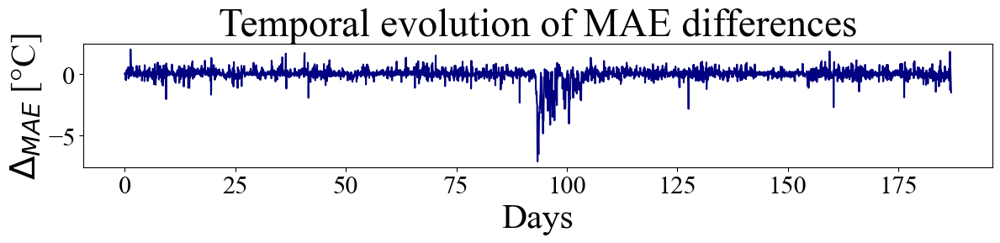

In [23]:
xfontsize = 30
yfontsize = 30
title_fontsize = 34
ticks_fontsize = 22

fig,ax = plt.subplots(1, figsize = (12,3))
t = np.arange(len(mae_evol_mixed_arpa_era5))/24
ax.plot(t,mae_evol_mixed_arpa_era5-mae_evol_era5, color = 'navy')
ax.set_xlabel("Days",fontsize = xfontsize)
ax.set_ylabel(r'$\Delta_{MAE}$ [°C]',fontsize = yfontsize)
ax.set_title('Temporal evolution of MAE differences', fontsize = title_fontsize) 
ax.tick_params(labelsize = ticks_fontsize)    
fig.tight_layout()
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/era5_machine_learning_figures/NovJun_temporal_evolution_temperature_mae_differences.png', dpi=150)
fig.savefig(RESULTS_PATH + '/figures/machine_learning_figures/mixed_arpa_era5_machine_learning_figures/NovJun_temporal_evolution_temperature_mae_differences.png', dpi=150)


# Predict temperature over the whole study area

This section shows how to derive all the temperature maps over the study area from 12/11/2022 to 22/06/2023 for the model trained on the Mixed ARPA ERA5 dataset.

In [5]:
ML = MachineLearningFFNN(model_type_name = 'Mixed ARPA ERA5',
                         model_period_name = 'NovJun',
                         df_filename = RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_06_22/df_microclimate_mixed_arpa_era5_NovJun_out_30-06-2023_12-42-55',              
                         input_variables = ['Short-wave radiation','Long-wave radiation', 'Wind', 'T_ref', 'H_ref','Precipitation', 'Pressure','Cloud-cover', 'Specific-humidity'],
                         target_variable = 'T_target',
                         max_n_neurons = 1024,
                         min_n_neurons = 128,
                         n_layers = 4,
                         learning_rate = 0.001,
                         activation = 'sigmoid',
                         loss = 'log_cosh',
                         metrics = ['mean_squared_error','mean_absolute_error'],
                        )

ML.load_model_properties(RESULTS_PATH+'/output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_mixed_arpa_era5/model_weights_temperature_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_temperature_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-14')


Metal device set to: Apple M1


2023-07-03 18:27:57.766950: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-07-03 18:27:57.767055: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-07-03 18:27:57.895237: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open /Users/marcozanchi/Work/Grade/microclima/notebooks/results//output_data/results_machine_learning/models_weights/models_weights_temperature/temperature_mixed_arpa_era5/model_weights_temperature_mixed_arpa_era5__2022_11_12__2023_06_22/FFNN_temperature_mixed_arpa_era5_NovJun_out_01-07-2023_09-03-14/model_weights: FAILED_PRECONDITION: /Users/marcozanchi/Work/Grade/microclima/notebooks/results/ou

In [6]:
T_maps = []

df_climate = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2022_11_12__2023_06_22.p')
for _,row in df_climate.iterrows():

    period = [int(row.Year), int(row.Month), int(row.Day), int(row.Hour)]

    T_map = ML.compute_microclimate_prediction_over_study_area(
                                                             df_climate = df_climate,
                                                             period = period, lat = lat, long = long,
                                                             dsm = dsm, resolution = resolution, slope = slope, aspect = aspect,
                                                             ha = ha, svf = svf,
                                                             study_area_coordinates = study_area_coordinates,
                                                             )

    T_maps.append([int(row.Year), int(row.Month), int(row.Day), int(row.Hour), T_map])


filename = RESULTS_PATH + '/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_06_22/temperature_maps_mixed_arpa_era5__2022_11_12__2023_06_22.p'
outfile = open(filename, 'wb')
pickle.dump(T_maps,outfile)
outfile.close()
    

2023-07-03 18:28:07.124473: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
